# mtDSB x Age DE analysis (pydeseq2, LRT-free)

In [100]:
import os
import numpy as np
import pandas as pd
from anndata import AnnData
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats
from statsmodels.stats.multitest import multipletests

import pandas as pd
import numpy as np
import scipy.sparse as sp
from collections import defaultdict

def _to_dense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)

def pseudobulk_by(
    adata,
    groupby=["cell_class", "region", "age", "condition"],
    layer=None,
    min_cells=30,
):
    """
    Create pseudobulk counts per unique combination of the groupby factors.

    Returns:
        pb_dict[cell_class][(region, age)] = (counts_df, meta_df)
        - counts_df: genes x pseudobulk-samples
        - meta_df:   rows = pseudobulk-samples (index = pb_key), cols = groupby fields
    """
    X = _to_dense(adata.layers[layer] if layer else adata.X)
    obs = adata.obs.copy()
    genes = adata.var_names

    # Build a stable pseudobulk key
    obs["pb_key"] = obs[groupby].astype(str).agg("__".join, axis=1)

    # Sum counts per pseudobulk key
    summed = (
        pd.DataFrame(X, index=obs["pb_key"], columns=genes)
        .groupby(level=0)
        .sum()
    )

    # Group metadata (indexed by pb_key already)
    meta = obs[groupby + ["pb_key"]].drop_duplicates("pb_key").set_index("pb_key")

    pb = defaultdict(dict)
    for key, row in meta.iterrows():
        cell_class = row["cell_class"]
        reg = row["region"]
        age = str(row["age"])

        # one pseudobulk column for this (cell_class, region, age, condition)
        counts_col = summed.loc[[key]].T
        counts_col.columns = [key]

        # pull the corresponding one-row metadata frame (indexed by pb_key)
        meta_row = meta.loc[[key]]

        if (reg, age) in pb[cell_class]:
            counts_df_all, meta_df = pb[cell_class][(reg, age)]
            counts_df_all = pd.concat([counts_df_all, counts_col], axis=1)
            meta_df = pd.concat([meta_df, meta_row], axis=0)
        else:
            counts_df_all = counts_col
            meta_df = meta_row

        pb[cell_class][(reg, age)] = (counts_df_all, meta_df)

    # Optional: drop group slots with too few cells total
    # (counts of cells in obs, not number of pseudobulk samples)
    to_prune = []
    for cl in list(pb.keys()):
        for (reg, age), (counts_df, meta_df) in list(pb[cl].items()):
            n_cells = (
                (obs["cell_class"] == cl)
                & (obs["region"] == reg)
                & (obs["age"].astype(str) == age)
            ).sum()
            if n_cells < min_cells:
                to_prune.append((cl, (reg, age)))
    for cl, key in to_prune:
        del pb[cl][key]

    return pb

# ---------- helpers from earlier ----------
def _align(counts_df, meta_df):
    if not counts_df.columns.equals(meta_df.index):
        common = counts_df.columns.intersection(meta_df.index)
        if len(common)==0:
            raise ValueError("No overlapping sample IDs")
        counts_df = counts_df.loc[:, common]
        meta_df   = meta_df.loc[common]
    return counts_df, meta_df

def _to_anndata(counts_df, meta_df):
    X = counts_df.T.astype(np.int64)
    ad = AnnData(X=X.values)
    ad.obs_names = X.index.astype(str)
    ad.var_names = counts_df.index.astype(str)
    ad.obs = meta_df.copy()
    return ad

def _prep_condition(mdf, condition_col="condition", ref_condition="control"):
    mdf = mdf.copy()
    mdf[condition_col] = mdf[condition_col].astype(str).str.strip()
    uniq = list(pd.unique(mdf[condition_col]))
    if ref_condition not in uniq:
        m = [u for u in uniq if u.lower()==ref_condition.lower()]
        if not m:
            raise ValueError(f"Ref '{ref_condition}' not present. Found: {uniq}")
        ref_condition = m[0]
    mdf[condition_col] = pd.Categorical(mdf[condition_col],
                                        categories=[ref_condition]+[u for u in uniq if u!=ref_condition],
                                        ordered=True)
    return mdf, ref_condition

def simple_effect_at_subset(counts_df, meta_df, mask, condition_col="condition",
                            ref_condition="control", n_cpus=8, label=""):
    """Generic: run mtDSB vs control inside boolean `mask` on meta_df."""
    counts_df, meta_df = _align(counts_df, meta_df)
    if mask.sum() < 2:
        raise ValueError(f"Not enough samples for subset: {label}")
    cdf = counts_df.loc[:, mask]
    mdf = meta_df.loc[mask].copy()
    mdf, ref_condition = _prep_condition(mdf, condition_col=condition_col, ref_condition=ref_condition)

    # detect case level
    cats = mdf[condition_col].cat.categories.tolist()
    case = [c for c in cats if c != ref_condition][0] if len(cats)>1 else None
    if case is None:
        raise ValueError(f"No case level in subset: {label}")

    ad = _to_anndata(cdf, mdf)
    dds = DeseqDataSet(adata=ad, design_factors=[condition_col],
                       refit_cooks=True, inference=DefaultInference(n_cpus=n_cpus))
    dds.deseq2()
    st = DeseqStats(dds, contrast=[condition_col, case, ref_condition], inference=DefaultInference(n_cpus=n_cpus))
    st.summary()
    res = st.results_df.copy()
    # standardize column names
    res = res.rename(columns={
        "log2FoldChange": f"log2FC_{case}_vs_{ref_condition}",
        "lfcSE":          f"lfcSE_{case}_vs_{ref_condition}",
        "pvalue":         f"pvalue_{case}_vs_{ref_condition}",
        "padj":           f"padj_{case}_vs_{ref_condition}",
    })
    res.attrs = {"subset_label": label, "case": case, "ref": ref_condition}
    return res

def combine_delta(res_A, res_B, lfc_prefix="log2FC_", se_prefix="lfcSE_",
                  p_colname="p_delta", q_colname="q_delta"):
    """Generic Δ (B − A) with z-test using SEs; works for ages or regions."""
    lfc_A = [c for c in res_A.columns if c.startswith(lfc_prefix)][0]
    se_A  = [c for c in res_A.columns if c.startswith(se_prefix)][0]
    lfc_B = [c for c in res_B.columns if c.startswith(lfc_prefix)][0]
    se_B  = [c for c in res_B.columns if c.startswith(se_prefix)][0]
    df = pd.DataFrame(index=res_A.index.union(res_B.index))
    df[lfc_A] = res_A[lfc_A]; df[se_A] = res_A[se_A]
    df[lfc_B] = res_B[lfc_B]; df[se_B] = res_B[se_B]
    df = df.dropna(subset=[lfc_A, se_A, lfc_B, se_B]).copy()
    df["delta_log2FC"] = df[lfc_B] - df[lfc_A]
    df["se_delta"] = np.sqrt(np.square(df[se_A]) + np.square(df[se_B]))
    df["se_delta"] = df["se_delta"].replace(0, np.nan)
    df = df.dropna(subset=["se_delta"])
    df["z"] = df["delta_log2FC"] / df["se_delta"]
    from scipy.stats import norm
    df[p_colname] = 2*(1 - norm.cdf(np.abs(df["z"])))
    df[q_colname] = multipletests(df[p_colname], method="fdr_bh")[1]
    return df

# ---------- NEW: region-aware analysis ----------
def run_by_region(pb,                      # dict: ct -> (counts_df, meta_df)
                  condition_col="condition",
                  age_col="age",
                  region_col="region",     # <- your anatomical label column
                  min_per_group=2,         # min samples per condition in a subset
                  n_cpus=8):
    """
    For each cell type & region:
      - per-age simple effect: mtDSB vs control within (region, age)
      - region impact score per age (intensity of effect)
      - region-vs-region ΔLFC at same age (interaction proxy)
    Returns nested dict: results[ct][region] -> {...}
    """
    results = {}
    for ct, (counts_df, meta_df) in pb.items():
        counts_df, meta_df = _align(counts_df, meta_df)
        # normalize fields
        md = meta_df.copy()
        md[age_col] = md[age_col].astype(str).str.strip()
        md[region_col] = md[region_col].astype(str).str.strip()
        md[condition_col] = md[condition_col].astype(str).str.strip()

        regions = list(pd.unique(md[region_col]))
        ages    = list(pd.unique(md[age_col]))
        ct_out = {}
        for reg in regions:
            reg_out = {"simple_effects": {}, "impact": {}, "age_list": ages, "region": reg}
            for a in ages:
                mask = (md[region_col]==reg) & (md[age_col]==a)
                # require at least min_per_group per condition
                if mask.sum() >= 2 and all((md.loc[mask, condition_col].value_counts() >= min_per_group).reindex(md[condition_col].unique(), fill_value=0)[:2]):
                    try:
                        res = simple_effect_at_subset(
                            counts_df, md, mask,
                            condition_col=condition_col, ref_condition="control",
                            n_cpus=n_cpus, label=f"{reg}@{a}"
                        )
                        reg_out["simple_effects"][a] = res
                        # impact score: count of sig genes & sum -log10(FDR) among sig
                        lfc_col = [c for c in res.columns if c.startswith("log2FC_")][0]
                        padj_col = [c for c in res.columns if c.startswith("padj_")][0]
                        sig = (res[padj_col] < 0.05) & (res[lfc_col].abs() >= 1.0)
                        reg_out["impact"][a] = {
                            "n_sig": int(sig.sum()),
                            "sum_neglog10q": float((-np.log10(res.loc[sig, padj_col].clip(lower=1e-300))).sum())
                        }
                    except Exception as e:
                        reg_out["simple_effects"][a] = None
                        reg_out["impact"][a] = {"n_sig": 0, "sum_neglog10q": 0.0}
                else:
                    reg_out["simple_effects"][a] = None
                    reg_out["impact"][a] = {"n_sig": 0, "sum_neglog10q": 0.0}
            ct_out[reg] = reg_out

        # region-vs-region ΔLFC at same age (interaction proxy)
        # For each age, compare each pair of regions’ mtDSB effects
        for regA, regB in [(r1, r2) for i, r1 in enumerate(regions) for r2 in regions[i+1:]]:
            for a in ages:
                resA = ct_out[regA]["simple_effects"].get(a)
                resB = ct_out[regB]["simple_effects"].get(a)
                if resA is None or resB is None:
                    continue
                dtab = combine_delta(resA, resB, p_colname="p_delta_region", q_colname="q_delta_region")
                if "deltas_region" not in ct_out[regA]:
                    ct_out[regA]["deltas_region"] = {}
                if "deltas_region" not in ct_out[regB]:
                    ct_out[regB]["deltas_region"] = {}
                ct_out[regA]["deltas_region"][(a, regB)] = dtab  # Δ = regB − regA at age a
                # also store the opposite direction (flip sign)
                dtab_flip = dtab.copy()
                dtab_flip["delta_log2FC"] = -dtab_flip["delta_log2FC"]
                dtab_flip["z"] = -dtab_flip["z"]
                ct_out[regB]["deltas_region"][(a, regA)] = dtab_flip

        results[ct] = ct_out
    return results

# ---------- ranking regions by "affectedness" ----------
def summarize_region_impact(results_by_region, ct, metric="sum_neglog10q", age=None):
    """
    Build a ranking table of regions by impact metric.
    metric: "n_sig" or "sum_neglog10q"
    age: specific age or None to aggregate across ages (sum).
    """
    rows = []
    for reg, d in results_by_region[ct].items():
        imp = d.get("impact", {})
        if age is None:
            vals = [imp[a][metric] for a in imp.keys()]
            score = np.nansum(vals)
        else:
            score = imp.get(str(age), {}).get(metric, 0.0) if str(age) in imp else 0.0
        rows.append({"region": reg, "score": score})
    out = pd.DataFrame(rows).sort_values("score", ascending=False).reset_index(drop=True)
    return out

from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats
import numpy as np
import pandas as pd
from statsmodels.stats.multitest import multipletests
from scipy.stats import norm

def _align(counts_df, meta_df):
    common = counts_df.columns.intersection(meta_df.index)
    return counts_df.loc[:, common], meta_df.loc[common]

def simple_effect_at_subset(counts_df, meta_df, mask, condition_col="condition",
                            ref_condition="control", n_cpus=8, label=""):
    counts_df, meta_df = _align(counts_df, meta_df)
    if mask.sum() < 2:
        raise ValueError(f"Not enough samples for subset {label}")
    cdf = counts_df.loc[:, mask]
    mdf = meta_df.loc[mask].copy()
    mdf[condition_col] = pd.Categorical(
        mdf[condition_col].astype(str),
        categories=[ref_condition] + [x for x in mdf[condition_col].unique() if x != ref_condition],
        ordered=True
    )
    adata = cdf.T
    inference = DefaultInference(n_cpus=n_cpus)
    dds = DeseqDataSet(adata=adata, clinical=mdf, design_factors=[condition_col],
                       refit_cooks=True, inference=inference)
    dds.deseq2()
    st = DeseqStats(dds, contrast=[condition_col, "mtDSB", ref_condition], inference=inference)
    st.summary()
    return st.results_df.copy()

def run_by_region(pb_class, condition_col="condition", age_col="age",
                  region_col="region", min_per_group=2, n_cpus=8):
    results = {}
    for cl, (counts_df, meta_df) in pb_class.items():
        md = meta_df.copy()
        md[age_col] = md[age_col].astype(str)
        md[region_col] = md[region_col].astype(str)
        md[condition_col] = md[condition_col].astype(str)
        ages = md[age_col].unique()
        regions = md[region_col].unique()

        cl_results = {}
        for reg in regions:
            reg_out = {"simple_effects": {}, "impact": {}}
            for age in ages:
                mask = (md[region_col]==reg) & (md[age_col]==age)
                if mask.sum() < 2: continue
                try:
                    res = simple_effect_at_subset(
                        counts_df, md, mask,
                        condition_col=condition_col,
                        ref_condition="control",
                        n_cpus=n_cpus,
                        label=f"{cl}_{reg}_{age}"
                    )
                    lfc_col = [c for c in res.columns if "log2FoldChange" in c][0]
                    padj_col = [c for c in res.columns if "padj" in c][0]
                    sig = (res[padj_col] < 0.05) & (res[lfc_col].abs() > 1)
                    reg_out["simple_effects"][age] = res
                    reg_out["impact"][age] = {
                        "n_sig": int(sig.sum()),
                        "sum_neglog10q": float((-np.log10(res.loc[sig, padj_col].clip(lower=1e-300))).sum())
                    }
                except Exception:
                    pass
            cl_results[reg] = reg_out
        results[cl] = cl_results
    return results

def summarize_region_impact(results_by_region, cell_class, metric="sum_neglog10q", age=None):
    rows = []
    for reg, d in results_by_region[cell_class].items():
        imp = d["impact"]
        if not imp: continue
        if age is None:
            vals = [v[metric] for v in imp.values()]
            score = np.nansum(vals)
        else:
            score = imp.get(str(age), {}).get(metric, 0.0)
        rows.append({"region": reg, "score": score})
    out = pd.DataFrame(rows).sort_values("score", ascending=False).reset_index(drop=True)
    return out
import numpy as np
import pandas as pd
from anndata import AnnData
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

def _as_anndata(counts_df, meta_df):
    ad = AnnData(counts_df.T)
    ad.obs = meta_df.copy()
    ad.var_names = counts_df.index
    ad.obs_names = counts_df.columns
    return ad

def run_by_region(
    pb_class,
    condition_col="condition",
    age_col="age",
    region_col="region",
    ref_condition="control",
    min_per_condition=2,
    n_cpus=8,
    verbose=True
):
    results = {}
    for cl, (counts_df, meta_df) in pb_class.items():
        counts_df, meta_df = counts_df.copy(), meta_df.copy()
        md = meta_df.copy()
        md[age_col] = md[age_col].astype(str)
        md[region_col] = md[region_col].astype(str)
        md[condition_col] = md[condition_col].astype(str)
        ages = sorted(md[age_col].unique(), key=lambda x: (len(x), x))
        regions = sorted(md[region_col].unique())
        inference = DefaultInference(n_cpus=n_cpus)

        cl_out = {}
        for reg in regions:
            reg_out = {"simple_effects": {}, "impact": {}}
            for age in ages:
                mask = (md[region_col]==reg) & (md[age_col]==age)
                sub = md.loc[mask]
                if sub.empty: 
                    continue
                vc = sub[condition_col].value_counts()
                if len(vc) < 2 or any(vc < min_per_condition):
                    if verbose: print(f"[{cl}] skip {reg}@{age} (counts {vc.to_dict()})")
                    continue
                case = [x for x in vc.index if x != ref_condition][0]
                if verbose: print(f"[{cl}] running {reg}@{age} ({vc.to_dict()})")

                ad = _as_anndata(counts_df.loc[:, sub.index], sub)
                dds = DeseqDataSet(
                    adata=ad,
                    design_factors=[condition_col],
                    refit_cooks=True,
                    inference=inference
                )
                dds.deseq2()
                st = DeseqStats(dds, contrast=[condition_col, case, ref_condition], inference=inference)
                st.summary()
                res = st.results_df.copy()

                lfc_col = "log2FoldChange"
                padj_col = "padj"
                sig = (res[padj_col] < 0.05) & (res[lfc_col].abs() >= 1.0)
                reg_out["simple_effects"][age] = res
                reg_out["impact"][age] = {
                    "n_sig": int(sig.sum()),
                    "sum_neglog10q": float((-np.log10(res.loc[sig, padj_col].clip(lower=1e-300))).sum())
                }

            cl_out[reg] = reg_out
        results[cl] = cl_out
    return results
import numpy as np
import matplotlib.pyplot as plt

def volcano_clean(
    res_df,
    lfc_col="log2FoldChange",
    padj_col="padj",
    title="mtDSB vs control",
    lfc_thr=1.0,
    q=0.05,
    label_top_fdr=10,           # top genes by FDR to label
    label_top_abs_lfc=10,       # top by |LFC|
    max_labels=20,              # absolute label cap
    highlight_genes=None,       # list of genes to force label
    figsize=(9,7),
    fontsize=13
):
    """Pretty volcano plot for DESeq2 / PyDESeq2 results."""

    df = res_df.copy().replace([np.inf, -np.inf], np.nan).dropna(subset=[lfc_col, padj_col])
    df["neglog10q"] = -np.log10(df[padj_col].clip(lower=1e-300))
    sig = (df[padj_col] < q) & (df[lfc_col].abs() >= lfc_thr)

    # pick label set
    idx_fdr = df.sort_values(padj_col).head(label_top_fdr).index
    idx_lfc = df.reindex(df[lfc_col].abs().sort_values(ascending=False).head(label_top_abs_lfc).index).index
    pick = set(idx_fdr).union(set(idx_lfc))
    if highlight_genes:
        pick.update(set(df.index.intersection(highlight_genes)))
    if len(pick) > max_labels:
        pick = set(df.loc[list(pick)].sort_values("neglog10q", ascending=False).head(max_labels).index)

    # figure
    plt.figure(figsize=figsize, dpi=150)
    plt.scatter(df[lfc_col], df["neglog10q"], s=16, alpha=0.35, color="lightgrey", label="not sig")
    up = df[sig & (df[lfc_col] > 0)]
    dn = df[sig & (df[lfc_col] < 0)]
    plt.scatter(up[lfc_col], up["neglog10q"], s=28, color="#d73027", label="Up (sig)")
    plt.scatter(dn[lfc_col], dn["neglog10q"], s=28, color="#4575b4", label="Down (sig)")

    # thresholds
    plt.axvline(+lfc_thr, ls="--", color="k", lw=1)
    plt.axvline(-lfc_thr, ls="--", color="k", lw=1)
    plt.axhline(-np.log10(q), ls="--", color="k", lw=1)

    plt.xlabel("log₂ fold change (mtDSB vs control)", fontsize=fontsize)
    plt.ylabel("-log₁₀(FDR)", fontsize=fontsize)
    plt.title(title, fontsize=fontsize+2, pad=10)

    # label genes
    texts = []
    try:
        from adjustText import adjust_text
        for g in pick:
            x, y = df.at[g, lfc_col], df.at[g, "neglog10q"]
            t = plt.text(x, y, g, fontsize=fontsize-3, va="bottom", ha="center")
            texts.append(t)
            plt.scatter([x],[y], s=40, edgecolor="black", linewidth=0.6, zorder=4)
        adjust_text(
            texts,
            only_move={'points':'y', 'text':'xy'},
            expand_points=(1.2, 1.4),
            expand_text=(1.1, 1.2),
            arrowprops=dict(arrowstyle="-", lw=0.8, color="0.25"),
        )
    except ImportError:
        for g in pick:
            x, y = df.at[g, lfc_col], df.at[g, "neglog10q"]
            plt.annotate(
                g, xy=(x, y), xytext=(x+0.2*np.sign(x), y+0.3),
                fontsize=fontsize-3,
                arrowprops=dict(arrowstyle="-", lw=0.8, color="0.25"),
                ha="center", va="bottom"
            )
            plt.scatter([x],[y], s=40, edgecolor="black", linewidth=0.6, zorder=4)

    plt.legend(frameon=False, fontsize=fontsize-3)
    plt.tight_layout()
    plt.show()
import scanpy as sc

## Read data

In [101]:
comp_annos = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered_manual_annotation_compartment.h5ad')

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1791: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [102]:
adata = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered_manual_annotation_with_raw.h5ad')

In [103]:
adata.obs['region'] = adata.obs.index.map(dict(zip(comp_annos.obs.index, comp_annos.obs.compartment)))

In [104]:
adata.obs["compartment"] = (
    adata.obs["region"]
    .replace({"Olfactory areas": "Olfactory areas + Hippocampal formation"})
    .astype("category")
)

In [105]:
adata.obs

,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,...,leiden_2,cell_class,sample_id,age,sex,genotype,condition,cell_type,region,compartment
cell_id,,,,,,,,,,,,,,,,,,,,,
aaaaakjg-1,67.136543,1092.286377,631,0,0,0,1,0,631.0,37.434533,...,23,Mature oligodendrocytes,RB4282,60,male,PlptTA,control,Mature oligodendrocytes IV,Isocortex,Isocortex
aaaaikjn-1,80.635910,779.488647,1102,0,0,0,2,0,1102.0,90.538285,...,6,Excitatory neurons,RB4282,60,male,PlptTA,control,Excitatory neurons I,Olfactory areas,Olfactory areas + Hippocampal formation
aaaapoln-1,67.554489,1513.168579,335,0,0,0,0,0,335.0,20.817032,...,15,Excitatory neurons,RB4282,60,male,PlptTA,control,Excitatory neurons III,Olfactory areas,Olfactory areas + Hippocampal formation
aaacmkgf-1,70.575630,1138.702881,1931,0,0,0,1,0,1931.0,81.055472,...,29,Excitatory neurons,RB4282,60,male,PlptTA,control,Excitatory neurons VI,Isocortex,Isocortex
aaaefdnf-1,583.425537,1142.197876,1105,0,0,0,1,0,1105.0,68.276252,...,14,Mature oligodendrocytes,RB4282,60,male,PlptTA,control,Mature oligodendrocytes III,Isocortex,Isocortex
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oifndkbo-1,2379.717529,4785.681152,419,0,0,0,0,0,419.0,42.221095,...,34,Olfactory astrocytes,RB4676,21,female,PlptTA,control,Olfactory astrocytes II,Hypothalamus,Hypothalamus
oifolalk-1,2281.881104,4803.725098,219,0,0,0,0,0,219.0,36.170158,...,17,Neurons,RB4676,21,female,PlptTA,control,Neurons II,Hypothalamus,Hypothalamus
oifphdni-1,2343.403564,4830.252441,76,0,0,0,0,0,76.0,14.946719,...,34,Olfactory astrocytes,RB4676,21,female,PlptTA,control,Olfactory astrocytes II,Hypothalamus,Hypothalamus


In [106]:
adata.X = adata.layers['counts']
adata.X = adata.X.astype(int)

In [154]:
glia_classes = [
    # --- Astrocytes ---
    "Telencephalon astrocytes",
    "Olfactory astrocytes",

    # --- Oligodendrocyte lineage ---
    "Mature oligodendrocytes",
    "Oligodendrocytes precursor cells",

    # --- Microglia ---
    "Microglia",
]

In [108]:
adata = adata[adata.obs.cell_class.isin(glia_classes)]

In [109]:
adata

View of AnnData object with n_obs × n_vars = 335167 × 5101
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'run', 'n_genes_by_counts', 'n_counts', 'n_genes', 'leiden_0.5', 'leiden_1', 'leiden_2', 'cell_class', 'sample_id', 'age', 'sex', 'genotype', 'condition', 'cell_type', 'region', 'compartment'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cell_class_colors', 'cell_type_colors', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

RB4282


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


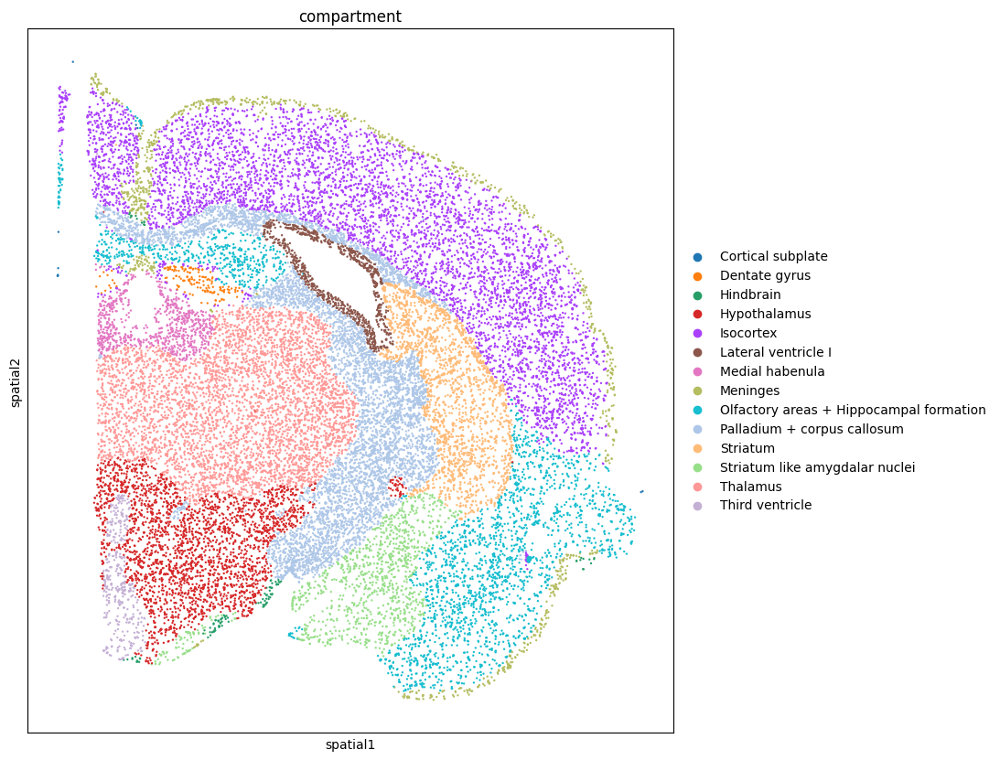

RB4350


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


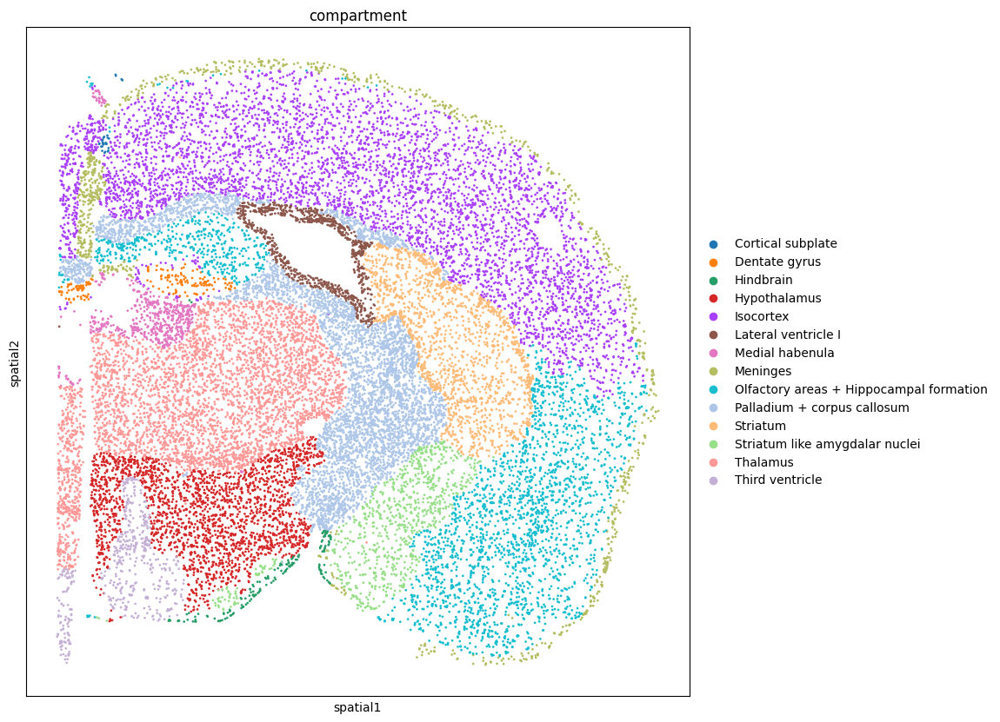

RB4401


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


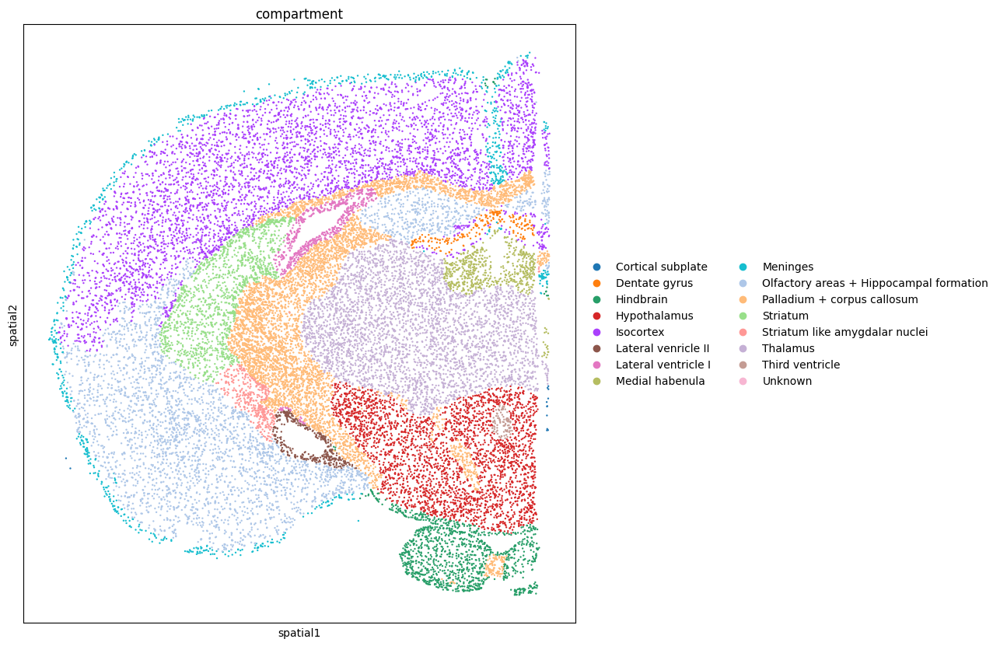

RB4403


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


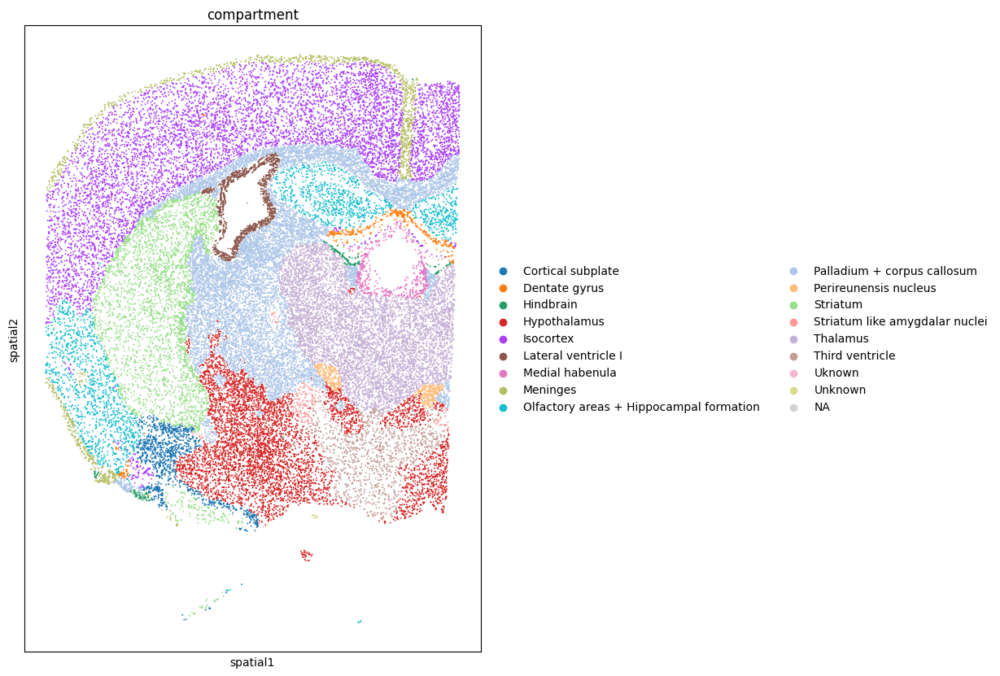

RB4405


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


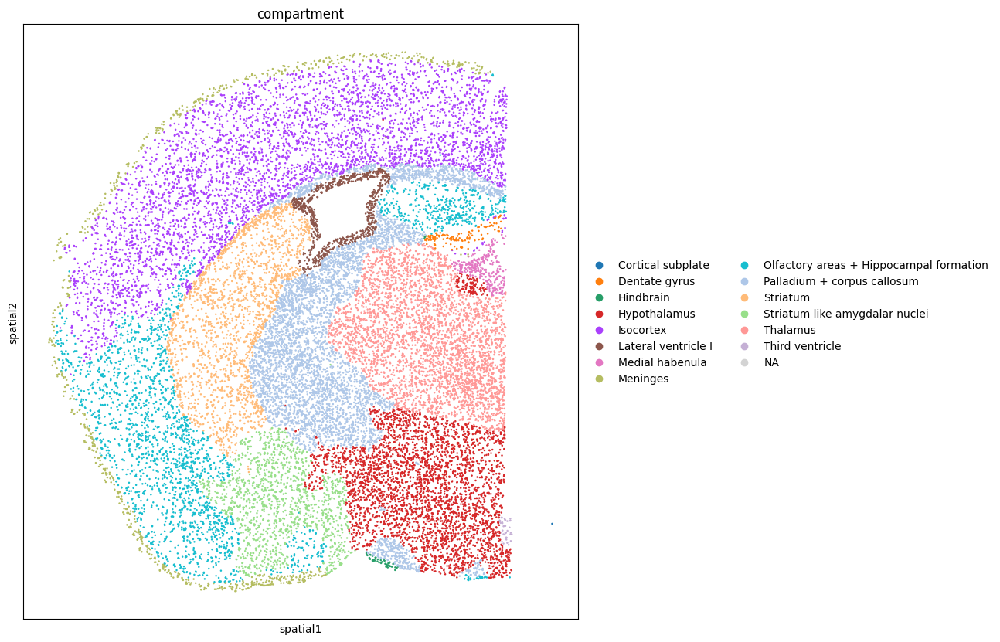

RB4498


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


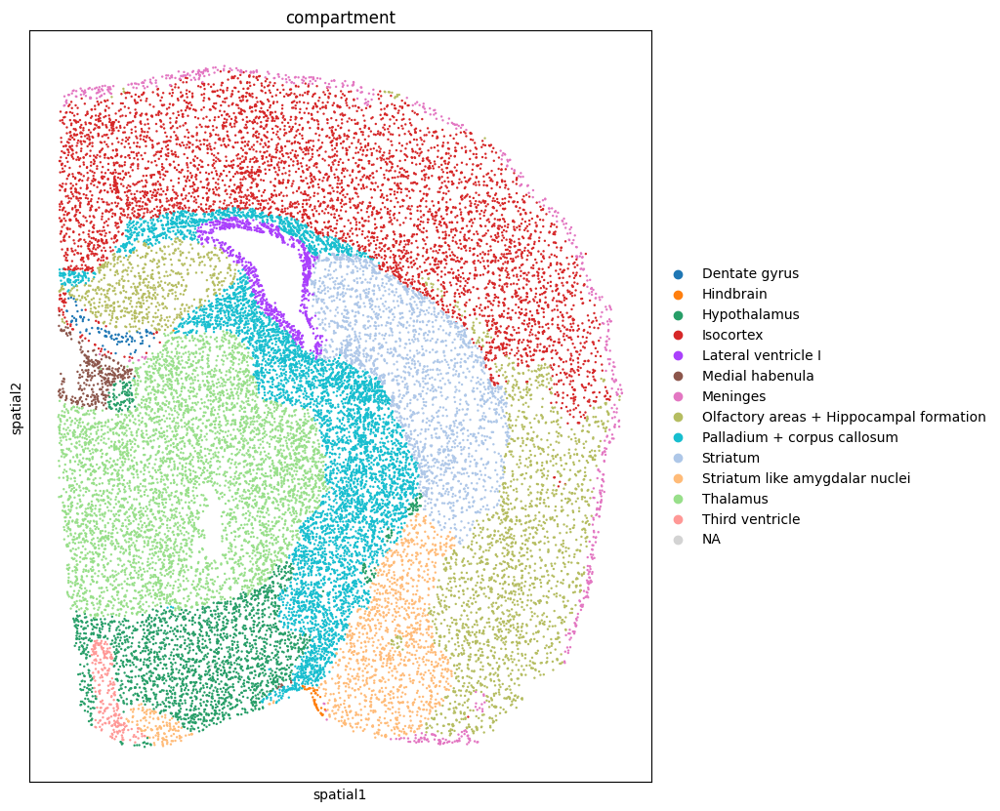

RB4620


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


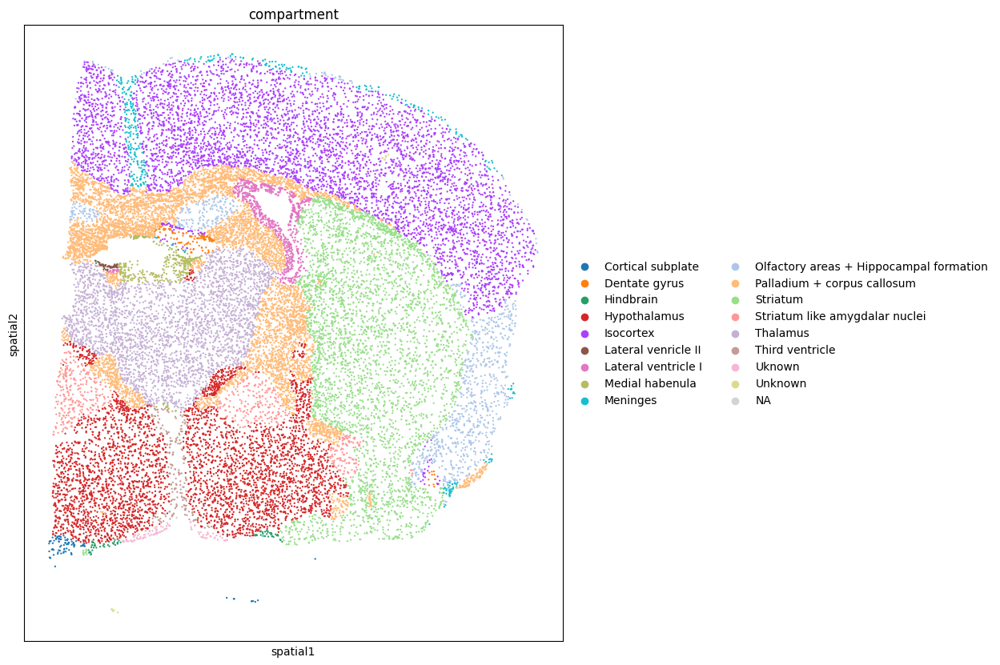

RB4627


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


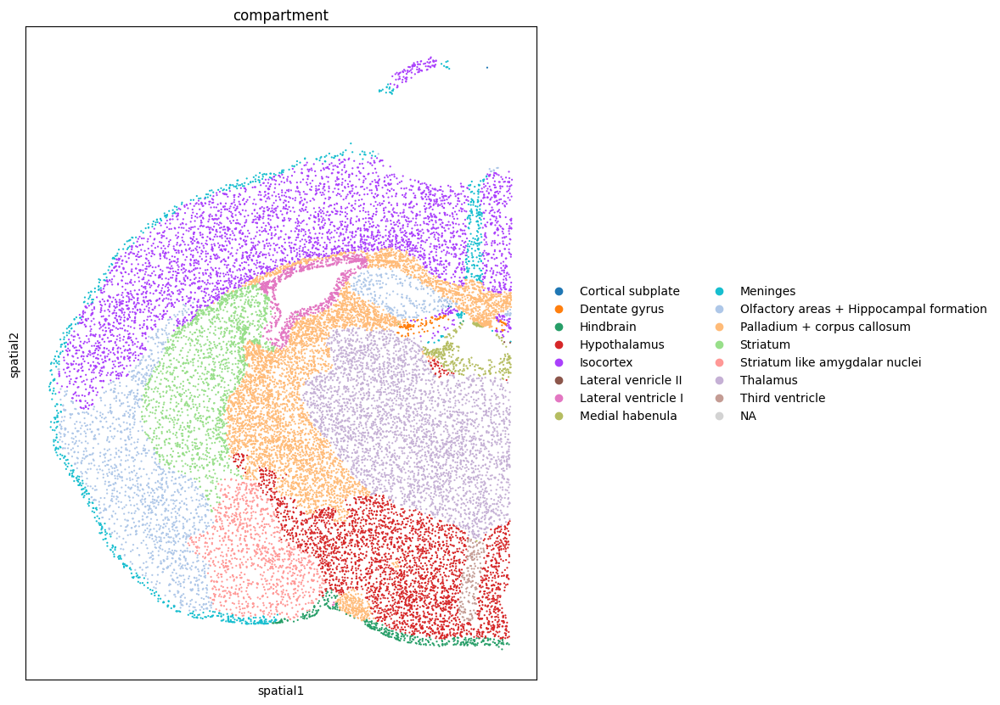

RB4630


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


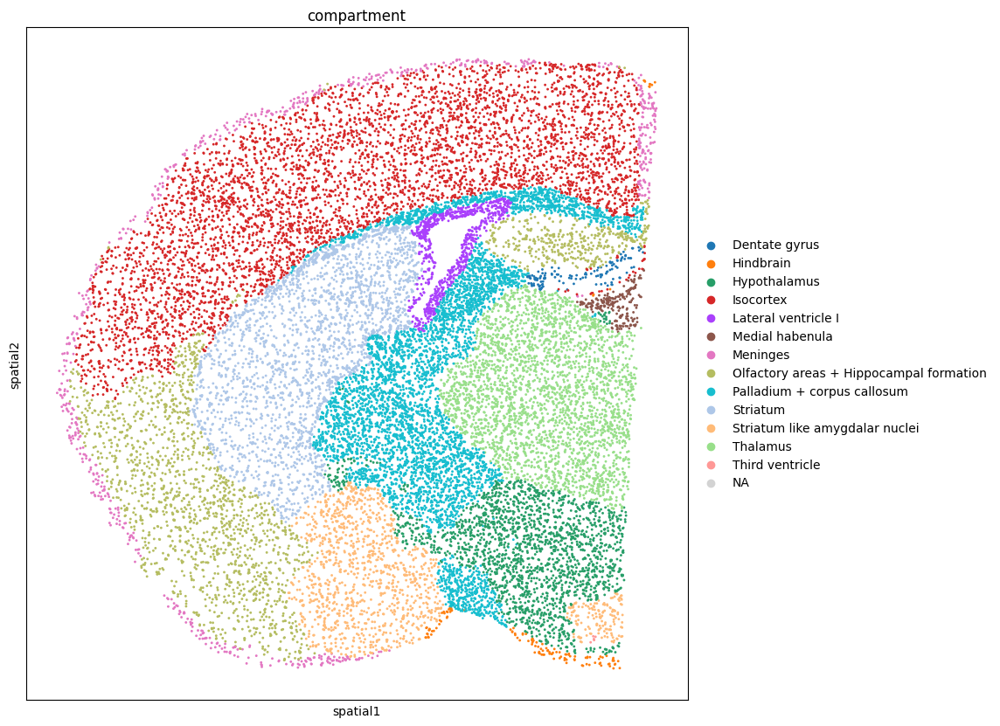

RB4653


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


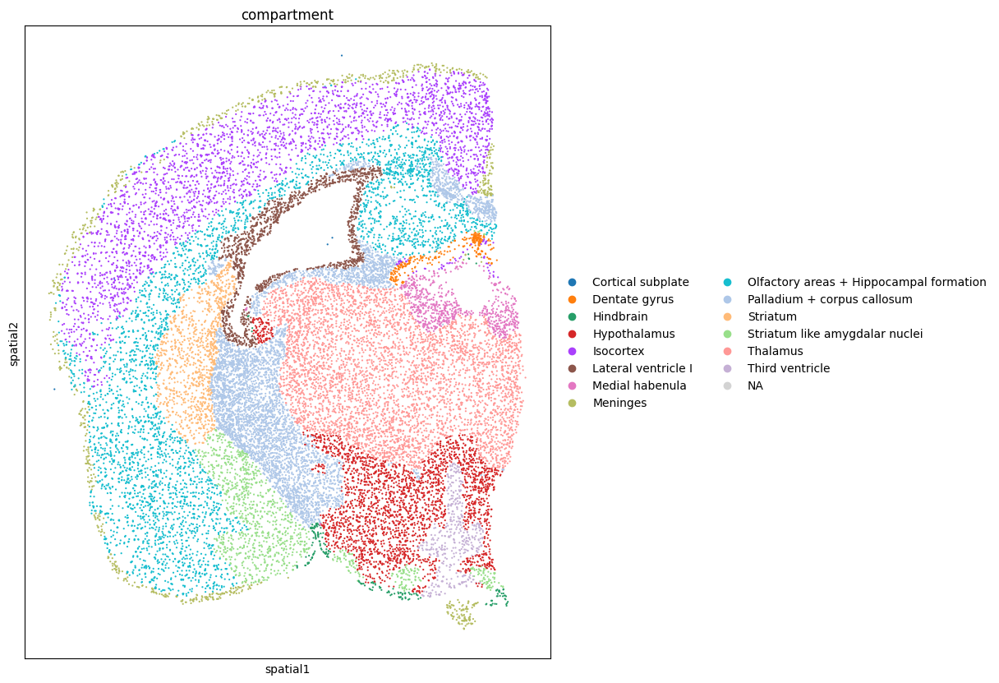

RB4658


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


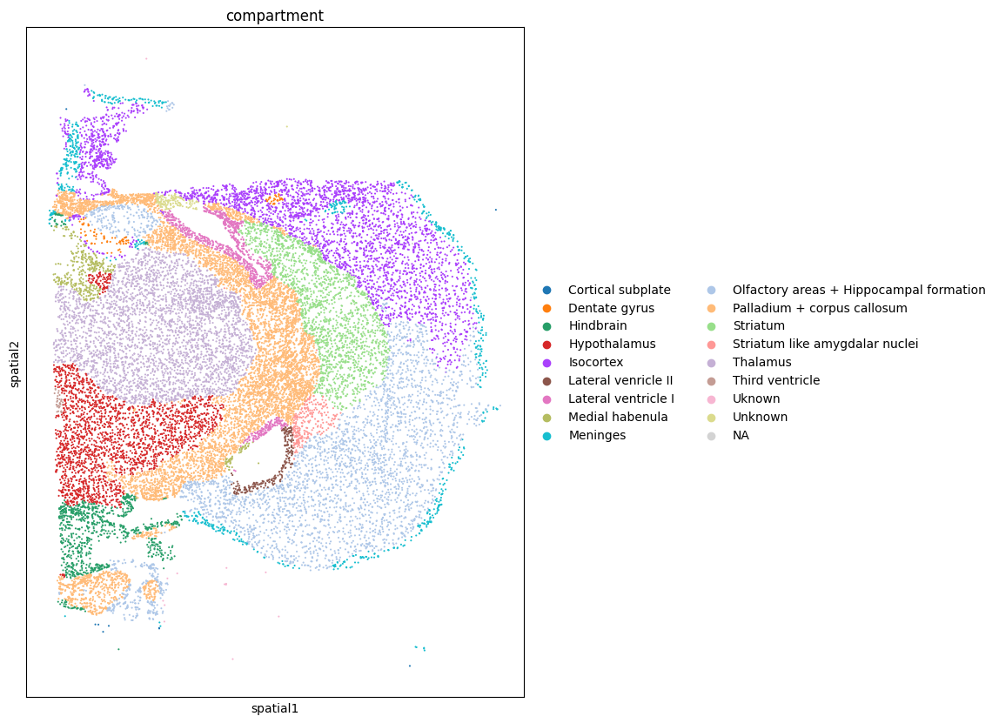

RB4676


/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


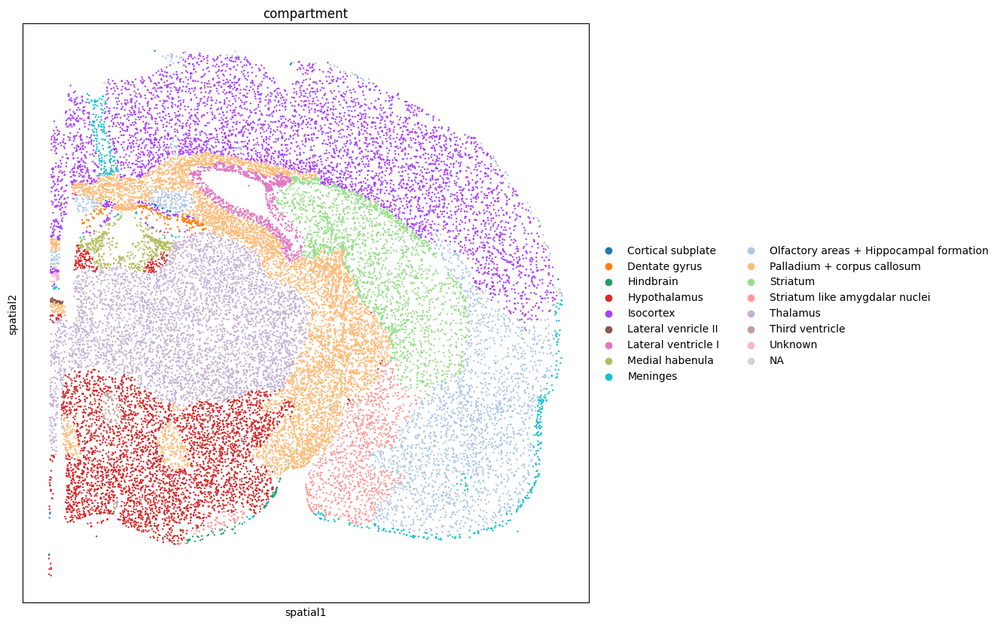

In [110]:
for run in adata.obs['sample_id'].unique():
    print(run)
    ad_int = adata[adata.obs['sample_id'] == run]

    with plt.rc_context({'figure.figsize': (20, 10)}):
        sc.pl.spatial(ad_int, spot_size=20, color = 'compartment')
    plt.show()
    

## Perform pseudobulk

In [111]:
pb = pseudobulk_by(
    adata,
    groupby=["cell_class", "region", "age", "condition", "sample_id"],  # 👈 add sample_id
    layer="counts" if "counts" in adata.layers else None,
    min_cells=30,
)

# Inspect one example
cell_type = "Mature oligodendrocytes"
region_age = list(pb[cell_type].keys())[0]
counts_df, meta_df = pb[cell_type][region_age]

print(region_age)
print("Counts shape:", counts_df.shape)
print(meta_df.head())

('Isocortex', '60')
Counts shape: (5101, 6)
                                                                 cell_class  \
pb_key                                                                        
Mature oligodendrocytes__Isocortex__60__control...  Mature oligodendrocytes   
Mature oligodendrocytes__Isocortex__60__control...  Mature oligodendrocytes   
Mature oligodendrocytes__Isocortex__60__mtDSB__...  Mature oligodendrocytes   
Mature oligodendrocytes__Isocortex__60__mtDSB__...  Mature oligodendrocytes   
Mature oligodendrocytes__Isocortex__60__mtDSB__...  Mature oligodendrocytes   

                                                       region age condition  \
pb_key                                                                        
Mature oligodendrocytes__Isocortex__60__control...  Isocortex  60   control   
Mature oligodendrocytes__Isocortex__60__control...  Isocortex  60   control   
Mature oligodendrocytes__Isocortex__60__mtDSB__...  Isocortex  60     mtDSB   
Mature 

In [112]:
pb_class = {}
for cl, regdict in pb.items():
    all_counts = []
    all_meta = []
    for (reg, age), (counts_df, meta_df) in regdict.items():
        all_counts.append(counts_df)
        all_meta.append(meta_df)
    counts_df_all = pd.concat(all_counts, axis=1)
    meta_df_all = pd.concat(all_meta)
    pb_class[cl] = (counts_df_all, meta_df_all)

In [113]:
counts_df, meta_df = pb_class["Mature oligodendrocytes"]
print("columns match index:", counts_df.columns.equals(meta_df.index))

columns match index: True


In [114]:
results_by_region = run_by_region(
    pb_class,
    condition_col="condition",
    age_col="age",
    region_col="region",
    ref_condition="control",
    min_per_condition=2,
    n_cpus=8,
    verbose=True
)

[Mature oligodendrocytes] skip Cortical subplate@21 (counts {'control': 3, 'mtDSB': 1})
[Mature oligodendrocytes] running Cortical subplate@60 ({'mtDSB': 3, 'control': 2})
Using None as control genes, passed at DeseqDataSet initialization


/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/519603999.py:405: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(
Fitting size factors...
... done in 0.00 seconds.

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: invalid value encountered in matmul
  return X @ coef_.T + self.intercept_
Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christo

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.421320       -1.831928  3.214944 -0.569816  0.568802   
9630013A20Rik  1.423291       -2.607439  3.040525 -0.857562  0.391134   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.167104       -0.498945  3.727452 -0.133857  0.893516   
Aatf           0.400279       -0.894795  2.532366 -0.353344  0.723831   
...                 ...             ...       ...       ...       ...   
Zswim9         0.175291       -0.450259  3.446156 -0.130656  0.896048   
Zup1           0.172562       -0.466974  3.504461 -0.133251  0.893995   
Zyx            2.750560       -0.863183  3.320989 -0.259917  0.794927   
Zzef1          0.070955       -0.983506  4.321723 -0.227573  0.819979   
a              0.001365       -1.734425  4.274867 -0.405726  0.684944   

                   padj  
2610035D17Rik  0.999839  
963001

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   2.723243        0.399970  1.208270  0.331027  0.740624   
9630013A20Rik  16.064564        2.756172  1.479527  1.862874  0.062480   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             2.326911        0.354908  1.297705  0.273489  0.784478   
Aatf            3.725675       -0.615293  0.991427 -0.620614  0.534854   
...                  ...             ...       ...       ...       ...   
Zswim9          1.126061       -0.816727  1.994770 -0.409434  0.682221   
Zup1            0.596411       -0.694510  2.419936 -0.286995  0.774116   
Zyx             3.142163        1.702087  1.220077  1.395065  0.162996   
Zzef1           2.446878        0.080439  1.214424  0.066237  0.947189   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   4.614423        0.525613  0.866432  0.606641  0.544089   
9630013A20Rik  13.427528        2.026540  1.285279  1.576731  0.114857   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             1.275863        2.404002  2.001730  1.200962  0.229766   
Aatf            4.506478       -0.502670  0.932316 -0.539163  0.589775   
...                  ...             ...       ...       ...       ...   
Zswim9          0.462984       -1.198066  2.653068 -0.451578  0.651573   
Zup1            1.278395       -0.352732  1.634198 -0.215844  0.829109   
Zyx             1.197886        0.862895  1.708526  0.505052  0.613522   
Zzef1           3.340678       -0.007747  1.016150 -0.007624  0.993917   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  4.091779        0.966791  1.160967  0.832747  0.404988   
9630013A20Rik  1.979771       -0.015691  1.840071 -0.008527  0.993196   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            2.330685        1.795974  1.943436  0.924123  0.355422   
Aatf           3.864452        0.759262  1.096215  0.692621  0.488547   
...                 ...             ...       ...       ...       ...   
Zswim9         0.453996        0.220081  1.994706  0.110333  0.912146   
Zup1           0.199303       -1.691407  2.573416 -0.657261  0.511013   
Zyx            1.522397       -0.308632  1.748332 -0.176529  0.859878   
Zzef1          2.166057        0.675182  1.531892  0.440750  0.659394   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999688  
963001

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   3.486925        0.995108  1.012659  0.982668  0.325771   
9630013A20Rik   9.452109        0.646217  1.620439  0.398791  0.690047   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            10.613988        0.631006  1.249666  0.504940  0.613601   
Aatf            7.667379       -0.083071  0.772301 -0.107563  0.914342   
...                  ...             ...       ...       ...       ...   
Zswim9          1.021852       -0.913351  1.961346 -0.465676  0.641448   
Zup1            0.264731        0.389682  2.557998  0.152339  0.878920   
Zyx             2.512501        1.483161  1.344336  1.103266  0.269912   
Zzef1           6.178117       -0.212404  1.125944 -0.188646  0.850371   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.17 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  146.961865        0.179645  0.235638  0.762374  0.445837   
9630013A20Rik  226.997098       -0.024289  0.802592 -0.030263  0.975857   
A1cf             0.590557        0.504826  2.720182  0.185585  0.852770   
A2m             19.710759        0.824138  0.585624  1.407282  0.159344   
Aatf           195.678868        0.063925  0.208847  0.306083  0.759541   
...                   ...             ...       ...       ...       ...   
Zswim9          35.366164       -0.028905  0.371186 -0.077873  0.937929   
Zup1            39.445658        0.106434  0.319328  0.333307  0.738902   
Zyx             70.349807       -0.088866  0.263182 -0.337659  0.735620   
Zzef1          156.776656        0.090180  0.194891  0.462721  0.643564   
a                0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D

... done in 0.18 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  167.831404        0.030923  0.205383  0.150565  0.880319   
9630013A20Rik  269.907111        1.329010  0.347532  3.824139  0.000131   
A1cf             0.431433        0.022169  3.521198  0.006296  0.994977   
A2m             35.420997        1.028340  0.560747  1.833874  0.066673   
Aatf           177.732897        0.244398  0.230496  1.060311  0.289003   
...                   ...             ...       ...       ...       ...   
Zswim9          43.723843       -0.477971  0.354707 -1.347511  0.177816   
Zup1            33.867917        0.270652  0.381590  0.709276  0.478153   
Zyx             60.831105        0.387755  0.344000  1.127195  0.259660   
Zzef1          162.284674       -0.125497  0.235027 -0.533970  0.593362   
a                1.448124       -3.396303  2.078571 -1.633960  0.102267   

                   padj  
2610035D

... done in 0.17 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  134.361641        0.209166  0.217052  0.963670  0.335211   
9630013A20Rik  297.957417        0.114148  0.258731  0.441185  0.659079   
A1cf             0.310901        1.976048  4.125428  0.478992  0.631944   
A2m              4.817031       -0.173831  1.128894 -0.153984  0.877623   
Aatf           184.005675        0.149315  0.193400  0.772054  0.440082   
...                   ...             ...       ...       ...       ...   
Zswim9          27.652172        0.049804  0.383576  0.129841  0.896693   
Zup1            34.413369        0.432878  0.336889  1.284926  0.198818   
Zyx            102.658934       -0.131295  0.227130 -0.578060  0.563224   
Zzef1          169.491255        0.032576  0.179653  0.181330  0.856109   
a                0.106381       -0.731333  4.444172 -0.164560  0.869290   

                   padj  
2610035D

... done in 0.18 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  199.561563        0.311468  0.178789  1.742099  0.081491   
9630013A20Rik  288.671284        0.169687  0.235763  0.719737  0.471687   
A1cf             0.522547       -1.334332  2.778394 -0.480253  0.631047   
A2m              3.595334       -0.139230  1.049698 -0.132638  0.894480   
Aatf           216.436215        0.148470  0.180407  0.822970  0.410525   
...                   ...             ...       ...       ...       ...   
Zswim9          36.918986        0.342933  0.346086  0.990889  0.321740   
Zup1            44.112806       -0.192299  0.326439 -0.589080  0.555808   
Zyx            135.993141        0.238528  0.210911  1.130943  0.258079   
Zzef1          217.804339       -0.105567  0.174357 -0.605468  0.544868   
a                0.410123        0.244867  3.318726  0.073783  0.941183   

                   padj  
2610035D

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   35.541934        0.189174  0.356196  0.531096  0.595352   
9630013A20Rik  164.354318       -0.166516  0.769244 -0.216467  0.828623   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m             14.901537       -1.900863  0.647882 -2.933963  0.003347   
Aatf            69.621796       -0.001740  0.288493 -0.006033  0.995186   
...                   ...             ...       ...       ...       ...   
Zswim9           7.445896       -0.214709  0.725267 -0.296041  0.767199   
Zup1            13.132436        0.154001  0.567240  0.271492  0.786013   
Zyx             36.268410       -0.157582  0.341285 -0.461732  0.644273   
Zzef1           42.836821        0.318200  0.328430  0.968854  0.332618   
a                0.087954        0.600494  4.445457  0.135080  0.892548   

                  padj  
2610035D1

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  42.088208        0.339165  0.338048  1.003305  0.315714   
9630013A20Rik  70.651068       -0.195781  0.328731 -0.595566  0.551465   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            11.196687        0.157042  0.619062  0.253678  0.799744   
Aatf           60.841767        0.062734  0.308916  0.203078  0.839074   
...                  ...             ...       ...       ...       ...   
Zswim9          9.514003       -0.322067  0.637320 -0.505346  0.613316   
Zup1           15.848706       -0.114637  0.526334 -0.217803  0.827583   
Zyx            27.782879        0.081089  0.442681  0.183178  0.854659   
Zzef1          44.531420       -0.103794  0.321296 -0.323047  0.746659   
a               0.084464        0.792399  4.454233  0.177898  0.858803   

                   padj  
2610035D17Rik  0.998

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  14.024299       -0.185050  0.580553 -0.318748  0.749918   
9630013A20Rik  29.409923       -2.222618  1.503191 -1.478600  0.139247   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            29.086718        0.756890  0.500598  1.511971  0.130541   
Aatf           17.702116        0.137748  0.464686  0.296432  0.766900   
...                  ...             ...       ...       ...       ...   
Zswim9          4.132586       -0.574060  0.967494 -0.593348  0.552948   
Zup1            4.031024        0.261305  0.929671  0.281072  0.778655   
Zyx             9.915778       -0.789997  0.625696 -1.262589  0.206737   
Zzef1          14.652771        0.296421  0.539017  0.549928  0.582369   
a               0.068823        0.793219  4.475521  0.177235  0.859324   

                   padj  
2610035D17Rik  0.998

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  19.519619        0.209933  0.441480  0.475522  0.634415   
9630013A20Rik  30.936811        0.231117  0.878715  0.263017  0.792538   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            34.365233        0.787602  0.506885  1.553808  0.120230   
Aatf           25.215854        0.033121  0.435270  0.076093  0.939345   
...                  ...             ...       ...       ...       ...   
Zswim9          3.861449        0.110172  0.911605  0.120854  0.903806   
Zup1            3.788929       -0.296650  0.956667 -0.310087  0.756495   
Zyx             7.039013        0.068808  0.691863  0.099454  0.920778   
Zzef1          18.318583       -0.477318  0.452106 -1.055766  0.291075   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   6.910427        1.375796  0.785051  1.752493  0.079689   
9630013A20Rik  41.228952        0.257448  0.416759  0.617739  0.536748   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             2.099259        0.809185  1.478693  0.547230  0.584221   
Aatf            7.646577        0.040182  0.733619  0.054773  0.956319   
...                  ...             ...       ...       ...       ...   
Zswim9          0.665856        1.151735  2.564846  0.449047  0.653398   
Zup1            1.116678        0.559394  1.842138  0.303666  0.761383   
Zyx             2.751333       -0.019019  1.216297 -0.015637  0.987524   
Zzef1           6.471642        0.817155  0.787302  1.037919  0.299308   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  10.765683        0.135832  0.597861  0.227196  0.820271   
9630013A20Rik  40.248569        0.984312  1.156347  0.851226  0.394644   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             1.218395        2.450694  1.937324  1.264989  0.205875   
Aatf           12.664315        0.102393  0.544123  0.188179  0.850736   
...                  ...             ...       ...       ...       ...   
Zswim9          1.598708       -1.719359  1.585081 -1.084714  0.278049   
Zup1            1.498448        1.863042  1.657607  1.123935  0.261041   
Zyx             6.506962       -0.017969  0.726191 -0.024744  0.980259   
Zzef1           9.670156       -0.096497  0.615730 -0.156719  0.875466   
a               0.000000             NaN       NaN       NaN       NaN   

                  padj  
2610035D17Rik  0.9989

... done in 0.16 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   57.281398        0.166138  0.307338  0.540571  0.588803   
9630013A20Rik  170.033836       -0.653843  0.789310 -0.828373  0.407459   
A1cf             0.325621       -0.185080  3.737587 -0.049519  0.960506   
A2m              5.350973       -1.472383  2.331596 -0.631492  0.527719   
Aatf            83.200844       -0.059886  0.260560 -0.229835  0.818220   
...                   ...             ...       ...       ...       ...   
Zswim9          11.983886        0.141789  0.606307  0.233857  0.815096   
Zup1            15.161431        0.866233  0.545903  1.586790  0.112560   
Zyx             40.311340        0.312448  0.333691  0.936339  0.349099   
Zzef1           72.967445        0.071521  0.267057  0.267810  0.788845   
a                0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D

... done in 0.21 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   78.772784       -0.056756  0.261019 -0.217440  0.827866   
9630013A20Rik  172.645937       -0.615807  0.285810 -2.154605  0.031193   
A1cf             0.352444       -1.873062  3.897214 -0.480616  0.630790   
A2m              2.029270        1.032952  1.419351  0.727764  0.466758   
Aatf            76.044256       -0.074334  0.260329 -0.285539  0.775232   
...                   ...             ...       ...       ...       ...   
Zswim9          14.443542       -0.554767  0.534728 -1.037475  0.299514   
Zup1            16.910214        0.591276  0.480992  1.229284  0.218965   
Zyx             41.281398       -0.085884  0.321426 -0.267197  0.789318   
Zzef1           81.694496       -0.318189  0.245056 -1.298435  0.194138   
a                0.176222       -0.864279  4.428124 -0.195179  0.845253   

                  padj  
2610035D1

... done in 0.18 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  225.677927        0.265635  0.215797  1.230949  0.218342   
9630013A20Rik  697.807049       -0.318586  0.223785 -1.423626  0.154555   
A1cf             0.848812        2.025225  2.261743  0.895427  0.370559   
A2m            106.959411       -0.040480  0.346254 -0.116909  0.906932   
Aatf           448.838583        0.058619  0.179360  0.326823  0.743802   
...                   ...             ...       ...       ...       ...   
Zswim9          54.170952        0.041376  0.282369  0.146532  0.883502   
Zup1            65.291285       -0.094775  0.255448 -0.371015  0.710626   
Zyx            213.359005       -0.164308  0.176851 -0.929075  0.352850   
Zzef1          258.171604        0.097349  0.181375  0.536731  0.591454   
a                0.150754        1.065737  4.426680  0.240753  0.809747   

                   padj  
2610035D

... done in 0.19 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  281.344786        0.294415  0.199620  1.474877  0.140246   
9630013A20Rik  543.245077        0.399358  0.336523  1.186720  0.235338   
A1cf             0.742810       -1.611022  2.565185 -0.628033  0.529982   
A2m            136.795199        0.907916  0.379950  2.389569  0.016868   
Aatf           432.004766        0.114219  0.213205  0.535723  0.592150   
...                   ...             ...       ...       ...       ...   
Zswim9          53.386250       -0.000655  0.305245 -0.002147  0.998287   
Zup1            71.550971        0.055458  0.265503  0.208877  0.834544   
Zyx            175.807234        0.103739  0.349091  0.297169  0.766338   
Zzef1          276.193299       -0.109964  0.172862 -0.636135  0.524689   
a                0.781181       -2.264458  2.538544 -0.892030  0.372377   

                   padj  
2610035D

... done in 0.16 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   76.637600        0.014950  0.265769  0.056252  0.955141   
9630013A20Rik  118.740338       -1.160332  0.283494 -4.092973  0.000043   
A1cf             0.474866        0.502752  3.111313  0.161588  0.871630   
A2m              1.920999        1.861766  1.417484  1.313429  0.189038   
Aatf           117.311433        0.100681  0.263337  0.382328  0.702218   
...                   ...             ...       ...       ...       ...   
Zswim9          15.811610       -0.057648  0.486467 -0.118504  0.905669   
Zup1            21.287198        0.298163  0.451213  0.660803  0.508738   
Zyx             67.308740       -0.264387  0.275749 -0.958797  0.337661   
Zzef1           94.282612        0.132911  0.247004  0.538095  0.590512   
a                0.135722       -0.460324  4.433790 -0.103822  0.917311   

                   padj  
2610035D

... done in 0.17 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   88.631639        0.066134  0.249645  0.264911  0.791078   
9630013A20Rik  130.119934        0.111135  0.837595  0.132684  0.894443   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m              3.074302        2.917484  1.451612  2.009824  0.044450   
Aatf           127.018885        0.125830  0.236575  0.531884  0.594806   
...                   ...             ...       ...       ...       ...   
Zswim9          21.867118       -0.129991  0.421992 -0.308042  0.758051   
Zup1            25.483991       -0.150557  0.405655 -0.371146  0.710529   
Zyx             61.305601       -0.092385  0.341489 -0.270537  0.786747   
Zzef1           96.725851       -0.185710  0.235753 -0.787732  0.430854   
a                0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  22.008052       -0.001142  0.414243 -0.002757  0.997800   
9630013A20Rik  60.217771        0.228317  0.536654  0.425445  0.670512   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             0.345224       -0.768666  2.776612 -0.276836  0.781906   
Aatf           29.091871       -0.070779  0.376908 -0.187788  0.851043   
...                  ...             ...       ...       ...       ...   
Zswim9          3.853401        0.352119  0.886290  0.397296  0.691149   
Zup1            3.991377       -0.109385  0.918746 -0.119059  0.905229   
Zyx             9.001055       -0.316315  0.633343 -0.499437  0.617471   
Zzef1          24.174510       -0.217479  0.410681 -0.529556  0.596420   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.16 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  26.634518        0.410007  0.385444  1.063729  0.287451   
9630013A20Rik  47.236260        1.110075  0.439738  2.524398  0.011590   
A1cf            0.100841       -0.106046  4.461799 -0.023767  0.981038   
A2m             1.557835        3.335007  1.846303  1.806316  0.070869   
Aatf           28.631176        0.122401  0.394590  0.310198  0.756410   
...                  ...             ...       ...       ...       ...   
Zswim9          3.999703        0.393042  0.883759  0.444739  0.656508   
Zup1            5.980693       -0.198592  0.724557 -0.274087  0.784018   
Zyx             8.340946       -0.502049  0.747846 -0.671327  0.502013   
Zzef1          23.419206        0.065231  0.404916  0.161098  0.872016   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.18 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  143.002951        0.181408  0.243521  0.744937  0.456310   
9630013A20Rik  234.068659        0.121636  0.317374  0.383258  0.701528   
A1cf             0.415999        2.123725  3.615689  0.587364  0.556959   
A2m             39.778673        0.627315  0.337405  1.859235  0.062994   
Aatf           239.940477        0.105679  0.248779  0.424788  0.670991   
...                   ...             ...       ...       ...       ...   
Zswim9          35.889537       -0.434591  0.367786 -1.181641  0.237348   
Zup1            36.075683       -0.006234  0.338480 -0.018417  0.985306   
Zyx            128.175692       -0.093614  0.204455 -0.457874  0.647043   
Zzef1          174.725304       -0.003898  0.194306 -0.020060  0.983996   
a                0.366967        1.886970  3.802397  0.496258  0.619712   

                   padj  
2610035D

... done in 0.19 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  194.315457        0.227332  0.225923  1.006238  0.314301   
9630013A20Rik  356.118445        0.262691  0.404179  0.649936  0.515733   
A1cf             1.088943       -2.162942  2.115035 -1.022651  0.306473   
A2m             91.587988        1.467484  0.333893  4.395074  0.000011   
Aatf           211.292893        0.032459  0.213014  0.152379  0.878888   
...                   ...             ...       ...       ...       ...   
Zswim9          36.627618       -0.285533  0.415248 -0.687621  0.491692   
Zup1            39.816258        0.204991  0.321857  0.636900  0.524190   
Zyx            131.454173        0.362012  0.269829  1.341633  0.179715   
Zzef1          178.919549        0.024371  0.213823  0.113976  0.909256   
a                0.136910        1.253665  4.428645  0.283081  0.777115   

                   padj  
2610035D

... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.393274        0.812946  1.270783  0.639720  0.522354   
9630013A20Rik  4.454506       -0.275484  1.197338 -0.230080  0.818029   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.186811        0.187601  2.490950  0.075313  0.939966   
Aatf           2.044818       -0.423330  1.497831 -0.282629  0.777462   
...                 ...             ...       ...       ...       ...   
Zswim9         0.385159       -0.369909  2.044732 -0.180909  0.856439   
Zup1           0.540270       -1.622476  2.018098 -0.803963  0.421418   
Zyx            0.743527       -1.135112  2.068254 -0.548826  0.583125   
Zzef1          1.573392        0.423340  1.558812  0.271579  0.785946   
a              0.038328        1.194338  3.375336  0.353843  0.723457   

                   padj  
2610035D17Rik  0.995333  
963001

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  5.936896        0.403520  0.890758  0.453008  0.650543   
9630013A20Rik  9.170866        0.847557  1.825236  0.464354  0.642394   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.735934       -3.239784  2.125861 -1.523987  0.127512   
Aatf           4.244110        0.179270  0.994250  0.180307  0.856912   
...                 ...             ...       ...       ...       ...   
Zswim9         0.543530       -0.210798  1.953983 -0.107881  0.914090   
Zup1           1.049078       -0.480810  1.431761 -0.335817  0.737009   
Zyx            1.995732       -0.154274  1.394483 -0.110631  0.911909   
Zzef1          4.854576        0.746048  1.202752  0.620284  0.535071   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999744  
963001

... done in 0.11 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.11 seconds.

/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/519603999.py:405: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(
Fitting size factors...
... done in 0.00 seconds.

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_mode

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.300810        3.178115  4.871809  0.652348  0.514177   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.000000             NaN       NaN       NaN       NaN   
Aatf           0.137280        0.059121  4.973677  0.011887  0.990516   
...                 ...             ...       ...       ...       ...   
Zswim9         0.030856        1.207266  5.099653  0.236735  0.812862   
Zup1           0.000000             NaN       NaN       NaN       NaN   
Zyx            0.000000             NaN       NaN       NaN       NaN   
Zzef1          0.000000             NaN       NaN       NaN       NaN   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.995243  
963001

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   6.005653       -0.540286  0.766859 -0.704544  0.481094   
9630013A20Rik   0.809977        0.642792  2.177800  0.295157  0.767874   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            26.047241       -0.230812  0.541364 -0.426352  0.669851   
Aatf            5.189823        0.416384  0.822141  0.506463  0.612532   
...                  ...             ...       ...       ...       ...   
Zswim9          1.432395       -3.259075  1.886216 -1.727837  0.084017   
Zup1            2.621757        0.294118  1.273143  0.231017  0.817302   
Zyx             2.622771       -0.132415  1.206740 -0.109730  0.912624   
Zzef1           6.207128       -0.831845  0.752735 -1.105097  0.269117   
a               0.336201       -0.643389  3.284421 -0.195891  0.844695   

                   padj  
2610035D17Rik  0.998

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   9.634123       -0.292544  0.615647 -0.475181  0.634658   
9630013A20Rik   0.112820        0.487850  4.401962  0.110826  0.911755   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            18.780522        1.321488  1.227154  1.076872  0.281537   
Aatf            6.793985        0.609500  0.737656  0.826266  0.408653   
...                  ...             ...       ...       ...       ...   
Zswim9          1.591923        0.014970  1.447070  0.010345  0.991746   
Zup1            2.605378        0.760121  1.157803  0.656520  0.511490   
Zyx             4.115936       -0.186084  0.937215 -0.198550  0.842615   
Zzef1          10.320062       -0.526759  0.600325 -0.877456  0.380239   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   6.792579       -0.102167  0.747611 -0.136657  0.891302   
9630013A20Rik   0.136910       -1.735059  4.431410 -0.391537  0.695401   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            74.179656        0.693058  0.431547  1.605984  0.108277   
Aatf            4.845543        0.267465  0.852932  0.313583  0.753838   
...                  ...             ...       ...       ...       ...   
Zswim9          1.252467        0.441601  1.654045  0.266983  0.789483   
Zup1            1.826709       -0.432925  1.573963 -0.275054  0.783275   
Zyx             1.243289       -1.038252  1.706343 -0.608466  0.542878   
Zzef1           6.192874       -0.309947  0.804167 -0.385427  0.699921   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik    4.426657       -0.884654  0.964439 -0.917273  0.358999   
9630013A20Rik    0.952285       -0.452290  2.066224 -0.218897  0.826730   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            101.051353        0.506316  0.404392  1.252043  0.210554   
Aatf             3.475839        0.099997  0.993238  0.100677  0.919807   
...                   ...             ...       ...       ...       ...   
Zswim9           0.652414       -1.294370  2.174482 -0.595255  0.551673   
Zup1             1.137726       -0.938152  1.710731 -0.548392  0.583422   
Zyx              3.111079        0.382729  1.092523  0.350317  0.726101   
Zzef1            4.574482       -0.558031  0.910874 -0.612632  0.540120   
a                0.000000             NaN       NaN       NaN       NaN   

                 padj  
2610035D17

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/pytho

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.204071       -0.326692  1.533095 -0.213093  0.831254   
9630013A20Rik  0.307407        0.746796  2.796145  0.267081  0.789407   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            2.132656       -1.444997  1.467188 -0.984875  0.324685   
Aatf           0.827823        2.146454  2.263368  0.948345  0.342954   
...                 ...             ...       ...       ...       ...   
Zswim9         0.121236       -0.708648  4.444805 -0.159433  0.873328   
Zup1           0.439647       -0.465379  2.198811 -0.211650  0.832380   
Zyx            0.203454        1.371184  4.420258  0.310204  0.756406   
Zzef1          0.376260        2.043291  3.015871  0.677513  0.498081   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.992216  
963001

Fitting dispersions...
... done in 0.11 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   1.250358       -0.221336  1.462197 -0.151372  0.879682   
9630013A20Rik   1.133629        2.738048  2.535233  1.079998  0.280143   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            10.844304       -1.639197  1.469549 -1.115442  0.264661   
Aatf            1.523098       -1.163873  1.380913 -0.842829  0.399324   
...                  ...             ...       ...       ...       ...   
Zswim9          0.773245       -1.411306  1.894811 -0.744827  0.456376   
Zup1            0.826568        0.693316  1.957066  0.354263  0.723142   
Zyx             0.941384       -0.257710  1.736057 -0.148446  0.881991   
Zzef1           0.544383       -0.204142  1.922685 -0.106176  0.915443   
a               0.083061        0.167633  3.541510  0.047334  0.962247   

                  padj  
2610035D17Rik  0.9998

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   87.652250        0.147349  0.241925  0.609068  0.542479   
9630013A20Rik    8.498389       -0.840349  0.634839 -1.323719  0.185596   
A1cf             0.202375       -0.936792  4.303340 -0.217689  0.827671   
A2m             30.958543        0.093336  0.460567  0.202655  0.839405   
Aatf           132.274840       -0.039430  0.188579 -0.209087  0.834380   
...                   ...             ...       ...       ...       ...   
Zswim9          28.870888        0.098388  0.352868  0.278822  0.780381   
Zup1            51.124708        0.393673  0.282218  1.394921  0.163040   
Zyx             57.224980       -0.284606  0.261423 -1.088681  0.276295   
Zzef1          160.497189        0.056050  0.196493  0.285253  0.775450   
a                0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D

... done in 0.17 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  131.970679        0.353209  0.194925  1.812026  0.069982   
9630013A20Rik   10.337914        0.342550  0.625518  0.547627  0.583948   
A1cf             0.306411        1.541481  3.566650  0.432193  0.665601   
A2m             28.942846        1.142243  0.420849  2.714141  0.006645   
Aatf           145.207518        0.164609  0.190525  0.863976  0.387601   
...                   ...             ...       ...       ...       ...   
Zswim9          40.934980        0.296220  0.303703  0.975360  0.329382   
Zup1            66.199205       -0.090075  0.279388 -0.322401  0.747149   
Zyx             79.507798       -0.237043  0.236152 -1.003776  0.315487   
Zzef1          184.389960       -0.180884  0.168143 -1.075775  0.282028   
a                0.650855       -0.353899  2.268858 -0.155981  0.876048   

                   padj  
2610035D

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  25.148465        0.048774  0.394321  0.123690  0.901561   
9630013A20Rik   8.712904        0.118309  0.716925  0.165024  0.868925   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            77.398153       -0.562405  1.060798 -0.530171  0.595993   
Aatf           23.985338       -0.294699  0.406834 -0.724373  0.468837   
...                  ...             ...       ...       ...       ...   
Zswim9          5.828089       -0.334393  0.765917 -0.436592  0.662407   
Zup1            8.103402        0.402632  0.652027  0.617508  0.536899   
Zyx             8.682317       -0.045809  0.666512 -0.068729  0.945205   
Zzef1          17.628807        0.013372  0.446620  0.029940  0.976115   
a               0.000000             NaN       NaN       NaN       NaN   

                  padj  
2610035D17Rik  0.9992

Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  17.074587       -0.594088  0.456990 -1.300001  0.193600   
9630013A20Rik   2.597189        1.247194  1.169753  1.066203  0.286332   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            51.182440        0.976145  0.628010  1.554347  0.120102   
Aatf           17.374823       -0.214866  0.481346 -0.446384  0.655320   
...                  ...             ...       ...       ...       ...   
Zswim9          4.311124        1.736700  0.950355  1.827423  0.067636   
Zup1            8.609341        0.589729  0.633618  0.930733  0.351992   
Zyx             3.745734        1.768449  1.050850  1.682874  0.092399   
Zzef1          11.279769       -0.304873  0.565645 -0.538982  0.589899   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik    5.493849       -0.499067  0.803251 -0.621308  0.534397   
9630013A20Rik    1.502361        0.257184  1.506315  0.170737  0.864430   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            109.136728        0.484723  0.319749  1.515948  0.129533   
Aatf             5.192833       -1.036464  0.838496 -1.236099  0.216422   
...                   ...             ...       ...       ...       ...   
Zswim9           1.194283        0.256806  1.598502  0.160654  0.872366   
Zup1             1.752379       -0.218149  1.351412 -0.161423  0.871760   
Zyx              1.557999       -1.767984  1.613208 -1.095943  0.273104   
Zzef1            5.391122       -0.769724  0.793120 -0.970501  0.331797   
a                0.126759       -0.285201  4.434873 -0.064309  0.948724   

                   padj  
2610035D

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik    6.672835       -0.694409  0.715017 -0.971178  0.331460   
9630013A20Rik    1.735685       -2.237959  1.625039 -1.377172  0.168459   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            109.637106        0.511342  0.297856  1.716742  0.086026   
Aatf             3.017997        1.096407  1.129039  0.971098  0.331499   
...                   ...             ...       ...       ...       ...   
Zswim9           1.347118        0.917969  1.524548  0.602125  0.547091   
Zup1             2.446300       -0.087758  1.113333 -0.078824  0.937172   
Zyx              3.703182       -0.165799  0.943366 -0.175753  0.860488   
Zzef1            5.537914       -0.766623  0.803163 -0.954505  0.339828   
a                0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  27.678603       -0.001051  0.380877 -0.002759  0.997799   
9630013A20Rik   2.565765       -0.513799  1.142028 -0.449901  0.652782   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            63.423594        1.498930  0.671948  2.230722  0.025700   
Aatf           27.727356       -0.186000  0.370500 -0.502025  0.615650   
...                  ...             ...       ...       ...       ...   
Zswim9          7.705520       -0.297361  0.710959 -0.418253  0.675762   
Zup1           10.514662        0.407170  0.596991  0.682036  0.495216   
Zyx            11.746033       -0.123124  0.596252 -0.206496  0.836404   
Zzef1          40.748231       -0.075903  0.317913 -0.238756  0.811295   
a               0.146257       -1.569583  4.429774 -0.354326  0.723095   

                   padj  
2610035D17Rik  0.999

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  38.176647       -0.059839  0.315967 -0.189385  0.849791   
9630013A20Rik   2.597186       -0.081117  1.140220 -0.071141  0.943285   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            66.141267        0.532331  0.703920  0.756238  0.449506   
Aatf           40.813709       -0.087985  0.311361 -0.282583  0.777496   
...                  ...             ...       ...       ...       ...   
Zswim9          9.492004        0.287200  0.603195  0.476131  0.633981   
Zup1           19.140957        0.512688  0.455145  1.126429  0.259984   
Zyx            22.128718        0.580118  0.410169  1.414340  0.157262   
Zzef1          40.222977       -0.181355  0.330542 -0.548660  0.583239   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  73.835544       -0.137093  0.249114 -0.550322  0.582099   
9630013A20Rik   4.354433        1.496740  1.076335  1.390589  0.164350   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            50.922244       -0.644487  1.170279 -0.550713  0.581831   
Aatf           66.816910        0.233825  0.272277  0.858775  0.390465   
...                  ...             ...       ...       ...       ...   
Zswim9         15.704226       -0.269482  0.522410 -0.515844  0.605964   
Zup1           30.344958       -0.142896  0.380548 -0.375501  0.707288   
Zyx            35.942545        0.198840  0.353190  0.562982  0.573447   
Zzef1          98.408611       -0.037142  0.222720 -0.166766  0.867554   
a               0.343242       -0.592622  3.536634 -0.167567  0.866924   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.16 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  119.544720        0.078532  0.215810  0.363892  0.715939   
9630013A20Rik    9.723606        0.027339  0.635803  0.042999  0.965702   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m             27.359621        0.273115  0.435828  0.626657  0.530884   
Aatf            87.255474       -0.229930  0.232038 -0.990916  0.321727   
...                   ...             ...       ...       ...       ...   
Zswim9          19.011824       -0.188868  0.451372 -0.418431  0.675632   
Zup1            42.796580       -0.268611  0.317874 -0.845026  0.398096   
Zyx             47.659581       -0.083782  0.306915 -0.272980  0.784869   
Zzef1          104.306259       -0.097561  0.219874 -0.443712  0.657251   
a                0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   42.080482       -0.331682  0.319513 -1.038086  0.299230   
9630013A20Rik   13.809893       -0.950313  0.537393 -1.768378  0.076998   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            294.450316        0.484877  0.592879  0.817836  0.413451   
Aatf            42.263511        0.239413  0.339728  0.704719  0.480985   
...                   ...             ...       ...       ...       ...   
Zswim9           8.752118        0.356535  0.667463  0.534164  0.593228   
Zup1            12.894154        0.440991  0.543279  0.811720  0.416952   
Zyx             18.334483        0.035495  0.457594  0.077568  0.938172   
Zzef1           31.978568        0.127036  0.360475  0.352413  0.724529   
a                0.130208       -0.464258  4.427724 -0.104852  0.916493   

                   padj  
2610035D

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   43.139527       -0.029628  0.331007 -0.089509  0.928678   
9630013A20Rik   20.134858        1.306691  0.615801  2.121937  0.033843   
A1cf             0.137818        0.579441  4.415153  0.131239  0.895586   
A2m            312.440204       -0.222541  0.678039 -0.328213  0.742751   
Aatf            37.850593       -0.315981  0.340650 -0.927583  0.353624   
...                   ...             ...       ...       ...       ...   
Zswim9           9.355895       -0.613168  0.631775 -0.970547  0.331774   
Zup1            17.346222        0.571948  0.491668  1.163281  0.244716   
Zyx             14.483448        0.363442  0.514046  0.707024  0.479552   
Zzef1           32.485759        0.213433  0.370137  0.576634  0.564187   
a                0.137818        0.579441  4.415153  0.131239  0.895586   

                   padj  
2610035D

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  33.037638        0.015128  0.326395  0.046350  0.963031   
9630013A20Rik   2.337187       -0.581464  1.202322 -0.483617  0.628658   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            11.306038        0.519382  0.534438  0.971828  0.331136   
Aatf           26.037836        0.143034  0.360835  0.396398  0.691812   
...                  ...             ...       ...       ...       ...   
Zswim9          6.983233        0.698724  0.667854  1.046223  0.295458   
Zup1           16.548643        0.196351  0.460392  0.426485  0.669754   
Zyx             9.493651        0.138802  0.573929  0.241845  0.808900   
Zzef1          44.674369       -0.200791  0.292289 -0.686961  0.492107   
a               0.187930        1.527082  4.223362  0.361580  0.717666   

                   padj  
2610035D17Rik  0.998

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  39.893902       -0.126403  0.310500 -0.407095  0.683938   
9630013A20Rik   3.789379        0.824266  0.944015  0.873150  0.382581   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            10.481503        0.925494  0.630034  1.468958  0.141844   
Aatf           29.251528        0.096703  0.352536  0.274308  0.783848   
...                  ...             ...       ...       ...       ...   
Zswim9          7.010638       -0.146364  0.670529 -0.218281  0.827210   
Zup1           15.144983        0.452519  0.507266  0.892074  0.372353   
Zyx             7.418969        0.503254  0.658815  0.763879  0.444940   
Zzef1          37.800757       -0.235366  0.304002 -0.774224  0.438798   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  20.173310        0.222839  0.425558  0.523639  0.600530   
9630013A20Rik   0.384564       -0.509097  2.857201 -0.178180  0.858581   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            17.606074       -2.347100  0.665676 -3.525888  0.000422   
Aatf           11.328141        0.075801  0.586734  0.129191  0.897207   
...                  ...             ...       ...       ...       ...   
Zswim9          4.404816       -0.215022  0.927355 -0.231866  0.816642   
Zup1            4.958169       -0.246816  0.845967 -0.291756  0.770473   
Zyx             3.010088        0.247786  1.036962  0.238954  0.811141   
Zzef1          14.855995        0.770926  0.514657  1.497942  0.134148   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997

... done in 0.11 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  15.997191       -0.192662  0.633576 -0.304087  0.761062   
9630013A20Rik   0.525306        2.862973  1.648287  1.736939  0.082398   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            16.500263        0.627035  2.199494  0.285082  0.775582   
Aatf            6.167193        0.030241  0.730595  0.041393  0.966983   
...                  ...             ...       ...       ...       ...   
Zswim9          1.863935       -0.200213  0.890840 -0.224747  0.822176   
Zup1            4.054940       -0.240546  0.763993 -0.314854  0.752873   
Zyx             2.619735       -0.077458  0.827426 -0.093614  0.925416   
Zzef1          11.604987       -0.379691  0.665782 -0.570294  0.568478   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   1.185362       -1.676161  1.774482 -0.944592  0.344867   
9630013A20Rik   0.191936       -0.605685  2.750390 -0.220218  0.825702   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            11.872511       -0.408021  1.567276 -0.260338  0.794603   
Aatf            1.596773       -0.045896  1.273947 -0.036027  0.971261   
...                  ...             ...       ...       ...       ...   
Zswim9          0.563338        0.338886  2.164712  0.156550  0.875599   
Zup1            0.147964        0.156953  3.890491  0.040343  0.967820   
Zyx             0.368788       -1.404603  2.873949 -0.488736  0.625028   
Zzef1           0.794573       -1.333200  1.787886 -0.745685  0.455858   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   1.297399       -1.217846  1.644516 -0.740550  0.458967   
9630013A20Rik   0.000000             NaN       NaN       NaN       NaN   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            10.410436        1.035334  0.720565  1.436837  0.150764   
Aatf            1.364891       -0.585474  1.543962 -0.379202  0.704538   
...                  ...             ...       ...       ...       ...   
Zswim9          0.290211        1.409487  3.589795  0.392637  0.694587   
Zup1            0.260614       -0.482086  3.589030 -0.134322  0.893148   
Zyx             0.235141        1.157485  4.118217  0.281065  0.778661   
Zzef1           1.386145        0.164521  1.650342  0.099689  0.920591   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997

... done in 0.07 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.236922        2.210854  4.078517  0.542073  0.587768   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.525079       -0.954162  2.330400 -0.409441  0.682216   
Aatf           0.078974        1.285160  4.231783  0.303692  0.761362   
...                 ...             ...       ...       ...       ...   
Zswim9         0.078974        1.285160  4.231783  0.303692  0.761362   
Zup1           0.157948        1.844440  4.126364  0.446989  0.654883   
Zyx            0.000000             NaN       NaN       NaN       NaN   
Zzef1          0.078974        1.285160  4.231783  0.303692  0.761362   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.989161  
963001

Fitting dispersions...
... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.099776       -2.984047  3.212769 -0.928808  0.352988   
9630013A20Rik  0.007357       -1.996641  3.933057 -0.507656  0.611694   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.029428       -1.369898  3.878510 -0.353202  0.723937   
Aatf           0.102999       -0.454741  3.799941 -0.119671  0.904744   
...                 ...             ...       ...       ...       ...   
Zswim9         0.058857       -0.899661  3.838514 -0.234377  0.814692   
Zup1           0.044142       -1.106531  3.856295 -0.286941  0.774157   
Zyx            0.821528        0.966973  3.580403  0.270074  0.787103   
Zzef1          0.139784       -0.191010  3.777362 -0.050567  0.959671   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.996757  
963001

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/pytho

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.423640       -0.710125  2.758078 -0.257471  0.796815   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.437293        0.861850  2.733786  0.315259  0.752565   
Aatf           1.068673       -0.418537  1.704203 -0.245591  0.805999   
...                 ...             ...       ...       ...       ...   
Zswim9         0.279601       -1.659087  3.565775 -0.465281  0.641730   
Zup1           0.279601       -1.659087  3.565775 -0.465281  0.641730   
Zyx            0.844653       -0.481914  2.000671 -0.240876  0.809651   
Zzef1          1.540168       -1.762614  1.580644 -1.115124  0.264797   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998153  
963001

Fitting dispersions...
... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.697087        1.353631  2.346407  0.576895  0.564010   
9630013A20Rik  0.185424        1.119416  4.310769  0.259679  0.795112   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.992662        2.013302  2.143953  0.939061  0.347699   
Aatf           2.513591       -0.043841  1.108551 -0.039548  0.968454   
...                 ...             ...       ...       ...       ...   
Zswim9         0.092712        0.566509  4.439173  0.127616  0.898453   
Zup1           1.545912        0.796993  1.470785  0.541883  0.587899   
Zyx            1.397130       -0.908783  1.539911 -0.590153  0.555088   
Zzef1          1.619156        0.184245  1.462887  0.125947  0.899774   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998591  
963001

... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.348323        0.296816  2.090903  0.141956  0.887115   
9630013A20Rik  0.391518        0.399796  2.649140  0.150915  0.880043   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            1.959480        2.194720  2.218660  0.989210  0.322561   
Aatf           0.875996        0.796440  1.662455  0.479075  0.631886   
...                 ...             ...       ...       ...       ...   
Zswim9         0.224966       -1.570492  2.535994 -0.619281  0.535732   
Zup1           0.392723        1.381180  2.152535  0.641653  0.521099   
Zyx            1.624263        0.134157  1.374410  0.097611  0.922242   
Zzef1          0.224966       -1.570492  2.535994 -0.619281  0.535732   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.993376  
963001

Fitting dispersions...
... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.205983       -0.706945  2.704293 -0.261416  0.793772   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            1.564192        2.384779  2.029691  1.174947  0.240016   
Aatf           0.985594       -1.241342  2.133140 -0.581932  0.560613   
...                 ...             ...       ...       ...       ...   
Zswim9         0.265434       -1.148889  2.717723 -0.422740  0.672485   
Zup1           0.461031       -0.481585  2.865966 -0.168036  0.866555   
Zyx            0.659720        1.325189  2.027912  0.653475  0.513450   
Zzef1          0.319657       -0.205279  2.296585 -0.089384  0.928776   
a              0.028299       -0.142561  3.686678 -0.038669  0.969154   

                   padj  
2610035D17Rik  0.999612  
963001

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   5.850927       -0.678820  0.781366 -0.868761  0.384978   
9630013A20Rik   1.037523       -0.891197  2.010696 -0.443228  0.657601   
A1cf            0.089413       -0.712729  4.452297 -0.160081  0.872817   
A2m             2.379906       -0.271779  1.324697 -0.205163  0.837445   
Aatf           21.465351        0.431878  0.412996  1.045721  0.295690   
...                  ...             ...       ...       ...       ...   
Zswim9          3.670764       -0.656050  1.029728 -0.637110  0.524053   
Zup1           11.707278       -0.078303  0.547149 -0.143112  0.886202   
Zyx            12.844076        0.112347  0.548796  0.204716  0.837794   
Zzef1          12.964867       -0.273745  0.525096 -0.521324  0.602141   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   8.349454       -0.412163  0.790935 -0.521109  0.602291   
9630013A20Rik   3.203559       -0.463525  1.186101 -0.390797  0.695947   
A1cf            0.226409       -2.650849  4.437496 -0.597375  0.550257   
A2m            11.240095        1.998307  0.906641  2.204078  0.027519   
Aatf           25.172135       -0.402581  0.392556 -1.025536  0.305110   
...                  ...             ...       ...       ...       ...   
Zswim9          5.438307       -0.798283  0.796950 -1.001672  0.316502   
Zup1           13.048773        0.434891  0.616502  0.705417  0.480551   
Zyx            15.312798        0.160102  0.502615  0.318539  0.750076   
Zzef1          17.751038        0.046589  0.456872  0.101973  0.918778   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik       

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  30.271898       -0.102260  0.326947 -0.312774  0.754453   
9630013A20Rik   3.362681        1.051931  0.975223  1.078656  0.280741   
A1cf            0.259824       -0.124983  3.428857 -0.036450  0.970923   
A2m             1.949048        0.941247  1.299183  0.724491  0.468764   
Aatf           67.192397       -0.039110  0.248698 -0.157258  0.875042   
...                  ...             ...       ...       ...       ...   
Zswim9          9.928510       -0.683337  0.576684 -1.184943  0.236040   
Zup1           29.473702        0.268195  0.335768  0.798750  0.424436   
Zyx            52.210869       -0.208783  0.276519 -0.755040  0.450225   
Zzef1          50.233558        0.005961  0.267187  0.022312  0.982199   
a               0.191642        0.833513  4.287478  0.194406  0.845858   

                  padj  
2610035D17Rik  0.9997

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  26.312545       -0.061457  0.381224 -0.161209  0.871929   
9630013A20Rik   3.859336        0.067370  0.967998  0.069597  0.944515   
A1cf            0.094476        0.687430  4.439821  0.154833  0.876953   
A2m             1.790747        0.791105  1.426492  0.554581  0.579181   
Aatf           75.195971       -0.187896  0.222334 -0.845109  0.398050   
...                  ...             ...       ...       ...       ...   
Zswim9         12.384525       -0.267252  0.537250 -0.497444  0.618876   
Zup1           37.870980       -0.088528  0.314601 -0.281396  0.778407   
Zyx            62.549595        0.025929  0.247866  0.104611  0.916685   
Zzef1          60.400310        0.029603  0.245816  0.120426  0.904145   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.11 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.916325       -2.467726  2.234626 -1.104313  0.269457   
9630013A20Rik  0.449240       -0.366466  2.865641 -0.127883  0.898242   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.935443        0.802498  2.066106  0.388411  0.697712   
Aatf           2.966130        0.917523  1.098457  0.835283  0.403558   
...                 ...             ...       ...       ...       ...   
Zswim9         0.262307        1.522300  3.734044  0.407681  0.683508   
Zup1           2.144775        0.354147  1.263693  0.280248  0.779287   
Zyx            2.870845       -0.457856  1.100469 -0.416056  0.677369   
Zzef1          1.836851        1.256862  1.415561  0.887890  0.374600   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997298  
963001

Fitting dispersions...
... done in 0.11 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.508543       -0.708305  1.515262 -0.467447  0.640180   
9630013A20Rik  1.789029        3.046257  1.860464  1.637364  0.101554   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            1.423899       -0.630114  1.536856 -0.410002  0.681805   
Aatf           3.491299        0.801847  1.075514  0.745548  0.455940   
...                 ...             ...       ...       ...       ...   
Zswim9         0.363345       -2.188410  3.458140 -0.632829  0.526846   
Zup1           2.077075        0.324442  1.347906  0.240701  0.809787   
Zyx            2.581394       -1.136779  1.198431 -0.948556  0.342846   
Zzef1          1.468287       -0.688350  1.572484 -0.437747  0.661570   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999461  
963001

... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.555664        1.120662  1.525495  0.734621  0.462570   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            2.739179        2.880582  2.623158  1.098135  0.272146   
Aatf           2.168061        0.505445  1.315563  0.384204  0.700827   
...                 ...             ...       ...       ...       ...   
Zswim9         0.628181       -0.719101  2.544268 -0.282636  0.777456   
Zup1           1.692259       -0.698144  1.472934 -0.473982  0.635513   
Zyx            0.935579        0.333355  1.877629  0.177540  0.859084   
Zzef1          1.365365       -0.673708  1.577754 -0.427005  0.669376   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999605  
963001

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.619652        1.220981  2.429642  0.502535  0.615291   
9630013A20Rik  0.580414       -0.021239  2.697856 -0.007873  0.993719   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            9.147816       -0.047402  0.679793 -0.069730  0.944409   
Aatf           3.329439       -0.457641  0.991375 -0.461623  0.644352   
...                 ...             ...       ...       ...       ...   
Zswim9         0.590147       -1.572809  2.554996 -0.615582  0.538171   
Zup1           1.309097        1.135069  1.671483  0.679079  0.497088   
Zyx            2.338918        0.968699  1.227695  0.789038  0.430090   
Zzef1          1.927770        0.518016  1.389872  0.372708  0.709366   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999667  
963001

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   2.102988        1.156579  1.333427  0.867374  0.385737   
9630013A20Rik   1.467714       -1.140273  1.507903 -0.756198  0.449531   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             4.932034        0.559999  0.962913  0.581567  0.560858   
Aatf           11.400683        0.314424  0.561085  0.560386  0.575216   
...                  ...             ...       ...       ...       ...   
Zswim9          1.162893        0.067599  1.691973  0.039953  0.968131   
Zup1            3.832720        1.948212  1.113138  1.750198  0.080084   
Zyx             7.645216        0.311840  0.647392  0.481686  0.630029   
Zzef1           7.630376       -0.116294  0.673965 -0.172552  0.863004   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   3.293504       -0.084302  0.975301 -0.086437  0.931119   
9630013A20Rik   0.433626       -0.996375  2.733232 -0.364541  0.715454   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             1.128804        0.147784  1.674040  0.088280  0.929654   
Aatf           11.832227        0.218662  0.534637  0.408991  0.682546   
...                  ...             ...       ...       ...       ...   
Zswim9          2.181451       -0.484321  1.201848 -0.402981  0.686962   
Zup1            5.300883        0.104433  0.841124  0.124159  0.901190   
Zyx            11.314598        0.505515  0.554328  0.911942  0.361799   
Zzef1           6.318506        0.258271  0.722621  0.357409  0.720786   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  16.081503        0.289604  0.465969  0.621508  0.534265   
9630013A20Rik   2.106861       -1.596379  1.415671 -1.127648  0.259469   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             1.109722        0.036223  1.831839  0.019774  0.984223   
Aatf           39.289640       -0.056002  0.307081 -0.182369  0.855293   
...                  ...             ...       ...       ...       ...   
Zswim9          6.825649       -0.048151  0.687909 -0.069996  0.944197   
Zup1           21.435627        0.063858  0.419898  0.152079  0.879125   
Zyx            32.752225       -0.261813  0.340084 -0.769847  0.441391   
Zzef1          31.182782       -0.146173  0.343637 -0.425371  0.670566   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  15.006049        0.111669  0.458900  0.243341  0.807741   
9630013A20Rik   1.834533        1.310775  1.413733  0.927173  0.353837   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             1.302876       -0.203949  1.479899 -0.137813  0.890389   
Aatf           39.962721        0.059134  0.300419  0.196839  0.843954   
...                  ...             ...       ...       ...       ...   
Zswim9          6.008927        0.032400  0.718244  0.045111  0.964019   
Zup1           21.209544       -0.239345  0.407071 -0.587968  0.556554   
Zyx            31.766058       -0.147379  0.334951 -0.440000  0.659937   
Zzef1          35.074457       -0.169379  0.313364 -0.540518  0.588840   
a               0.000000             NaN       NaN       NaN       NaN   

                  padj  
2610035D17Rik  0.9969

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   5.118470       -0.474934  0.841628 -0.564304  0.572547   
9630013A20Rik  10.767927        0.630779  0.654607  0.963599  0.335247   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            13.965372        0.829176  0.615146  1.347933  0.177680   
Aatf           24.054206        0.057794  0.406251  0.142261  0.886874   
...                  ...             ...       ...       ...       ...   
Zswim9          1.993627        0.287141  1.328524  0.216135  0.828883   
Zup1           11.055726        0.378793  0.602737  0.628456  0.529706   
Zyx            13.881571       -0.097506  0.512735 -0.190168  0.849178   
Zzef1          12.079720        0.384044  0.582193  0.659650  0.509478   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   7.107963        0.621344  0.766039  0.811112  0.417301   
9630013A20Rik   4.299995        0.975479  0.940528  1.037161  0.299661   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            14.311262        0.199824  0.616631  0.324058  0.745894   
Aatf           30.272046       -0.235642  0.384067 -0.613546  0.539516   
...                  ...             ...       ...       ...       ...   
Zswim9          3.349074        0.866857  1.055032  0.821640  0.411282   
Zup1           15.234679       -0.449765  0.499965 -0.899593  0.368337   
Zyx            24.887973       -0.408252  0.420515 -0.970838  0.331629   
Zzef1          17.038326        0.330116  0.502373  0.657113  0.511108   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   6.901569       -0.346872  0.696039 -0.498351  0.618236   
9630013A20Rik   2.311385       -1.164922  1.214680 -0.959036  0.337541   
A1cf            0.289048        0.482476  3.314479  0.145566  0.884264   
A2m             0.149720        1.620676  4.453020  0.363950  0.715895   
Aatf           19.615921       -0.283636  0.412724 -0.687229  0.491939   
...                  ...             ...       ...       ...       ...   
Zswim9          4.090845        0.450378  0.868575  0.518525  0.604092   
Zup1           11.819384       -0.138674  0.565054 -0.245418  0.806133   
Zyx            10.426136       -0.251359  0.566596 -0.443630  0.657310   
Zzef1          18.649196        0.433805  0.426187  1.017874  0.308738   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   4.376015        0.712723  0.920332  0.774419  0.438683   
9630013A20Rik   0.673448        0.928273  2.270443  0.408851  0.682649   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             0.509470        2.103706  3.075298  0.684066  0.493934   
Aatf           22.536491        0.122459  0.412893  0.296588  0.766781   
...                  ...             ...       ...       ...       ...   
Zswim9          2.266248       -0.167740  1.193047 -0.140598  0.888188   
Zup1            8.112080       -0.448295  0.632620 -0.708632  0.478553   
Zyx            13.597745       -0.444251  0.491165 -0.904485  0.365738   
Zzef1          12.119643       -0.026250  0.535526 -0.049018  0.960905   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   6.386242       -0.462601  0.707919 -0.653465  0.513456   
9630013A20Rik   0.103864       -0.462425  4.446071 -0.104007  0.917163   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             0.736824        0.159924  2.156121  0.074172  0.940874   
Aatf           11.671655       -0.102558  0.534814 -0.191764  0.847927   
...                  ...             ...       ...       ...       ...   
Zswim9          1.756608        0.997402  1.493385  0.667880  0.504210   
Zup1            6.884426       -0.844344  0.695711 -1.213642  0.224885   
Zyx             6.229266       -1.142208  0.704142 -1.622127  0.104776   
Zzef1           8.501785        0.020275  0.632681  0.032047  0.974435   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.629866        0.180069  1.536895  0.117164  0.906730   
9630013A20Rik  1.190456        1.097731  1.581824  0.693965  0.487704   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.302148       -0.886339  3.366809 -0.263258  0.792352   
Aatf           8.116319        0.575435  0.653306  0.880805  0.378423   
...                 ...             ...       ...       ...       ...   
Zswim9         0.480167        1.590107  2.675378  0.594349  0.552279   
Zup1           3.827452        1.606516  0.912796  1.759995  0.078409   
Zyx            3.026719       -1.127513  1.098816 -1.026116  0.304837   
Zzef1          5.300452        0.067176  0.781991  0.085904  0.931543   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999579  
963001

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   5.002532       -0.199620  0.842274 -0.237001  0.812656   
9630013A20Rik   3.924346        1.881335  1.226456  1.533960  0.125039   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             8.232256        1.037900  0.747710  1.388106  0.165105   
Aatf           28.929220        0.032323  0.392651  0.082320  0.934392   
...                  ...             ...       ...       ...       ...   
Zswim9          3.963413       -0.377921  0.919496 -0.411009  0.681066   
Zup1           12.711335       -0.101860  0.560599 -0.181699  0.855819   
Zyx            18.625591       -0.260092  0.467768 -0.556029  0.578191   
Zzef1          16.909428       -0.081520  0.504500 -0.161586  0.871632   
a               0.127852       -1.100617  4.439826 -0.247896  0.804215   

                   padj  
2610035D17Rik  0.999

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   8.723357        0.142902  0.688985  0.207410  0.835690   
9630013A20Rik   2.100440        1.229260  1.532310  0.802227  0.422422   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            19.413826        1.997830  0.575401  3.472066  0.000516   
Aatf           31.137147        0.142920  0.407452  0.350764  0.725765   
...                  ...             ...       ...       ...       ...   
Zswim9          3.942246        0.189852  0.999764  0.189897  0.849390   
Zup1           16.617033       -0.087901  0.503741 -0.174496  0.861476   
Zyx            25.679625       -0.073800  0.426122 -0.173189  0.862503   
Zzef1          22.233444       -0.129821  0.435155 -0.298334  0.765449   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.09 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.744268       -1.325698  3.301693 -0.401521  0.688037   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.046580       -0.255137  3.987808 -0.063979  0.948987   
Aatf           0.337648       -0.933863  2.781601 -0.335729  0.737075   
...                 ...             ...       ...       ...       ...   
Zswim9         0.110255        0.210654  4.089073  0.051516  0.958914   
Zup1           0.097023       -1.298260  2.880393 -0.450723  0.652189   
Zyx            0.637294       -1.046415  3.042809 -0.343898  0.730923   
Zzef1          0.490619        0.447542  2.146056  0.208542  0.834806   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999806  
963001

Fitting dispersions...
... done in 0.11 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.316843       -1.075149  1.497673 -0.717880  0.472831   
9630013A20Rik  0.329071       -0.686235  2.216935 -0.309542  0.756909   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.287367       -0.717774  1.939928 -0.370000  0.711382   
Aatf           1.932017        0.077320  1.378007  0.056110  0.955254   
...                 ...             ...       ...       ...       ...   
Zswim9         0.515838       -0.108348  1.940204 -0.055843  0.955467   
Zup1           0.766777       -0.427662  1.626428 -0.262946  0.792592   
Zyx            1.598326        0.872748  1.395034  0.625610  0.531571   
Zzef1          1.580463        0.384910  1.243551  0.309525  0.756922   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998927  
963001

Fitting dispersions...
... done in 0.09 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.707043        0.504950  1.482949  0.340504  0.733477   
9630013A20Rik  1.228122        0.068563  1.710900  0.040074  0.968034   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.000000             NaN       NaN       NaN       NaN   
Aatf           1.190549        0.646177  1.799506  0.359086  0.719531   
...                 ...             ...       ...       ...       ...   
Zswim9         0.000000             NaN       NaN       NaN       NaN   
Zup1           0.955385        0.577846  1.870029  0.309004  0.757319   
Zyx            0.965676        0.978998  1.996820  0.490278  0.623937   
Zzef1          1.678752       -0.653139  1.395672 -0.467974  0.639803   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997339  
963001

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  2.542141        0.793595  1.204250  0.658996  0.509898   
9630013A20Rik  0.577452       -1.450167  2.734573 -0.530308  0.595898   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.373724       -0.202451  3.216741 -0.062937  0.949817   
Aatf           1.249898        0.788632  1.644340  0.479604  0.631509   
...                 ...             ...       ...       ...       ...   
Zswim9         0.214296       -1.646823  4.310540 -0.382046  0.702428   
Zup1           0.133846        0.838956  4.434965  0.189169  0.849961   
Zyx            1.260466        0.683224  1.666144  0.410063  0.681760   
Zzef1          1.553740        1.251585  1.511519  0.828031  0.407653   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999882  
963001

Fitting dispersions...
... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.812876        0.588475  1.349467  0.436080  0.662779   
9630013A20Rik  0.765254        1.366519  1.926807  0.709214  0.478192   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.131609       -0.166659  2.579213 -0.064616  0.948480   
Aatf           3.112556        0.539426  1.316334  0.409794  0.681957   
...                 ...             ...       ...       ...       ...   
Zswim9         0.037255       -1.152051  3.425769 -0.336290  0.736652   
Zup1           0.451362        1.284462  2.641776  0.486212  0.626817   
Zyx            0.752029       -0.278714  1.769191 -0.157537  0.874821   
Zzef1          1.200883       -0.234561  1.663609 -0.140995  0.887874   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997811  
963001

... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.011525       -0.898801  2.007670 -0.447683  0.654382   
9630013A20Rik  0.507377       -1.621428  2.113979 -0.767003  0.443080   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.128744        0.722439  3.944092  0.183170  0.854665   
Aatf           0.983575       -0.572685  1.564903 -0.365955  0.714398   
...                 ...             ...       ...       ...       ...   
Zswim9         0.049630        0.217128  3.810713  0.056978  0.954562   
Zup1           0.594435       -1.449271  2.143710 -0.676057  0.499004   
Zyx            0.741630        1.297456  2.010673  0.645284  0.518743   
Zzef1          0.705758       -0.776875  2.570185 -0.302264  0.762451   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999435  
963001

... done in 0.00 seconds.

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: invalid value encountered in matmul
  return X @ coef_.T + self.intercept_
Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:2

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  45.046770        0.395563  0.290839  1.360077  0.173806   
9630013A20Rik  20.018430        1.126181  0.433797  2.596100  0.009429   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             2.543326        0.835647  1.205336  0.693290  0.488128   
Aatf           38.688382        0.007937  0.302358  0.026250  0.979058   
...                  ...             ...       ...       ...       ...   
Zswim9          9.185300       -0.333051  0.629949 -0.528695  0.597017   
Zup1           13.009439        0.645772  0.530538  1.217202  0.223527   
Zyx            18.538446        0.015619  0.441383  0.035386  0.971772   
Zzef1          36.795464        0.338161  0.319725  1.057661  0.290210   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  43.633403        0.005369  0.295674  0.018158  0.985513   
9630013A20Rik  16.491382        0.913626  0.560291  1.630627  0.102969   
A1cf            0.216370        0.359367  4.383512  0.081981  0.934661   
A2m             6.201240        1.405936  0.876469  1.604091  0.108694   
Aatf           30.741626        0.070732  0.340480  0.207742  0.835431   
...                  ...             ...       ...       ...       ...   
Zswim9          8.325775        0.360814  0.646187  0.558375  0.576588   
Zup1           11.188561       -0.505236  0.552247 -0.914873  0.360258   
Zyx            12.822089        0.169832  0.519219  0.327092  0.743598   
Zzef1          34.355524        0.175680  0.353722  0.496661  0.619428   
a               0.000000             NaN       NaN       NaN       NaN   

                  padj  
2610035D17Rik  0.9998

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  62.081610        0.115925  0.236981  0.489175  0.624718   
9630013A20Rik  39.851329       -0.595004  0.288986 -2.058934  0.039501   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             2.275191        0.771242  1.186450  0.650042  0.515665   
Aatf           46.078737       -0.319878  0.263974 -1.211777  0.225598   
...                  ...             ...       ...       ...       ...   
Zswim9         10.381059        0.334737  0.537715  0.622517  0.533602   
Zup1           14.673658        0.070429  0.453321  0.155362  0.876536   
Zyx            25.851802       -0.245698  0.358308 -0.685718  0.492891   
Zzef1          48.844279        0.311984  0.280438  1.112492  0.265927   
a               0.140486        0.935171  4.432663  0.210973  0.832909   

                  padj  
2610035D17Rik  0.9998

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  72.762024       -0.027539  0.213144 -0.129203  0.897197   
9630013A20Rik  40.029995        0.555719  0.545186  1.019321  0.308051   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             1.002893       -1.023998  1.801768 -0.568329  0.569811   
Aatf           47.227415       -0.112161  0.259780 -0.431754  0.665920   
...                  ...             ...       ...       ...       ...   
Zswim9          8.020586        0.242956  0.605038  0.401556  0.688011   
Zup1           13.773576       -0.307172  0.465802 -0.659449  0.509607   
Zyx            27.201936       -0.029708  0.348702 -0.085197  0.932105   
Zzef1          54.712035        0.144747  0.247047  0.585909  0.557937   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997

... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  3.602354       -0.188516  0.971709 -0.194004  0.846172   
9630013A20Rik  3.474543        1.969712  1.101635  1.787990  0.073778   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.391717        2.115059  3.238552  0.653088  0.513700   
Aatf           3.222984       -0.138737  1.042280 -0.133110  0.894107   
...                 ...             ...       ...       ...       ...   
Zswim9         0.459239        1.162628  2.693866  0.431584  0.666044   
Zup1           0.974689        3.344023  2.518709  1.327674  0.184286   
Zyx            1.813155       -0.381732  1.399092 -0.272842  0.784974   
Zzef1          3.477197       -1.070990  0.991900 -1.079736  0.280260   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999904  
963001

Fitting dispersions...
... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  4.345641       -0.208011  0.885516 -0.234903  0.814284   
9630013A20Rik  2.918524        0.616786  1.142051  0.540069  0.589150   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.407339        2.185752  3.279830  0.666422  0.505141   
Aatf           2.554765        0.739561  1.178428  0.627583  0.530277   
...                 ...             ...       ...       ...       ...   
Zswim9         1.206452        0.590345  1.637852  0.360439  0.718519   
Zup1           0.331257        1.936176  3.469981  0.557979  0.576859   
Zyx            1.222478       -0.329663  1.762188 -0.187076  0.851601   
Zzef1          2.852477        0.261784  1.085435  0.241179  0.809416   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999764  
963001

... done in 0.11 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  4.352117       -0.219342  0.857897 -0.255675  0.798202   
9630013A20Rik  3.366872        0.276653  1.074336  0.257510  0.796785   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            3.123857       -0.397396  0.993567 -0.399969  0.689179   
Aatf           4.337397       -0.539789  0.841908 -0.641149  0.521426   
...                 ...             ...       ...       ...       ...   
Zswim9         0.859453        1.881391  2.215569  0.849169  0.395787   
Zup1           2.254766        0.018549  1.293320  0.014342  0.988557   
Zyx            1.521934       -0.688310  1.393920 -0.493795  0.621451   
Zzef1          5.020247        0.384118  0.799159  0.480653  0.630763   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999704  
963001

Fitting dispersions...
... done in 0.11 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  4.314530        0.551770  0.846383  0.651916  0.514456   
9630013A20Rik  2.694851       -1.750591  1.199580 -1.459337  0.144472   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            6.711449        1.577672  0.839427  1.879463  0.060181   
Aatf           3.509409        0.423664  0.939492  0.450950  0.652025   
...                 ...             ...       ...       ...       ...   
Zswim9         1.166841       -1.448265  1.773995 -0.816386  0.414279   
Zup1           0.606972       -1.497202  2.521791 -0.593706  0.552709   
Zyx            2.307896       -0.462482  1.202408 -0.384630  0.700512   
Zzef1          5.470268        1.069886  0.786344  1.360582  0.173646   
a              0.188137       -0.634686  4.306203 -0.147389  0.882825   

                   padj  
2610035D17Rik  0.999816  
963001

... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  10.008461       -0.177664  0.570863 -0.311219  0.755634   
9630013A20Rik   7.503029        1.053963  0.702108  1.501141  0.133319   
A1cf            0.105575       -1.560883  4.457648 -0.350158  0.726220   
A2m             0.672377        2.584317  2.750486  0.939586  0.347430   
Aatf           11.700500        0.453396  0.547952  0.827437  0.407990   
...                  ...             ...       ...       ...       ...   
Zswim9          2.640039       -0.916534  1.108324 -0.826955  0.408262   
Zup1            3.235592       -1.053209  0.992139 -1.061554  0.288438   
Zyx             6.016278       -0.641680  0.741876 -0.864942  0.387071   
Zzef1           9.628800       -0.263478  0.645497 -0.408178  0.683143   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  17.229685       -0.354708  0.472438 -0.750805  0.452770   
9630013A20Rik   7.737259       -0.306780  0.664788 -0.461471  0.644461   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             1.252637       -0.685463  1.678747 -0.408318  0.683040   
Aatf           10.350609        0.167885  0.556428  0.301720  0.762865   
...                  ...             ...       ...       ...       ...   
Zswim9          0.929098        0.513419  1.890808  0.271534  0.785980   
Zup1            3.479826       -0.029093  0.956809 -0.030406  0.975743   
Zyx             6.947104       -0.014619  0.680106 -0.021495  0.982851   
Zzef1           9.765915       -0.020666  0.572912 -0.036071  0.971226   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  52.986687        0.070980  0.262265  0.270644  0.786665   
9630013A20Rik  26.598486        0.575952  0.415889  1.384868  0.166093   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             0.795425        1.820687  2.239386  0.813030  0.416201   
Aatf           44.504991        0.097098  0.283769  0.342171  0.732222   
...                  ...             ...       ...       ...       ...   
Zswim9          7.468435       -0.382867  0.672097 -0.569661  0.568908   
Zup1            9.894068        0.450548  0.580012  0.776791  0.437282   
Zyx            22.197373       -0.003286  0.390250 -0.008421  0.993281   
Zzef1          46.811452        0.276997  0.283949  0.975518  0.329304   
a               0.000000             NaN       NaN       NaN       NaN   

                  padj  
2610035D17Rik  0.9999

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  68.554472       -0.121284  0.244364 -0.496325  0.619665   
9630013A20Rik  29.997999       -0.519654  0.392626 -1.323536  0.185657   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             0.666645        1.327320  2.268868  0.585014  0.558538   
Aatf           45.256744       -0.004341  0.275536 -0.015754  0.987431   
...                  ...             ...       ...       ...       ...   
Zswim9          9.206640        0.144107  0.580873  0.248087  0.804067   
Zup1           16.080965       -0.350727  0.441473 -0.794448  0.426935   
Zyx            29.836400       -0.105324  0.343872 -0.306289  0.759385   
Zzef1          47.285166       -0.297188  0.274656 -1.082035  0.279237   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  25.205309        0.388766  0.365049  1.064969  0.286890   
9630013A20Rik  23.096604        0.009661  0.430680  0.022432  0.982104   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             3.800749        0.899899  0.993519  0.905770  0.365058   
Aatf           29.447150       -0.209874  0.365216 -0.574658  0.565523   
...                  ...             ...       ...       ...       ...   
Zswim9          5.003184       -0.080465  0.785420 -0.102448  0.918401   
Zup1            8.503351        0.089759  0.626152  0.143351  0.886013   
Zyx            11.513841       -0.333426  0.583353 -0.571568  0.567615   
Zzef1          17.940321        0.283362  0.459871  0.616177  0.537778   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998

Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  29.854012        0.025977  0.358556  0.072449  0.942245   
9630013A20Rik  33.604471        0.123753  0.349103  0.354488  0.722973   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             5.091989        2.288968  1.031805  2.218411  0.026527   
Aatf           26.086256       -0.031939  0.383629 -0.083255  0.933648   
...                  ...             ...       ...       ...       ...   
Zswim9          4.804202        0.187532  0.799884  0.234448  0.814637   
Zup1            4.758957       -0.417690  0.838893 -0.497906  0.618550   
Zyx            10.262443        0.046282  0.564008  0.082060  0.934599   
Zzef1          18.804877        0.163266  0.442926  0.368607  0.712421   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  20.237051        0.028766  0.412398  0.069753  0.944390   
9630013A20Rik  14.103442        1.687258  0.522910  3.226672  0.001252   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             0.231851       -1.282179  3.988834 -0.321442  0.747875   
Aatf           17.106708       -0.007093  0.441494 -0.016066  0.987182   
...                  ...             ...       ...       ...       ...   
Zswim9          5.657483        0.984299  0.827222  1.189886  0.234091   
Zup1            4.023066       -0.233493  0.899025 -0.259718  0.795082   
Zyx             6.479580       -0.322635  0.734170 -0.439455  0.660332   
Zzef1          18.509585        0.225270  0.422791  0.532815  0.594161   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  18.277346        0.403039  0.433238  0.930295  0.352218   
9630013A20Rik  10.485551        1.368928  0.717888  1.906881  0.056536   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             0.460879        2.263295  2.999132  0.754650  0.450459   
Aatf           13.457460        0.232050  0.493408  0.470300  0.638141   
...                  ...             ...       ...       ...       ...   
Zswim9          3.447991       -1.644929  0.987859 -1.665146  0.095884   
Zup1            4.492297        1.587433  0.904981  1.754106  0.079412   
Zyx             4.346870       -0.274947  0.866314 -0.317376  0.750958   
Zzef1          11.699082       -0.426194  0.523636 -0.813914  0.415694   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  20.722039        0.117252  0.416878  0.281263  0.778509   
9630013A20Rik   4.884642        0.411066  0.830373  0.495037  0.620574   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             0.120176       -2.103188  4.466119 -0.470921  0.637697   
Aatf           17.717257       -0.445898  0.440963 -1.011191  0.311925   
...                  ...             ...       ...       ...       ...   
Zswim9          3.832999        0.025340  0.922187  0.027478  0.978078   
Zup1            4.655582        0.257930  0.877729  0.293860  0.768865   
Zyx             7.497039       -0.494719  0.659829 -0.749768  0.453394   
Zzef1          17.030517        0.186212  0.456828  0.407619  0.683554   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  17.759502       -0.082952  0.496685 -0.167011  0.867361   
9630013A20Rik   8.683734        0.377220  0.656130  0.574917  0.565347   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             1.098368        4.167837  2.793224  1.492124  0.135667   
Aatf           11.775840        0.157018  0.548243  0.286402  0.774570   
...                  ...             ...       ...       ...       ...   
Zswim9          1.191871       -0.651742  1.949183 -0.334367  0.738103   
Zup1            2.426988       -0.509050  1.215549 -0.418782  0.675376   
Zyx             5.537280        0.305910  0.742631  0.411928  0.680392   
Zzef1           8.247232       -0.752551  0.712949 -1.055546  0.291176   
a               0.080787        2.454985  4.503887  0.545081  0.585697   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  37.197087        0.045594  0.327053  0.139408  0.889128   
9630013A20Rik  24.930358        0.788548  0.408518  1.930268  0.053574   
A1cf            0.197047       -0.941116  4.368955 -0.215410  0.829448   
A2m             4.864422        0.385084  0.859146  0.448217  0.653996   
Aatf           38.982609       -0.209845  0.301584 -0.695810  0.486548   
...                  ...             ...       ...       ...       ...   
Zswim9          6.937645       -0.309045  0.682727 -0.452663  0.650791   
Zup1            9.345134        0.912684  0.614121  1.486164  0.137236   
Zyx            20.842448       -0.233166  0.402344 -0.579518  0.562239   
Zzef1          40.234055       -0.076027  0.295567 -0.257225  0.797005   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  40.984917       -0.057259  0.296876 -0.192873  0.847059   
9630013A20Rik  18.242546       -0.327917  0.454923 -0.720820  0.471020   
A1cf            0.128495        1.043599  4.429833  0.235584  0.813755   
A2m            12.154327        0.866850  0.585688  1.480054  0.138859   
Aatf           28.251216       -0.381455  0.344857 -1.106128  0.268671   
...                  ...             ...       ...       ...       ...   
Zswim9          8.066452       -0.193055  0.680477 -0.283705  0.776636   
Zup1            7.069690        0.056707  0.667087  0.085007  0.932256   
Zyx            23.492130       -0.015391  0.407515 -0.037768  0.969873   
Zzef1          30.649737       -0.195572  0.329510 -0.593523  0.552831   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.330567        1.130065  1.810910  0.624031  0.532607   
9630013A20Rik  0.210507        1.448254  2.506923  0.577702  0.563465   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.171547        1.171804  2.536958  0.461893  0.644158   
Aatf           1.789063       -1.492827  1.587720 -0.940233  0.347098   
...                 ...             ...       ...       ...       ...   
Zswim9         0.296978        0.794313  2.075410  0.382726  0.701923   
Zup1           0.472974       -0.363275  2.554294 -0.142221  0.886905   
Zyx            1.764080        0.289058  1.643127  0.175920  0.860357   
Zzef1          2.861853        1.363241  1.344935  1.013612  0.310768   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999499  
963001

Fitting dispersions...
... done in 0.11 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  2.908388       -0.558981  1.333841 -0.419076  0.675161   
9630013A20Rik  0.845762       -1.291952  1.487966 -0.868267  0.385248   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.206526        1.638194  2.056801  0.796476  0.425755   
Aatf           2.058825       -0.552328  1.398137 -0.395045  0.692809   
...                 ...             ...       ...       ...       ...   
Zswim9         0.502411        0.720759  1.726832  0.417388  0.676395   
Zup1           0.668407       -0.731186  1.512052 -0.483572  0.628690   
Zyx            2.352695       -0.596683  1.292590 -0.461618  0.644355   
Zzef1          5.007209        0.956470  1.163927  0.821762  0.411213   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999229  
963001

... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  4.857480        0.094754  0.986781  0.096024  0.923502   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            9.474273        0.240606  0.667533  0.360441  0.718518   
Aatf           4.439764       -0.220370  0.956200 -0.230464  0.817731   
...                 ...             ...       ...       ...       ...   
Zswim9         0.162061       -0.724745  4.301726 -0.168478  0.866207   
Zup1           1.637646       -0.475520  1.603741 -0.296506  0.766843   
Zyx            2.149737       -2.427360  1.458388 -1.664413  0.096030   
Zzef1          4.644037        0.763291  0.922949  0.827014  0.408229   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999832  
963001

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  3.270658       -0.532930  1.198016 -0.444844  0.656433   
9630013A20Rik  0.023011       -0.718094  3.334623 -0.215345  0.829498   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            6.310534        0.291709  1.117098  0.261131  0.793991   
Aatf           1.369676        0.454786  1.459594  0.311584  0.755357   
...                 ...             ...       ...       ...       ...   
Zswim9         0.614989        0.253460  2.158413  0.117429  0.906520   
Zup1           1.683957       -1.027509  1.587516 -0.647243  0.517475   
Zyx            1.317905        2.098335  1.827252  1.148356  0.250822   
Zzef1          2.472799        0.199525  1.321755  0.150954  0.880012   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999724  
963001

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  123.175387        0.124396  0.200669  0.619906  0.535320   
9630013A20Rik    6.615649       -0.015627  0.770129 -0.020291  0.983811   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            170.097062        0.493893  0.726161  0.680143  0.496414   
Aatf            91.216421        0.186962  0.224411  0.833122  0.404776   
...                   ...             ...       ...       ...       ...   
Zswim9          24.215731       -0.383931  0.410689 -0.934847  0.349867   
Zup1            36.931326       -0.124304  0.328192 -0.378755  0.704870   
Zyx             30.631402       -0.116490  0.388567 -0.299795  0.764334   
Zzef1          100.422573        0.024933  0.236616  0.105372  0.916080   
a                0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  144.133524       -0.202986  0.216045 -0.939553  0.347447   
9630013A20Rik   10.427386        0.890483  0.623268  1.428734  0.153081   
A1cf             0.104704        0.385307  4.427861  0.087019  0.930657   
A2m            286.424893        1.066952  0.900015  1.185482  0.235827   
Aatf            85.163532        0.060489  0.243717  0.248195  0.803984   
...                   ...             ...       ...       ...       ...   
Zswim9          30.077819        0.223004  0.364291  0.612159  0.540433   
Zup1            44.093954        0.113205  0.347637  0.325643  0.744695   
Zyx             32.436531       -0.191742  0.403771 -0.474878  0.634874   
Zzef1          113.243383       -0.130966  0.211448 -0.619377  0.535668   
a                0.163097        0.385307  4.427861  0.087019  0.930657   

                   padj  
2610035D

... done in 0.12 seconds.

Fitting LFCs...
... done in 0.09 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.



Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.494828        0.616884  2.067228  0.298411  0.765389   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.228241       -1.703407  4.430316 -0.384489  0.700616   
Aatf           0.460558        0.267471  2.222559  0.120344  0.904211   
...                 ...             ...       ...       ...       ...   
Zswim9         0.149322        0.220168  4.430172  0.049697  0.960364   
Zup1           0.000000             NaN       NaN       NaN       NaN   
Zyx            0.544230       -1.589027  2.135731 -0.744020  0.456864   
Zzef1          0.410184       -2.567348  3.040243 -0.844455  0.398415   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.989995  
963001

/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/519603999.py:405: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(
Fitting size factors...
... done in 0.00 seconds.

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: invalid value encountered in matmul
  return X @ coef_.T + self.intercept_
Fitting dispersions...
... done in 0.09 seconds.

Fitting dispersion trend curve...
/Users/christo

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.587928        1.253564  3.023742  0.414574  0.678454   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.331061        1.712637  3.068651  0.558108  0.576771   
Aatf           0.486896        0.664827  2.888543  0.230160  0.817967   
...                 ...             ...       ...       ...       ...   
Zswim9         0.358629       -2.115864  3.011948 -0.702490  0.482373   
Zup1           0.000000             NaN       NaN       NaN       NaN   
Zyx            0.225166       -1.223732  4.430103 -0.276231  0.782371   
Zzef1          0.387182        2.036286  2.952913  0.689585  0.490455   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.990776  
963001

/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/519603999.py:405: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(
Fitting size factors...
... done in 0.00 seconds.

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: invalid value encountered in matmul
  return X @ coef_.T + self.intercept_
Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christo

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   7.544281        0.411855  0.662019  0.622119  0.533864   
9630013A20Rik   0.412882       -0.335880  2.658273 -0.126353  0.899453   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            27.074797       -0.281081  0.392167 -0.716739  0.473535   
Aatf            4.414466        1.676304  0.892741  1.877706  0.060421   
...                  ...             ...       ...       ...       ...   
Zswim9          2.055741       -1.306297  1.360230 -0.960350  0.336879   
Zup1            2.202092        0.527984  1.191380  0.443170  0.657642   
Zyx             2.541412        0.158982  1.075006  0.147890  0.882430   
Zzef1           7.409646        0.034355  0.667835  0.051442  0.958974   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  11.511524        0.047206  0.537034  0.087901  0.929956   
9630013A20Rik   1.222291        3.792686  4.241713  0.894140  0.371247   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            41.009817        0.133189  0.349385  0.381208  0.703049   
Aatf            6.365110        0.043216  0.706486  0.061170  0.951224   
...                  ...             ...       ...       ...       ...   
Zswim9          1.930178        0.856470  1.365664  0.627146  0.530564   
Zup1            3.024153        0.625225  1.047555  0.596842  0.550613   
Zyx             3.480856        0.206577  0.988263  0.209030  0.834425   
Zzef1           6.918445       -0.285526  0.680844 -0.419371  0.674945   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.12 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/519603999.py:405: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(
Fitting size factors...
... done in 0.00 seconds.

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_mode

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.211531       -1.718487  4.783817 -0.359229  0.719424   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            2.114868       -1.981513  2.144833 -0.923854  0.355562   
Aatf           0.460283       -0.104228  3.221662 -0.032352  0.974191   
...                 ...             ...       ...       ...       ...   
Zswim9         0.182629        1.191766  5.019514  0.237426  0.812326   
Zup1           0.354517        1.191766  5.019514  0.237426  0.812326   
Zyx            0.000000             NaN       NaN       NaN       NaN   
Zzef1          0.240149       -0.167232  2.977730 -0.056161  0.955214   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.997468  
963001

... done in 0.11 seconds.

Fitting LFCs...
... done in 0.10 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/519603999.py:405: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(
Fitting size factors...
... done in 0.00 seconds.

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_mode

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.340622        1.841694  4.326496  0.425678  0.670343   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.328017        0.574046  2.120428  0.270722  0.786605   
Aatf           0.405670       -0.725269  3.204033 -0.226361  0.820920   
...                 ...             ...       ...       ...       ...   
Zswim9         0.224668        0.688438  4.449924  0.154708  0.877052   
Zup1           0.519211        0.146925  2.174102  0.067580  0.946120   
Zyx            0.000000             NaN       NaN       NaN       NaN   
Zzef1          0.000000             NaN       NaN       NaN       NaN   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.981911  
963001

Fitting MAP dispersions...
... done in 0.13 seconds.

Fitting LFCs...
... done in 0.21 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.10 seconds.

/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/519603999.py:405: DeprecationWarning: design_factors is deprecated and will soon be removed.Please consider providing a formulaic formula using the design argumentinstead.
  dds = DeseqDataSet(
Fitting size factors...
... done in 0.00 seconds.

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/sklearn/linear_model/_base.py:282: RuntimeWarning: overflow encountered in matmul
  return X @ coef_.T + self.intercept_
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-p

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.234862       -0.941489  2.807417 -0.335358  0.737355   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.307268        0.813948  2.938965  0.276950  0.781818   
Aatf           0.139439       -0.372266  2.882194 -0.129161  0.897231   
...                 ...             ...       ...       ...       ...   
Zswim9         0.000000             NaN       NaN       NaN       NaN   
Zup1           0.025702        1.030014  3.958959  0.260173  0.794730   
Zyx            0.000000             NaN       NaN       NaN       NaN   
Zzef1          0.236205        0.277538  2.322981  0.119475  0.904899   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999552  
963001

Fitting dispersions...
... done in 0.08 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  0.234124       -1.351589  2.663183 -0.507509  0.611798   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            0.000000             NaN       NaN       NaN       NaN   
Aatf           0.232207       -0.194143  2.103881 -0.092279  0.926477   
...                 ...             ...       ...       ...       ...   
Zswim9         0.000000             NaN       NaN       NaN       NaN   
Zup1           0.061961        1.498096  4.413440  0.339440  0.734279   
Zyx            0.000000             NaN       NaN       NaN       NaN   
Zzef1          0.000000             NaN       NaN       NaN       NaN   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998509  
963001

... done in 0.14 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   32.440585        0.299397  0.385933  0.775774  0.437882   
9630013A20Rik    5.587781        0.617310  0.822243  0.750764  0.452795   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            132.447203        0.947537  0.578990  1.636533  0.101728   
Aatf            31.550844        0.209264  0.350782  0.596566  0.550797   
...                   ...             ...       ...       ...       ...   
Zswim9           7.753358       -0.936797  0.659318 -1.420858  0.155358   
Zup1            13.896817       -0.454462  0.486203 -0.934717  0.349934   
Zyx             13.313092        0.346692  0.519260  0.667666  0.504347   
Zzef1           35.811762       -0.240542  0.314257 -0.765430  0.444016   
a                0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   48.519326       -0.194814  0.314444 -0.619551  0.535553   
9630013A20Rik    9.288887       -0.213770  0.631534 -0.338492  0.734992   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            290.027900        1.722835  0.803327  2.144624  0.031983   
Aatf            36.781833        0.128874  0.327689  0.393282  0.694111   
...                   ...             ...       ...       ...       ...   
Zswim9           8.890517       -0.069572  0.646004 -0.107696  0.914237   
Zup1            20.134710        0.244028  0.456392  0.534690  0.592864   
Zyx             13.172621        0.128045  0.528740  0.242170  0.808648   
Zzef1           35.391444       -0.139605  0.346002 -0.403480  0.686596   
a                0.200029       -0.350797  4.017894 -0.087309  0.930426   

                  padj  
2610035D1

Fitting dispersions...
... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  1.663735       -0.214268  1.343822 -0.159446  0.873317   
9630013A20Rik  0.046769       -0.215833  2.562364 -0.084232  0.932872   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            1.834492        1.594758  1.417069  1.125392  0.260423   
Aatf           1.307857        0.177075  1.354673  0.130714  0.896002   
...                 ...             ...       ...       ...       ...   
Zswim9         0.046769       -0.215833  2.562364 -0.084232  0.932872   
Zup1           0.427541        2.114624  1.869600  1.131057  0.258031   
Zyx            0.342958       -0.530992  1.862466 -0.285101  0.775567   
Zzef1          1.964135        1.237122  1.304294  0.948500  0.342875   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.998591  
963001

... done in 0.10 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
               baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  2.463273        0.246660  1.255263  0.196501  0.844218   
9630013A20Rik  0.000000             NaN       NaN       NaN       NaN   
A1cf           0.000000             NaN       NaN       NaN       NaN   
A2m            2.675211        0.730779  1.330256  0.549352  0.582764   
Aatf           1.325653        0.226408  1.658232  0.136536  0.891398   
...                 ...             ...       ...       ...       ...   
Zswim9         0.000000             NaN       NaN       NaN       NaN   
Zup1           1.030419        0.404665  1.841611  0.219734  0.826078   
Zyx            0.187250        1.041407  4.096404  0.254225  0.799322   
Zzef1          2.126268       -1.100343  1.233931 -0.891738  0.372534   
a              0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999709  
963001

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  19.932347        0.164282  0.693896  0.236753  0.812848   
9630013A20Rik   0.912091        2.483944  1.703702  1.457969  0.144849   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m             5.976181        0.766592  0.879951  0.871176  0.383658   
Aatf           10.264754       -0.100262  0.777323 -0.128984  0.897370   
...                  ...             ...       ...       ...       ...   
Zswim9          2.113842       -1.080422  1.033122 -1.045783  0.295661   
Zup1            5.097491        0.130300  0.852744  0.152801  0.878555   
Zyx             2.674570        0.197220  0.940210  0.209762  0.833854   
Zzef1          18.966641       -0.272123  0.695095 -0.391491  0.695435   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.15 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  17.237130        0.348035  0.405506  0.858275  0.390740   
9630013A20Rik   1.083072        3.919852  1.953893  2.006175  0.044838   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            11.170837        2.200399  0.527053  4.174910  0.000030   
Aatf            9.209015        0.032315  0.532526  0.060682  0.951612   
...                  ...             ...       ...       ...       ...   
Zswim9          1.777135        0.016342  1.299116  0.012580  0.989963   
Zup1            3.337804       -0.402574  0.880155 -0.457390  0.647391   
Zyx             2.748740       -0.774490  1.051063 -0.736864  0.461205   
Zzef1          12.584464       -0.117272  0.455447 -0.257488  0.796802   
a               0.102410        1.125939  4.457558  0.252591  0.800584   

                   padj  
2610035D17Rik  0.997

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   79.052604        0.126081  0.261335  0.482450  0.629486   
9630013A20Rik    8.828124       -0.429652  0.646017 -0.665078  0.506001   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            343.830909        0.769318  0.260816  2.949662  0.003181   
Aatf           102.792319        0.131537  0.250273  0.525574  0.599184   
...                   ...             ...       ...       ...       ...   
Zswim9          28.489248        0.198493  0.375158  0.529091  0.596742   
Zup1            38.464967        0.236863  0.357335  0.662860  0.507420   
Zyx             68.180957       -0.098975  0.286280 -0.345727  0.729548   
Zzef1          120.217060       -0.080836  0.262360 -0.308110  0.757999   
a                0.456821       -0.921295  2.857608 -0.322401  0.747149   

                   padj  
2610035D

Fitting dispersions...
... done in 0.18 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  134.398396       -0.144737  0.258338 -0.560262  0.575301   
9630013A20Rik   27.133676        0.280868  0.522302  0.537750  0.590750   
A1cf             0.000000             NaN       NaN       NaN       NaN   
A2m            823.693488        1.419165  0.629785  2.253413  0.024233   
Aatf           130.185693        0.146294  0.230137  0.635681  0.524984   
...                   ...             ...       ...       ...       ...   
Zswim9          45.403949       -0.220406  0.363020 -0.607146  0.543754   
Zup1            59.729271       -0.047290  0.352111 -0.134304  0.893162   
Zyx            120.321326        0.191832  0.308051  0.622726  0.533464   
Zzef1          158.427698       -0.134569  0.212557 -0.633097  0.526670   
a                0.178318       -1.240159  4.447894 -0.278819  0.780383   

                   padj  
2610035D

... done in 0.12 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @

Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik   8.621983       -0.112547  0.822243 -0.136878  0.891127   
9630013A20Rik   1.299842       -2.814758  2.380959 -1.182195  0.237128   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            23.477159       -0.806080  0.737708 -1.092682  0.274534   
Aatf            7.408978        0.458613  0.842387  0.544421  0.586152   
...                  ...             ...       ...       ...       ...   
Zswim9          0.953263       -1.700719  2.277986 -0.746589  0.455312   
Zup1            3.413491       -0.122511  1.218569 -0.100537  0.919918   
Zyx             0.765660        1.571137  2.478074  0.634015  0.526071   
Zzef1           6.856919        0.301987  0.847014  0.356531  0.721443   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: overflow encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:209: RuntimeWarning: invalid value encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: divide by zero encountered in matmul
  mu = covariates_fit @ coeffs
/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/pydeseq2/default_inference.py:213: RuntimeWarning: overflow encountered in matmul


Log2 fold change & Wald test p-value: condition mtDSB vs control
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
2610035D17Rik  16.684609       -0.098856  0.548407 -0.180261  0.856948   
9630013A20Rik   0.799372        0.768501  1.675174  0.458759  0.646407   
A1cf            0.000000             NaN       NaN       NaN       NaN   
A2m            30.416353        0.460551  0.961386  0.479049  0.631904   
Aatf            7.109732       -0.200757  0.732198 -0.274184  0.783943   
...                  ...             ...       ...       ...       ...   
Zswim9          2.050370       -0.814044  1.215078 -0.669952  0.502888   
Zup1            4.124438       -0.214984  0.742882 -0.289392  0.772281   
Zyx             1.517933       -0.760101  1.214897 -0.625650  0.531544   
Zzef1          16.240953        1.003895  0.849461  1.181803  0.237284   
a               0.000000             NaN       NaN       NaN       NaN   

                   padj  
2610035D17Rik  0.999

... done in 0.10 seconds.



In [115]:
results_by_region

{'Mature oligodendrocytes': {'Cortical subplate': {'simple_effects': {'60':                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
    2610035D17Rik  0.421320       -1.831928  3.214944 -0.569816  0.568802   
    9630013A20Rik  1.423291       -2.607439  3.040525 -0.857562  0.391134   
    A1cf           0.000000             NaN       NaN       NaN       NaN   
    A2m            0.167104       -0.498945  3.727452 -0.133857  0.893516   
    Aatf           0.400279       -0.894795  2.532366 -0.353344  0.723831   
    ...                 ...             ...       ...       ...       ...   
    Zswim9         0.175291       -0.450259  3.446156 -0.130656  0.896048   
    Zup1           0.172562       -0.466974  3.504461 -0.133251  0.893995   
    Zyx            2.750560       -0.863183  3.320989 -0.259917  0.794927   
    Zzef1          0.070955       -0.983506  4.321723 -0.227573  0.819979   
    a              0.001365       -1.734425  4.274867 -0.405726  0.684944   
    

In [167]:
import numpy as np
import pandas as pd

def summarize_region_impact(
    results_by_region, cell_class, metric="sum_neglog10q",
    age=None, agg="sum", fill_value=0.0
):
    """
    Aggregate region impact for a cell class.
    - metric: key inside d['impact'][age], e.g. 'sum_neglog10q'
    - age: None -> aggregate across ages; else str/int for a single age
    - agg: 'sum' | 'mean' | 'max' for combining ages when age=None
    """
    rows = []
    items = results_by_region.get(cell_class, {})
    for reg, d in items.items():
        imp = d.get("impact", {})
        if age is None:
            vals = [v.get(metric, np.nan) for v in imp.values() if isinstance(v, dict)]
            vals = np.array(vals, dtype=float)
            if vals.size == 0:
                score = fill_value
            else:
                if agg == "mean":
                    score = np.nanmean(vals)
                elif agg == "max":
                    score = np.nanmax(vals)
                else:  # 'sum'
                    score = np.nansum(vals)
        else:
            score = imp.get(str(age), {}).get(metric, fill_value)
        rows.append({"region": reg, "score": float(score)})
    return (pd.DataFrame(rows)
              .sort_values("score", ascending=False)
              .reset_index(drop=True))

In [168]:
region_dict = {}
for glia in glia_classes:
    print(glia)
    rank_regions = summarize_region_impact(results_by_region,glia)
    print(rank_regions.head(10))
    region_dict[glia] = rank_regions

Telencephalon astrocytes
                           region      score
0                       Hindbrain  19.120220
1     Palladium + corpus callosum   9.384801
2                        Striatum   2.076810
3  Striatum like amygdalar nuclei   1.829280
4               Cortical subplate   0.000000
5                 Olfactory areas   0.000000
6                          Uknown   0.000000
7                 Third ventricle   0.000000
8                        Thalamus   0.000000
9                        Meninges   0.000000
Olfactory astrocytes
                           region      score
0                    Hypothalamus  48.671938
1  Striatum like amygdalar nuclei   5.747589
2                        Thalamus   3.687703
3     Palladium + corpus callosum   2.129150
4                       Hindbrain   1.351468
5               Cortical subplate   0.000000
6                       Isocortex   0.000000
7                 Medial habenula   0.000000
8                        Meninges   0.000000
9        

In [169]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Pick a score column automatically if user doesn’t pass one
def _pick_score_col(df, preferred=("score","n_sig_genes","n_genes","n_regions",
                                   "sum_neglog10FDR","mean_neglog10FDR","mean_LFC")):
    num_cols = [c for c in df.columns if np.issubdtype(df[c].dtype, np.number)]
    for c in preferred:
        if c in num_cols: 
            return c
    # fallback: first numeric column
    return num_cols[0] if num_cols else None

def plot_region_impact_for_glia(
    results_by_region,
    glia_classes,
    summarize_region_impact,     # your function(region_summary = summarize_region_impact(...))
    top_k=10,
    score_col=None,
    figsize_bar=(8,4),
    figsize_heatmap=(10,0.6),
    cmap="viridis",
    save_prefix=None
):
    """
    For each glia class:
      1) calls summarize_region_impact(results_by_region, glia)
      2) plots top-K regions by selected score (barh)
    Also builds a glia x region heatmap of the selected score.
    """
    all_rows = []
    per_glia_tables = {}

    # --- per-glia bars
    for glia in glia_classes:
        df = summarize_region_impact(results_by_region, glia)
        if df is None or len(df)==0:
            print(f"[skip] {glia}: empty result")
            continue

        # ensure region is index
        if "region" in df.columns:
            df = df.set_index("region")

        sc = score_col or _pick_score_col(df)
        if sc is None:
            print(f"[skip] {glia}: no numeric score column found")
            continue

        # store for heatmap
        per_glia_tables[glia] = df.copy()
        tmp = df[[sc]].copy()
        tmp["glia"] = glia
        tmp["region"] = tmp.index
        all_rows.append(tmp.reset_index(drop=True))

        # plot top-K bar
        top = df.sort_values(sc, ascending=False).head(top_k).iloc[::-1]
        plt.figure(figsize=figsize_bar)
        sns.barplot(x=top[sc], y=top.index, color="#5B8DEF")
        plt.title(f"{glia} — top {top_k} regions ({sc})")
        plt.xlabel(sc); plt.ylabel("region")
        plt.tight_layout()
        if save_prefix:
            plt.savefig(f"{save_prefix}_{glia}_top_regions.png", dpi=300, bbox_inches="tight")
        plt.show()

    if not all_rows:
        print("No data to build heatmap.")
        return

    # --- glia x region heatmap
    long = pd.concat(all_rows, ignore_index=True)
    sc = score_col or long.columns[0]  # already picked above
    mat = long.pivot_table(index="glia", columns="region", values=sc, aggfunc="mean")

    # z-score per glia (optional but helps comparability)
    mat_z = (mat - mat.mean(axis=1, keepdims=True)) / mat.std(axis=1, keepdims=True)

    h = max(3, figsize_heatmap[1]*mat.shape[0])  # scale height by #glia
    plt.figure(figsize=(figsize_heatmap[0], h))
    sns.heatmap(mat_z, cmap=cmap, center=0, linewidths=.4, linecolor="white",
                cbar_kws={"label": f"{sc} (row z-score)"})
    plt.title(f"Region impact heatmap across glia (score={sc})")
    plt.xlabel("region"); plt.ylabel("glia class")
    plt.tight_layout()
    if save_prefix:
        plt.savefig(f"{save_prefix}_heatmap.png", dpi=300, bbox_inches="tight")
    plt.show()

In [178]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_integrated_region_scores(region_scores_dict, cmap="mako", normalize=True, save=None):
    """
    region_scores_dict: dict {glia_class_name: df with columns ['region','score']}
    Produces integrated plots across glial classes.
    """
    # --- combine all into one long DataFrame ---
    df_all = []
    for glia, df in region_scores_dict.items():
        tmp = df.copy()
        tmp["glia"] = glia
        df_all.append(tmp)
    df_all = pd.concat(df_all, ignore_index=True)

    # --- pivot into glia x region matrix ---
    mat = df_all.pivot_table(index="glia", columns="region", values="score", aggfunc="mean", fill_value=0)

    # optional normalization (row-wise)
    if normalize:
        mat = mat.div(mat.max(axis=1), axis=0)

    # --- plot heatmap ---
    plt.figure(figsize=(1*mat.shape[1], 0.8*mat.shape[0]+2))
    sns.heatmap(mat, cmap=cmap, annot=False, linewidths=0.4, linecolor="white", cbar_kws={"label": "Relative score"})
    plt.title("Regional impact across glial classes")
    plt.xlabel("Region")
    plt.ylabel("Glial cell class")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    if save:
        plt.savefig(f"{save}_heatmap.png", dpi=300, bbox_inches="tight")
    plt.show()

    # --- summarize top regions across all glia ---
    region_mean = df_all.groupby("region")["score"].mean().sort_values(ascending=False)
    plt.figure(figsize=(6,4))
    sns.barplot(x=region_mean.values[:10], y=region_mean.index[:10], palette="crest")
    plt.title("Top 10 regions (mean score across glia)")
    plt.xlabel("Mean score"); plt.ylabel("")
    plt.tight_layout()
    if save:
        plt.savefig(f"{save}_region_bar.png", dpi=300, bbox_inches="tight")
    plt.show()

    # --- per-glia line plot (optional) ---
    plt.figure(figsize=(9,5))
    for glia in mat.index:
        plt.plot(mat.columns, mat.loc[glia], marker="o", label=glia)
    plt.legend(bbox_to_anchor=(1.05,1), loc="upper left")
    plt.title("Regional profiles per glia (normalized)")
    plt.ylabel("Relative score")
    plt.xlabel("Region")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    if save:
        plt.savefig(f"{save}_profiles.png", dpi=300, bbox_inches="tight")
    plt.show()

    return mat, df_all

In [179]:
region_dict

{'Telencephalon astrocytes':                             region      score
 0                        Hindbrain  19.120220
 1      Palladium + corpus callosum   9.384801
 2                         Striatum   2.076810
 3   Striatum like amygdalar nuclei   1.829280
 4                Cortical subplate   0.000000
 5                  Olfactory areas   0.000000
 6                           Uknown   0.000000
 7                  Third ventricle   0.000000
 8                         Thalamus   0.000000
 9                         Meninges   0.000000
 10                   Dentate gyrus   0.000000
 11                 Medial habenula   0.000000
 12             Lateral ventricle I   0.000000
 13             Lateral venricle II   0.000000
 14                       Isocortex   0.000000
 15                    Hypothalamus   0.000000
 16                         Unknown   0.000000,
 'Olfactory astrocytes':                             region      score
 0                     Hypothalamus  48.671938
 1   St

In [195]:
top_genes_dotplot = ['Serpina3n', 'Gfap', 'Hcrt', 'Mt2', 'Sst', 'Mt2', 'Dlk1', 'Cd74', 'Pmch',
       'Ecel1', 'Syt4', 'Fezf1', 'Pdyn', 'Mt2', 'Glra1', 'C4b', 'Foxd2',
       'Igfbp3', 'Mt1', 'Ecel1']

/Users/christoffer/miniconda3/envs/sc_py312/lib/python3.12/site-packages/anndata/_core/anndata.py:1175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


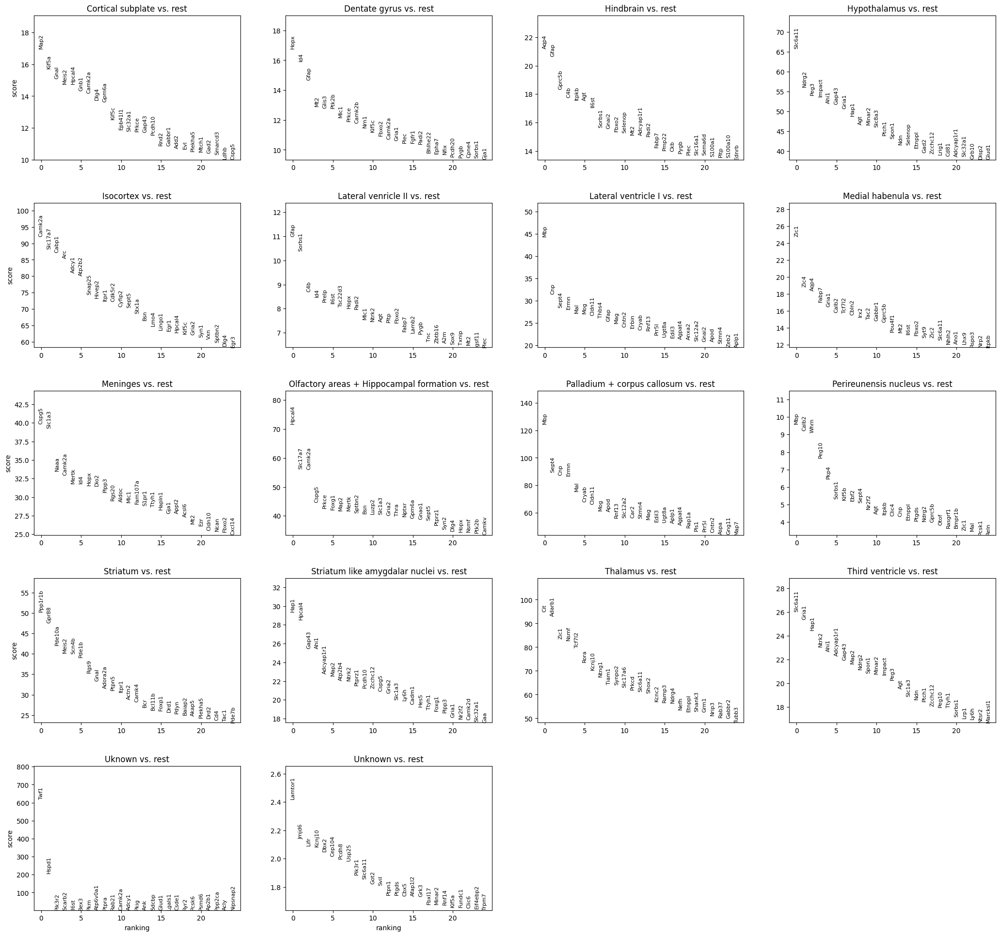

Cortical subplate
Map2 Kif5a Gnal Meis2 Hpcal4 Gnb1 Camk2a Dlg4 Gpm6a Kif5c
 
Dentate gyrus
Hopx Id4 Gfap Mt2 Glis3 Ptk2b Mlc1 Prkce Camk2b Nrn1
 
Hindbrain
Aqp4 Gfap Gprc5b C4b Itpkb Agt Il6st Sorbs1 Gnai2 Fbxo2
 
Hypothalamus
Slc6a11 Ndrg2 Peg3 Impact Ahi1 Gap43 Gria1 Hap1 Agt Minar2
 
Isocortex
Camk2a Slc17a7 Cabp1 Arc Adcy1 Atp2b2 Snap25 Hivep2 Itpr1 Cdk5r2
 
Lateral venricle II
Gfap Sorbs1 C4b Id4 Prelp Il6st Tsc22d3 Hopx Padi2 Mlc1
 
Lateral ventricle I
Mbp Cnp Sept4 Ermn Mal Mog Cldn11 Thbs4 Gfap Mag
 
Medial habenula
Zic1 Zic4 Aqp4 Fabp7 Gria1 Calb2 Tcf7l2 Cbln2 Irx2 Tac2
 
Meninges
Cspg5 Slc1a3 Naaa Camk2a Mertk Id4 Hopx Dio2 Plpp3 Rgs20
 
Olfactory areas + Hippocampal formation
Hpcal4 Slc17a7 Camk2a Cspg5 Prkce Foxg1 Map2 Mertk Sptbn2 Bsn
 
Palladium + corpus callosum
Mbp Sept4 Cnp Ermn Mal Cryab Cldn11 Mog Apod Rnf13
 
Perireunensis nucleus
Mbp Calb2 Whrn Peg10 Pkp4 Sorbs1 Kif5b Ebf2 Sept4 Nr2f2
 
Striatum
Ppp1r1b Gpr88 Pde10a Meis2 Scn4b Pde1b Rgs9 Gnal Adora2a Ptpn5
 
Stri

In [191]:
adata_mTDSB = adata[adata.obs.condition == 'mtDSB']
sc.tl.rank_genes_groups(adata_mTDSB, groupby='compartment', method='t-test')
# See top 5 marker genes per cluster
sc.pl.rank_genes_groups(adata_mTDSB, n_genes=25, sharey=False)

marker_genes = pd.DataFrame({
    group: adata_mTDSB.uns['rank_genes_groups']['names'][group][:10]
    for group in adata_mTDSB.uns['rank_genes_groups']['names'].dtype.names
})
marker_genes.head()
#marker_genes.to_csv('../data/broad_markers_leiden0-5.csv')
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

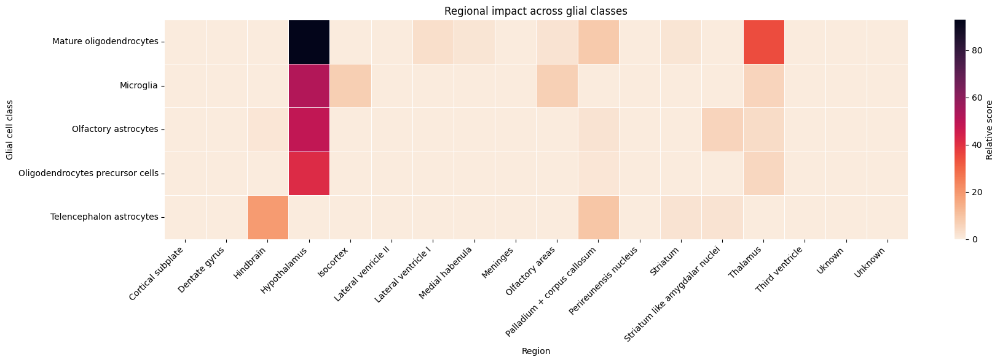

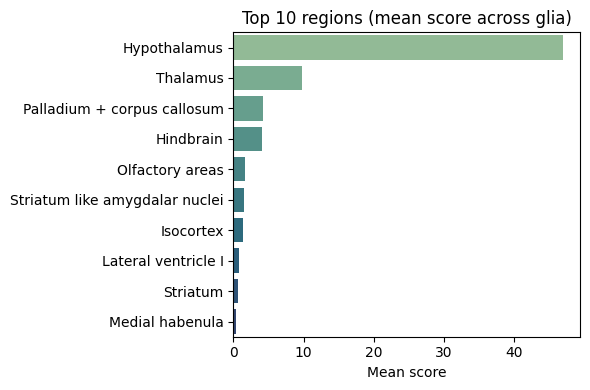

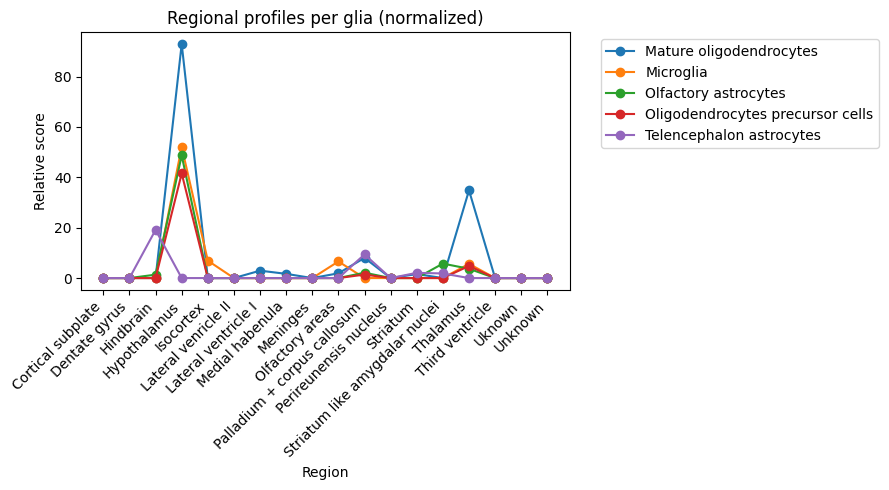

In [187]:


mat, df_all = plot_integrated_region_scores(
    region_dict,
    cmap="rocket_r",
    normalize=False,
    #save="figs/glia_region_impact"
)

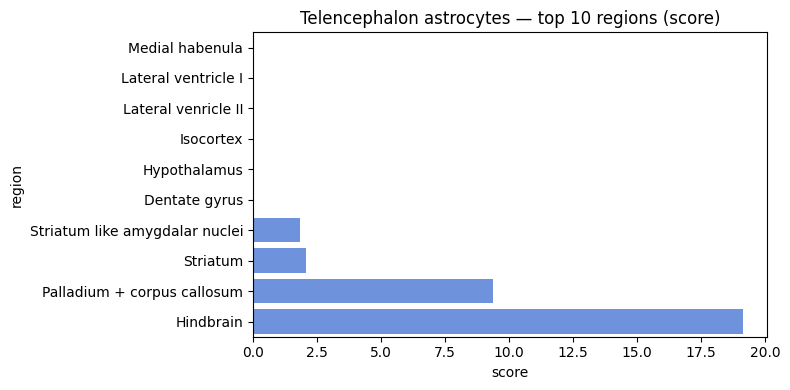

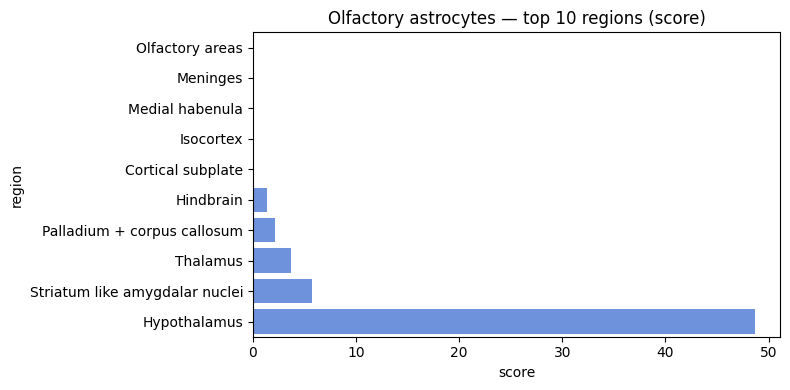

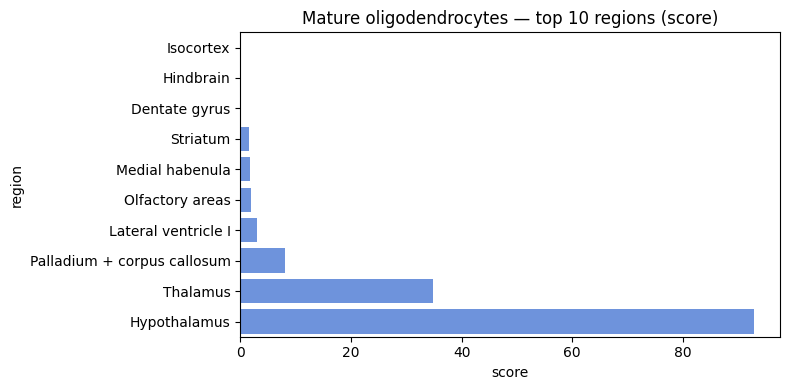

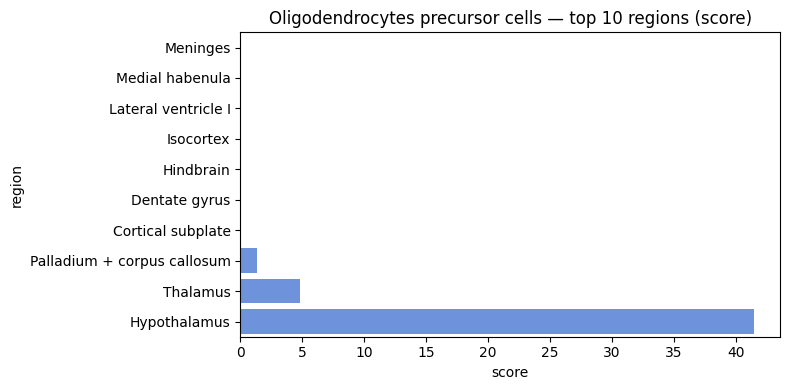

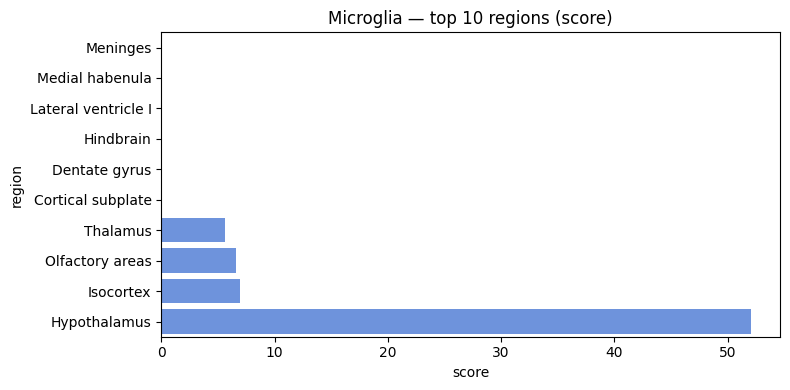

ValueError: the 'keepdims' parameter is not supported in the pandas implementation of mean()

In [173]:
plot_region_impact_for_glia(
    results_by_region=results_by_region,
    glia_classes=glia_classes,
    summarize_region_impact=summarize_region_impact,  # your existing function
    top_k=10,
    # score_col="sum_neglog10FDR",   # optionally force a column name
    #save_prefix="figs/region_impact"
)

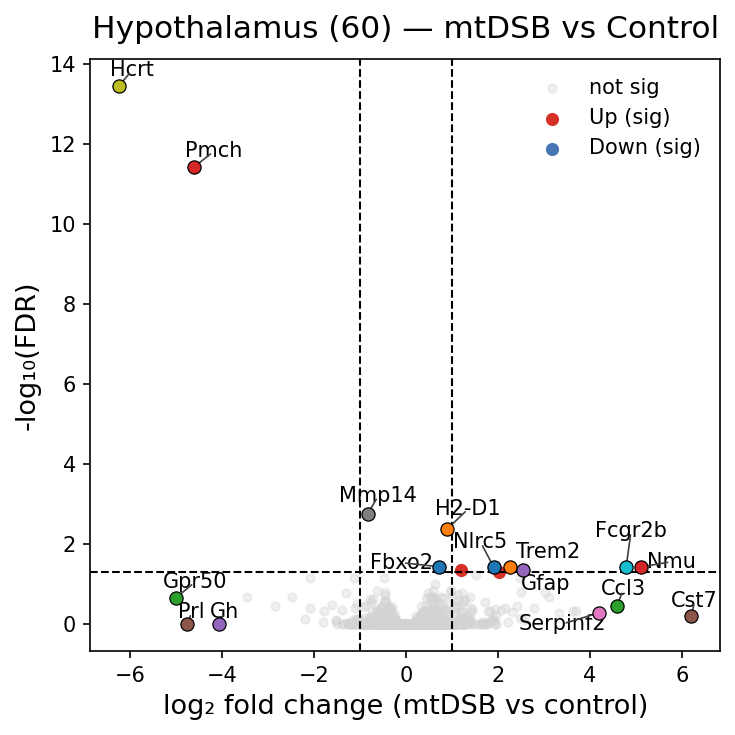

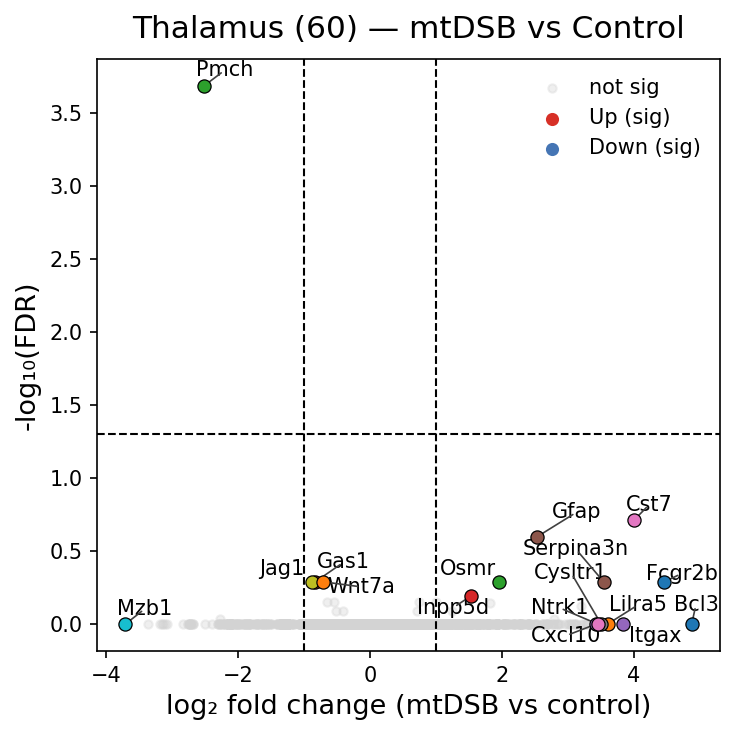

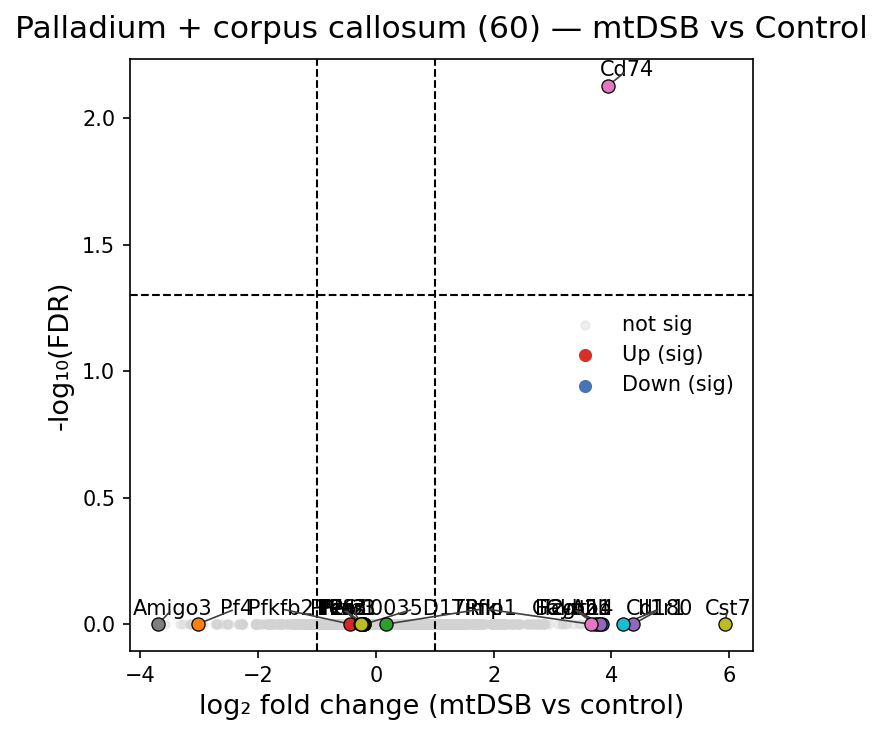

KeyError: 'Lateral ventricle I'

In [118]:
for region in rank_regions.head(10).region:
    res_hypo_60 = results_by_region["Olfactory astrocytes"][region]["simple_effects"]["60"]
    volcano_clean(res_hypo_60, title=region + " (60) — mtDSB vs Control", figsize=(5, 5))

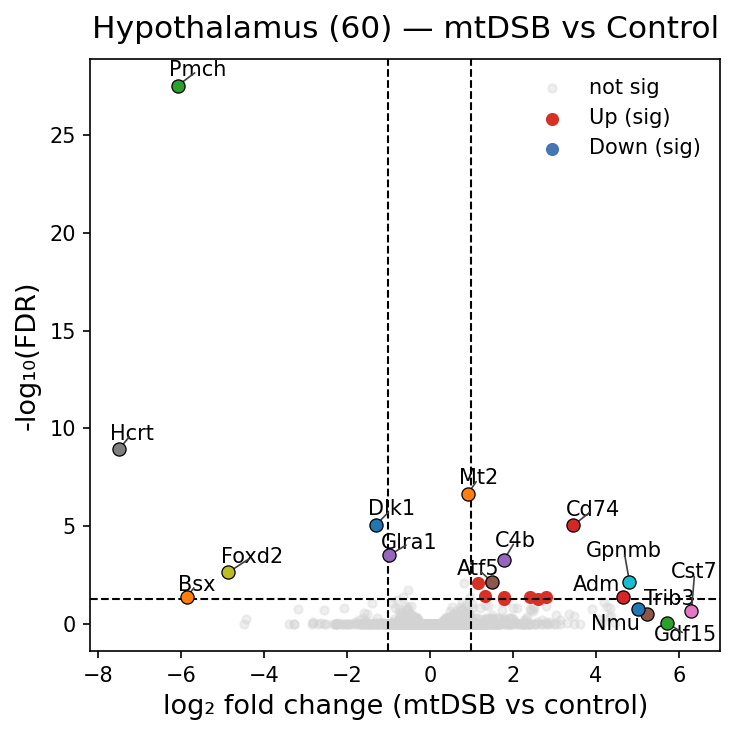

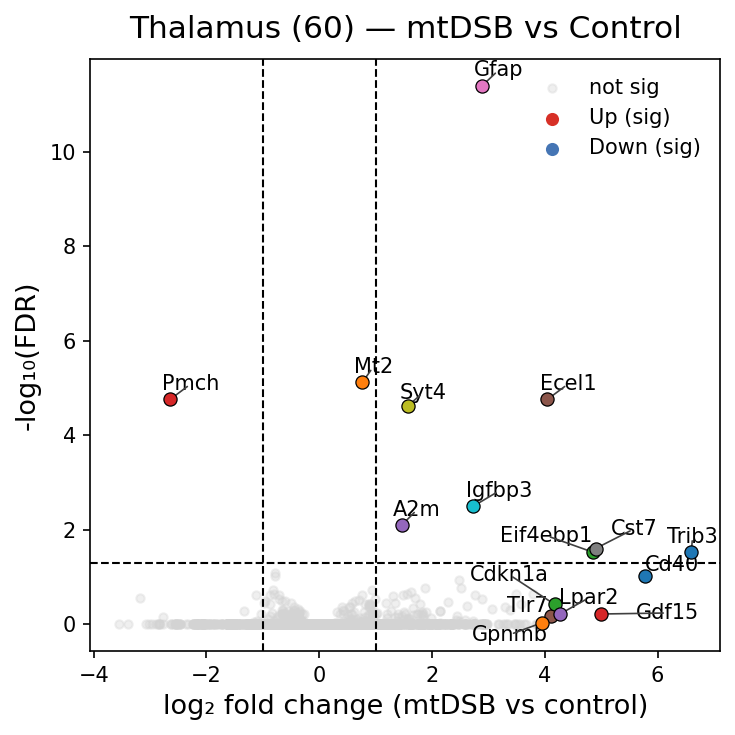

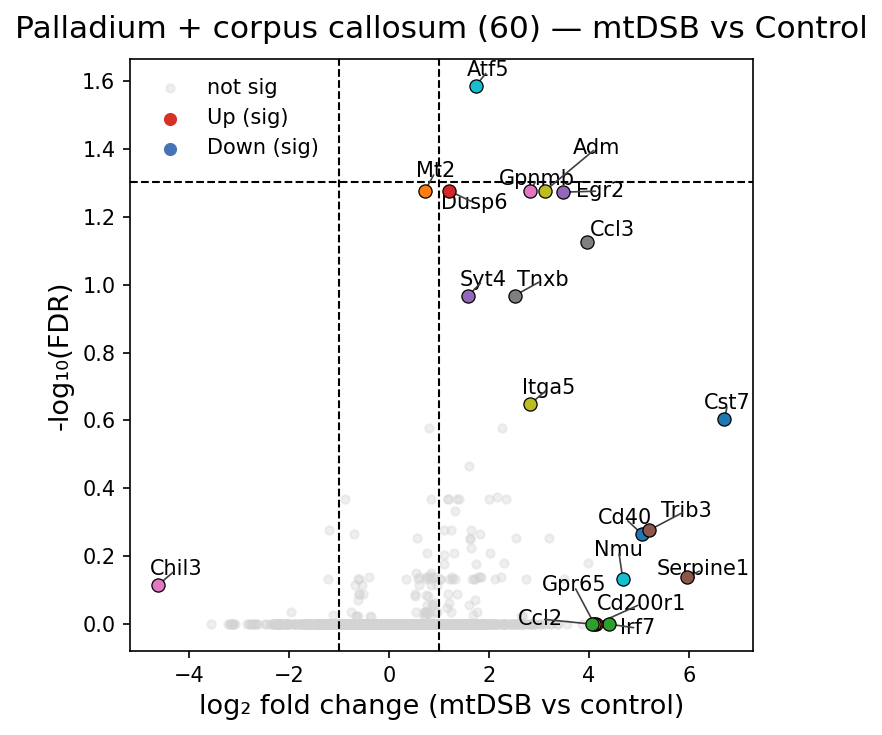

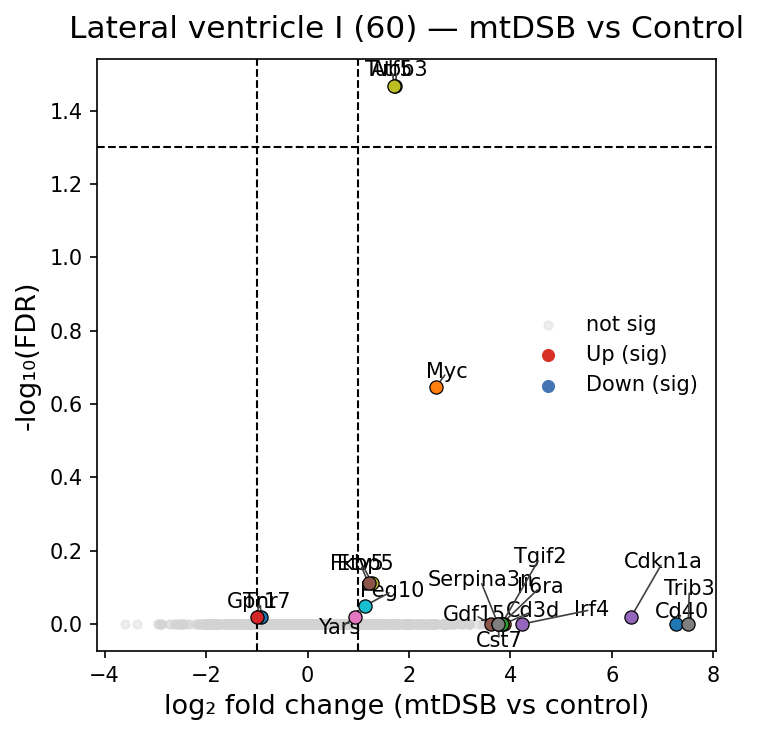

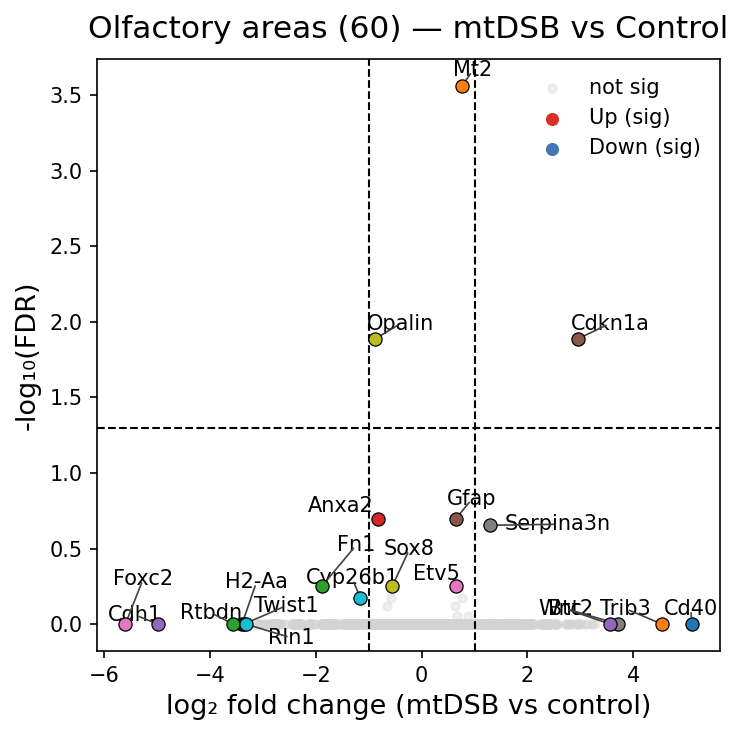

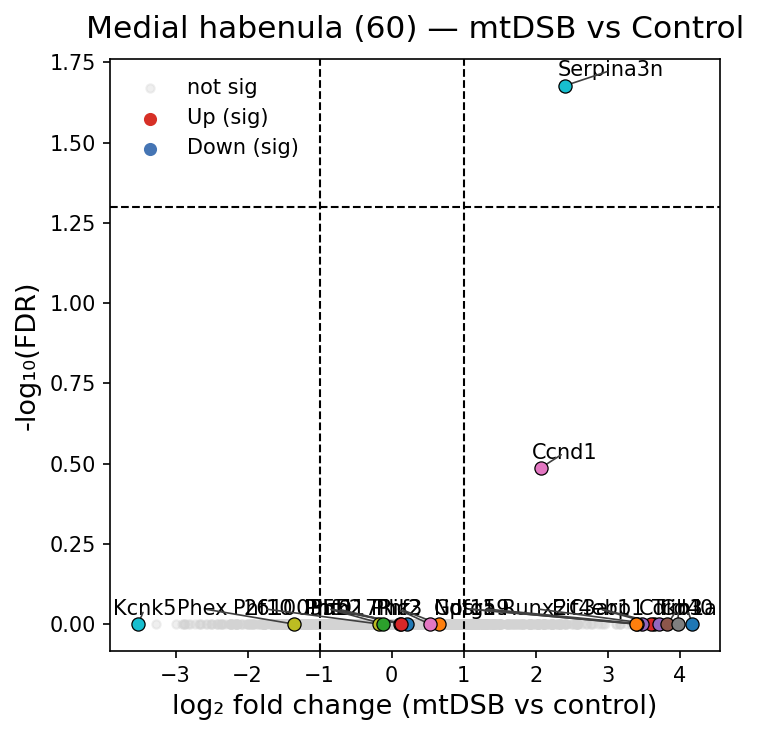

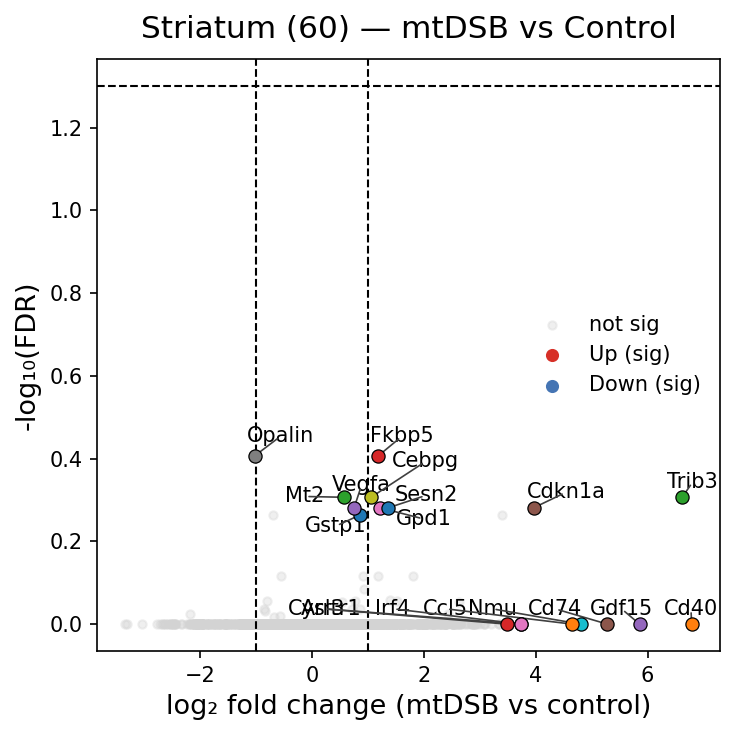

14 [-0.40664005 -0.91395406]
17 [0.82936222 0.50820391]


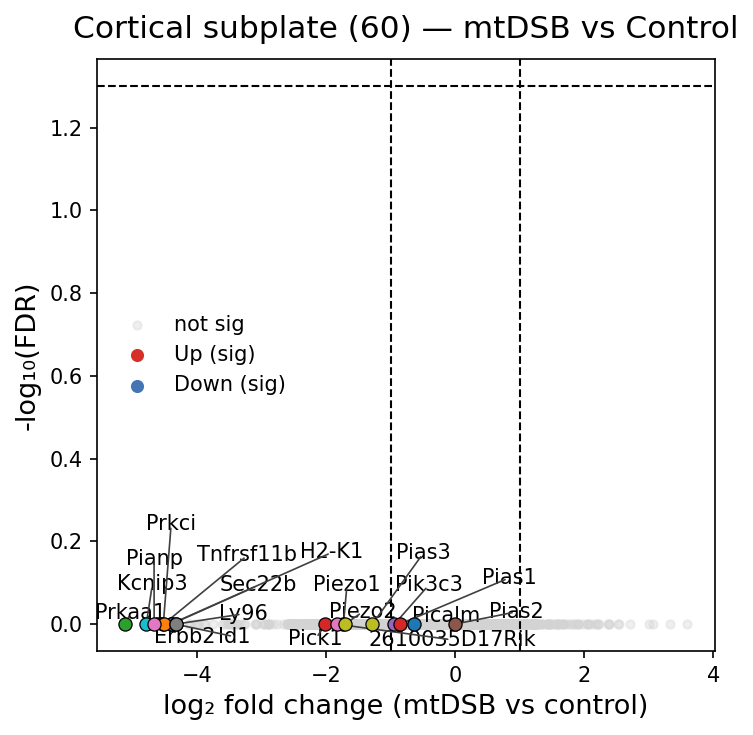

KeyError: '60'

In [119]:
for region in rank_regions.head(10).region:
    res_hypo_60 = results_by_region["Mature oligodendrocytes"][region]["simple_effects"]["60"]
    volcano_clean(res_hypo_60, title=region + " (60) — mtDSB vs Control", figsize=(5, 5))

In [121]:
top_regions = rank_regions.head(15)["region"].tolist()
print("Top affected regions:", top_regions)

Top affected regions: ['Hypothalamus', 'Thalamus', 'Palladium + corpus callosum', 'Lateral ventricle I', 'Olfactory areas', 'Medial habenula', 'Striatum', 'Cortical subplate', 'Perireunensis nucleus', 'Third ventricle', 'Striatum like amygdalar nuclei', 'Meninges', 'Dentate gyrus', 'Lateral venricle II', 'Isocortex']


In [122]:
import numpy as np
import pandas as pd

def extract_top_genes(
    results_by_region,
    cell_class,
    regions=None,
    ages=None,
    padj_thr=0.05,
    lfc_thr=1.0,
    top_n=50
):
    rows = []
    res_cl = results_by_region[cell_class]
    if regions is None:
        regions = list(res_cl.keys())

    for reg in regions:
        reg_data = res_cl.get(reg, {})
        effects = reg_data.get("simple_effects", {})
        if not effects:
            continue

        # normalize available age keys to strings
        avail_age_keys = {str(k): k for k in effects.keys()}
        ages_to_use = [str(a) for a in (ages if ages is not None else effects.keys())]

        for age_str in ages_to_use:
            key = avail_age_keys.get(age_str, None)
            if key is None:
                continue
            res = effects.get(key, None)
            if res is None or res.empty:
                continue

            # standard DESeq2/PyDESeq2 columns
            if ("padj" not in res.columns) or ("log2FoldChange" not in res.columns):
                # skip if table doesn't look like a DE result
                continue

            sig = res[(res["padj"] < padj_thr) & (res["log2FoldChange"].abs() >= lfc_thr)].copy()
            if sig.empty:
                continue

            sig["region"] = reg
            sig["age"] = age_str
            sig["neglog10FDR"] = -np.log10(sig["padj"].clip(lower=1e-300))
            sig.rename(columns={"log2FoldChange": "log2FC"}, inplace=True)

            rows.append(sig[["log2FC", "padj", "neglog10FDR", "region", "age"]])

    if not rows:
        print("No genes passed the thresholds; try relaxing padj_thr or lfc_thr.")
        return pd.DataFrame()

    df = pd.concat(rows).sort_values("neglog10FDR", ascending=False)
    return df.head(top_n)

In [123]:
rank_regions

,region,score
0,Hypothalamus,92.886849
1,Thalamus,34.812953
2,Palladium + corpus callosum,8.007658
3,Lateral ventricle I,2.935740
4,Olfactory areas,1.887628
5,Medial habenula,1.677529
6,Striatum,1.589046
7,Cortical subplate,0.000000
8,Perireunensis nucleus,0.000000
9,Third ventricle,0.000000


,log2FC,padj,neglog10FDR,region,age
Pmch,-6.081558,3.147373e-28,27.502052,Hypothalamus,60
Gfap,2.888829,3.936182e-12,11.404925,Thalamus,60
Hcrt,-7.490894,1.133622e-09,8.945532,Hypothalamus,60
Mt2,0.915402,2.160105e-07,6.665525,Hypothalamus,60
Sst,1.894666,2.333254e-07,6.632038,Hypothalamus,21
...,...,...,...,...,...
Stmn4,-0.470290,6.188786e-01,0.208395,Isocortex,60
Cd82,-0.465894,6.255220e-01,0.203757,Hypothalamus,60
Cebpa,1.100444,6.260033e-01,0.203423,Palladium + corpus callosum,60
Itgb5,0.483585,6.264272e-01,0.203129,Hypothalamus,60


In [125]:
top_regions = rank_regions["region"].tolist()
top_genes = extract_top_genes(results_by_region, "Mature oligodendrocytes", regions=top_regions)
top_genes = top_genes.reset_index()

summary = (
    top_genes.groupby('index')
    .agg(
        n_regions=("region", "nunique"),          # number of regions where gene significant
        mean_LFC=("log2FC", "mean"),              # mean log2 fold change across them
        mean_neglog10FDR=("neglog10FDR", "mean")  # average -log10(FDR)
    )
    .sort_values("n_regions", ascending=False)
)

# your summary df is called `summary` (index=gene; cols: n_regions, mean_LFC, mean_neglog10FDR)
summary = summary.rename(columns={
    summary.columns[0]: "n_regions",
    summary.columns[1]: "mean_LFC",
    summary.columns[2]: "mean_neglog10FDR"
})


from IPython.display import display

summary_styled = (
    summary.head(30)
    .style
    .background_gradient(subset="n_regions", cmap="Purples")
    .bar(subset="mean_LFC", color="lightblue")
    .format({
        "mean_LFC": "{:.2f}",
        "mean_neglog10FDR": "{:.1f}"
    })
    .set_caption("Top 30 genes by number of regions detected")
    .set_table_styles([
        {'selector': 'caption', 'props': [('font-size', '16px'), ('font-weight', 'bold')]}
    ])
)

display(summary_styled)

,n_regions,mean_LFC,mean_neglog10FDR
index,,,
Atf5,3,1.64,1.7
Gfap,2,2.27,5.0
Pmch,2,-4.36,16.1
Ecel1,2,2.84,3.6
Nr4a2,1,-3.38,1.4
Igfbp3,1,2.73,2.5
Msn,1,1.47,2.1
Mt1,1,1.26,2.4
Myc,1,1.79,1.4


In [51]:
top_regions

['Hypothalamus',
 'Thalamus',
 'Palladium + corpus callosum',
 'Lateral ventricle I',
 'Olfactory areas',
 'Medial habenula',
 'Striatum',
 'Cortical subplate',
 'Perireunensis nucleus',
 'Third ventricle',
 'Striatum like amygdalar nuclei',
 'Meninges',
 'Dentate gyrus',
 'Lateral venricle II',
 'Isocortex',
 'Hindbrain',
 'Unknown']

In [52]:
top_genes

,index,log2FC,padj,neglog10FDR,region,age
0,Pmch,-6.081558,3.147373e-28,27.502052,Hypothalamus,60
1,Gfap,2.888829,3.936182e-12,11.404925,Thalamus,60
2,Hcrt,-7.490894,1.133622e-09,8.945532,Hypothalamus,60
3,Sst,1.894666,2.333254e-07,6.632038,Hypothalamus,21
4,Dlk1,-1.291782,8.202660e-06,5.086045,Hypothalamus,60
5,Cd74,3.459638,8.866540e-06,5.052246,Hypothalamus,60
6,Ecel1,4.047177,1.733423e-05,4.761096,Thalamus,60
7,Pmch,-2.644837,1.733423e-05,4.761096,Thalamus,60
8,Syt4,1.575409,2.344469e-05,4.629955,Thalamus,60
9,Fezf1,3.958923,9.654090e-05,4.015289,Hypothalamus,21


In [131]:
from IPython.display import display
import pandas as pd

def summarize_de_by_region(
    results_by_region,
    cell_class,
    regions=None,          # list or None
    ages=None,             # list or None
    padj_thr=0.05,
    lfc_thr=1.0,
    top_n=500,             # how many rows to pull from extract_top_genes
    top_k_display=30,      # how many rows to show in the styled table
    caption="Top genes by number of regions detected",
    show=True,             # display styled table in notebook
    save_csv_path=None,    # e.g. "summary_by_region.csv"
):
    """
    Run extract_top_genes() and summarize per gene across regions.
    Returns (summary_df, styled_table_or_None).
    """
    # 1) collect significant genes across region/age
    top_genes = extract_top_genes(
        results_by_region=results_by_region,
        cell_class=cell_class,
        regions=regions,
        ages=ages,
        padj_thr=padj_thr,
        lfc_thr=lfc_thr,
        top_n=top_n,
    )
    if top_genes is None or top_genes.empty:
        print("No genes passed thresholds.")
        return pd.DataFrame(), None

    # 2) summarize per gene (index is gene name)
    # robust to any index name by grouping on index level 0
    summary = (
        top_genes.groupby(level=0)
        .agg(
            n_regions=("region", "nunique"),
            mean_LFC=("log2FC", "mean"),
            mean_neglog10FDR=("neglog10FDR", "mean"),
        )
        .sort_values("n_regions", ascending=False)
    )

    if save_csv_path:
        summary.to_csv(save_csv_path)

    # 3) optional pretty styling for slides
    styled = (
        summary.head(top_k_display)
        .style
        .background_gradient(subset="n_regions", cmap="Purples")
        .bar(subset="mean_LFC", color="lightblue")
        .format({"mean_LFC": "{:.2f}", "mean_neglog10FDR": "{:.1f}"})
        .set_caption(caption)
        .set_table_styles([{'selector': 'caption',
                            'props': [('font-size', '16px'), ('font-weight', 'bold')]}])
    )

    if show:
        display(styled)

    return summary, styled

In [136]:
ct = "Microglia"
summary, styled = summarize_de_by_region(
    results_by_region,
    cell_class=ct,
    regions=top_regions,          # or None for all
    ages=["21","60"],
    padj_thr=1.0,
    lfc_thr=0.0,
    top_n=500,
    top_k_display=30,
    caption=ct+": top 30 genes by number of regions detected",
    #save_csv_path="mature_oligodendrocytes_summary.csv",
)

,n_regions,mean_LFC,mean_neglog10FDR
Ddit4,5,1.04,2.9
Axl,3,2.36,0.8
Whrn,3,-0.86,0.5
H2-Ab1,3,3.25,0.6
H2-Aa,3,5.57,0.5
Ank,3,1.30,1.0
Csf1,2,3.16,0.8
Cx3cr1,2,-0.60,0.9
Tec,2,0.42,0.0
Snta1,2,0.11,0.0


In [138]:
ct = "Olfactory astrocytes"
summary, styled = summarize_de_by_region(
    results_by_region,
    cell_class=ct,
    regions=top_regions,          # or None for all
    ages=["21","60"],
    padj_thr=1.0,
    lfc_thr=0.0,
    top_n=500,
    top_k_display=30,
    caption=ct+": top 30 genes by number of regions detected",
    #save_csv_path="mature_oligodendrocytes_summary.csv",
)

,n_regions,mean_LFC,mean_neglog10FDR
Mt1,3,0.82,0.6
Osmr,3,2.29,0.4
C4b,3,2.03,0.7
Cst7,2,5.11,0.5
Trem2,2,1.76,0.8
Sox8,2,-0.56,0.4
Snap25,2,1.89,0.4
Cd14,2,1.54,0.1
Prelp,2,-0.65,0.0
Cd74,2,3.21,1.1


In [139]:
ct = "Mature oligodendrocytes"
summary, styled = summarize_de_by_region(
    results_by_region,
    cell_class=ct,
    regions=top_regions,          # or None for all
    ages=["21","60"],
    padj_thr=1.0,
    lfc_thr=0.0,
    top_n=500,
    top_k_display=30,
    caption=ct+": top 30 genes by number of regions detected",
    #save_csv_path="mature_oligodendrocytes_summary.csv",
)

,n_regions,mean_LFC,mean_neglog10FDR
Atf5,6,1.63,1.1
Mt2,6,0.71,3.1
Cdkn1a,5,3.42,0.7
Serpina3n,5,2.50,0.7
Sox8,5,-0.67,0.5
Trib3,5,5.68,0.7
Sesn2,5,1.26,0.6
Ddit3,4,0.83,0.6
Gabra2,4,1.14,0.5
Cebpg,4,0.98,0.3


In [140]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_de_summary_bars(summary: pd.DataFrame, top_k=30, save=None, title=None):
    """
    Two-panel figure:
      (A) n_regions per gene (horizontal bars)
      (B) mean_LFC per gene (colored by sign, value labels optional)
    """
    df = summary.head(top_k).copy()
    df = df.iloc[::-1]  # plot top at top
    fig, axes = plt.subplots(1, 2, figsize=(12, 0.35*len(df)+2), gridspec_kw=dict(wspace=0.25))

    # Panel A: n_regions
    sns.barplot(ax=axes[0], y=df.index, x="n_regions", data=df, color="#6C5CE7")
    axes[0].set_title("(A) Regions per gene")
    axes[0].set_xlabel("# regions"); axes[0].set_ylabel("")

    # Panel B: mean_LFC with sign color
    palette = df["mean_LFC"].apply(lambda v: "#2ECC71" if v>0 else "#E74C3C")
    axes[1].barh(df.index, df["mean_LFC"], color=palette)
    axes[1].axvline(0, color="k", lw=0.7, alpha=0.6)
    axes[1].set_title("(B) Mean log2FC")
    axes[1].set_xlabel("mean log2FC"); axes[1].set_ylabel("")

    if title:
        fig.suptitle(title, y=1.02, fontsize=14, fontweight="bold")
    plt.tight_layout()
    if save:
        fig.savefig(save, dpi=300, bbox_inches="tight")
    plt.show()


def plot_de_summary_bubbles(summary: pd.DataFrame, top_k=30, save=None, title=None):
    """
    Bubble plot: x = mean_LFC, y = gene, size = n_regions, color = mean_neglog10FDR
    """
    df = summary.head(top_k).copy().sort_values("mean_LFC")
    plt.figure(figsize=(8, 0.35*len(df)+2))
    sc = plt.scatter(
        df["mean_LFC"], np.arange(len(df)),
        s=60 + 60*df["n_regions"],    # bigger = found in more regions
        c=df["mean_neglog10FDR"], cmap="coolwarm", edgecolor="k", linewidth=0.3
    )
    plt.yticks(np.arange(len(df)), df.index)
    plt.xlabel("mean log2FC"); plt.ylabel("")
    plt.axvline(0, color="k", lw=0.7, alpha=0.6)
    cbar = plt.colorbar(sc); cbar.set_label("mean -log10(FDR)")
    if title:
        plt.title(title)
    plt.tight_layout()
    if save:
        plt.savefig(save, dpi=300, bbox_inches="tight")
    plt.show()


def plot_region_presence_heatmap(top_genes: pd.DataFrame, top_k=30, save=None, title=None):
    """
    Heatmap of region presence/sign for the top_k recurrent genes.
    Expects columns: ['region','log2FC'] in top_genes (long format).
    Cell values: sign(log2FC) ∈ {-1, 0, +1}
    """
    genes = (top_genes.index.value_counts().sort_values(ascending=False).head(top_k).index)
    df = top_genes.loc[genes]
    mat = (df.assign(sign=np.sign(df["log2FC"]))
             .pivot_table(index=df.index, columns="region", values="sign", aggfunc="mean")
             .fillna(0.0)
             .sort_index())

    plt.figure(figsize=(0.6*mat.shape[1]+4, 0.35*mat.shape[0]+2))
    sns.heatmap(mat, cmap=sns.color_palette(["#E74C3C", "#EEEEEE", "#2ECC71"], as_cmap=True),
                vmin=-1, vmax=1, linewidths=0.5, linecolor="white", cbar=False)
    plt.xlabel("Region"); plt.ylabel("")
    if title:
        plt.title(title)
    plt.tight_layout()
    if save:
        plt.savefig(save, dpi=300, bbox_inches="tight")
    plt.show()

,n_regions,mean_LFC,mean_neglog10FDR
Atf5,6,1.63,1.1
Mt2,6,0.71,3.1
Cdkn1a,5,3.42,0.7
Serpina3n,5,2.50,0.7
Sox8,5,-0.67,0.5
Trib3,5,5.68,0.7
Sesn2,5,1.26,0.6
Ddit3,4,0.83,0.6
Gabra2,4,1.14,0.5
Cebpg,4,0.98,0.3


/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/1928400061.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


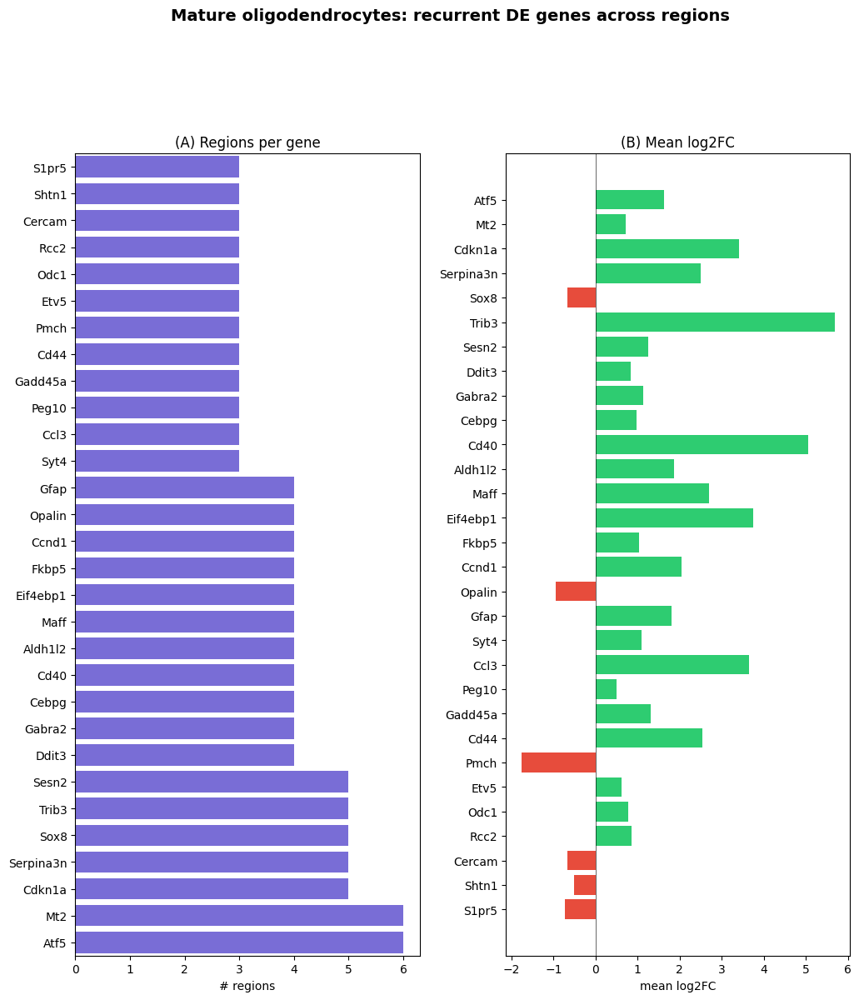

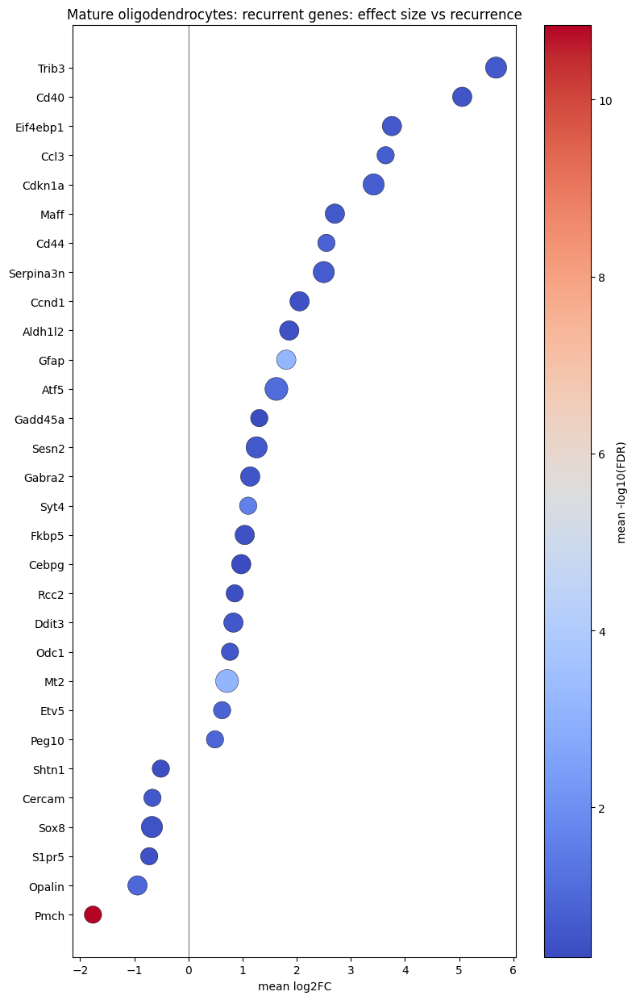

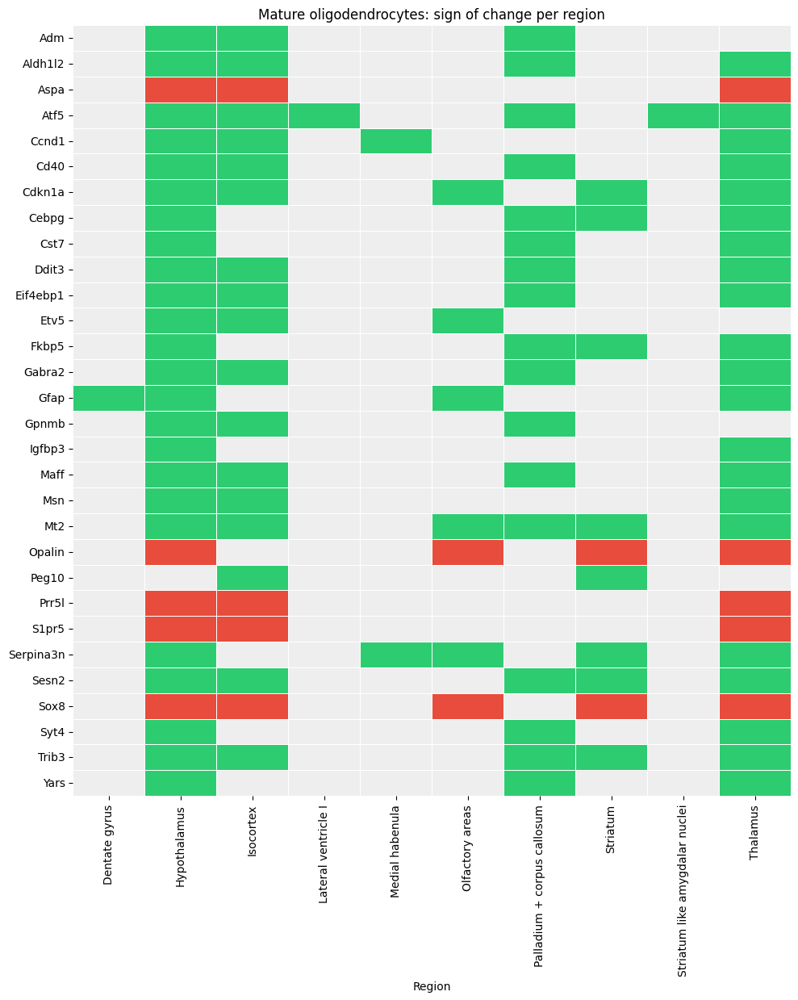

In [148]:
ct = "Mature oligodendrocytes"
# After you run summarize_de_by_region(...)
summary, _ = summarize_de_by_region(
    results_by_region,
    cell_class=ct,
    regions=top_regions,
    caption=ct + ': top genes by number of regions detected', 
    ages=["21","60"],
    padj_thr=1.0, lfc_thr=0.0, top_n=500, top_k_display=30
)

# 1) Bars (regions + mean LFC)
plot_de_summary_bars(summary, top_k=30,
                     title=ct + ": recurrent DE genes across regions",
                     #save="summary_bars.png"
                    )

# 2) Bubble plot (nice single-panel summary)
plot_de_summary_bubbles(summary, top_k=30,
                        title=ct + ": recurrent genes: effect size vs recurrence",
                        #save="summary_bubbles.png
                        )

# 3) Heatmap of presence/sign by region (needs the long table)
top_genes = extract_top_genes(results_by_region, ct,
                              regions=top_regions, ages=["21","60"],
                              padj_thr=1.0, lfc_thr=0.0, top_n=500)
plot_region_presence_heatmap(top_genes, top_k=30,
                             title=ct + ": sign of change per region",
                             #save="region_presence_heatmap.png"
                            )

,n_regions,mean_LFC,mean_neglog10FDR
Ddit4,5,1.04,2.9
Axl,3,2.36,0.8
Whrn,3,-0.86,0.5
H2-Ab1,3,3.25,0.6
H2-Aa,3,5.57,0.5
Ank,3,1.30,1.0
Csf1,2,3.16,0.8
Cx3cr1,2,-0.60,0.9
Tec,2,0.42,0.0
Snta1,2,0.11,0.0


/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/1928400061.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


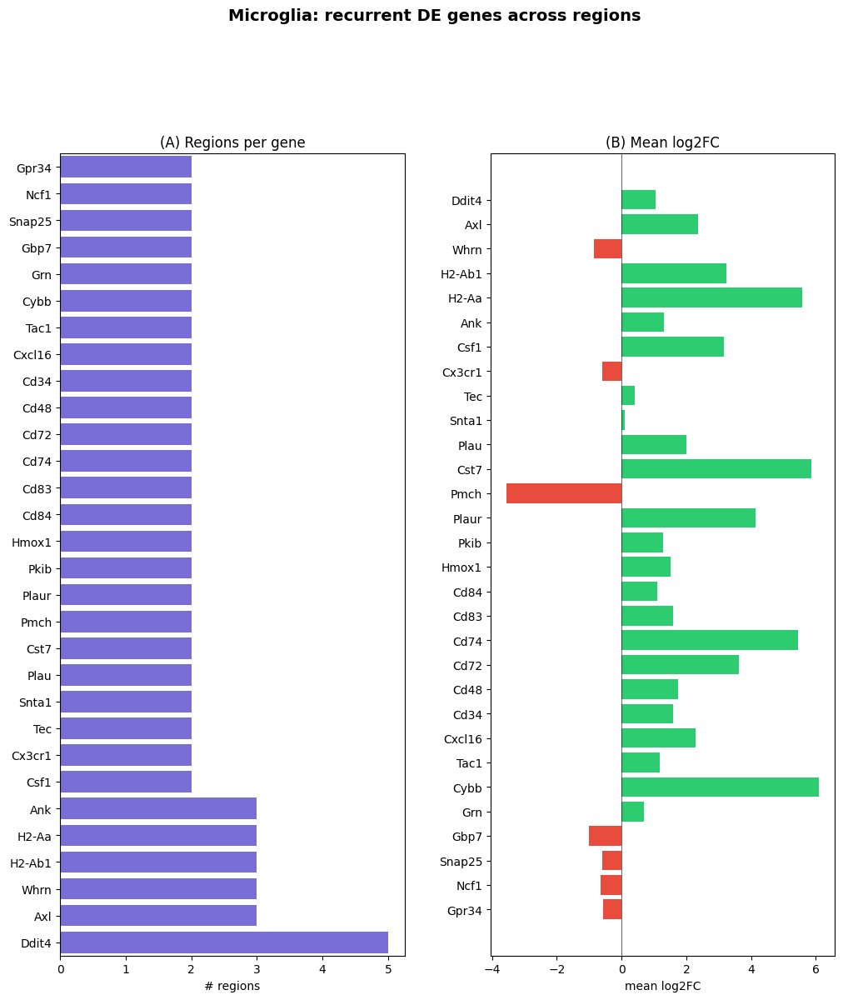

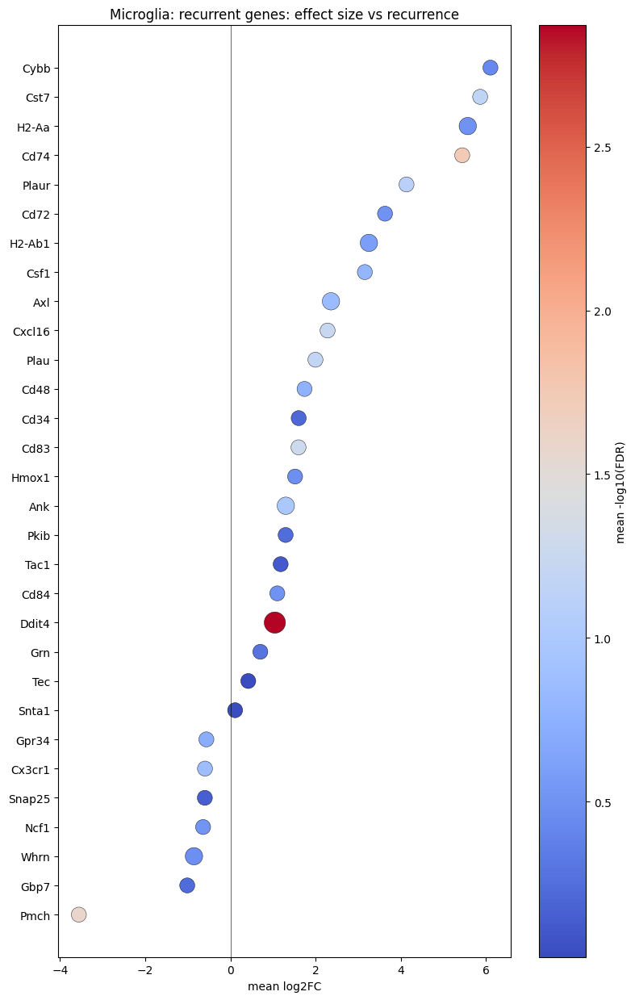

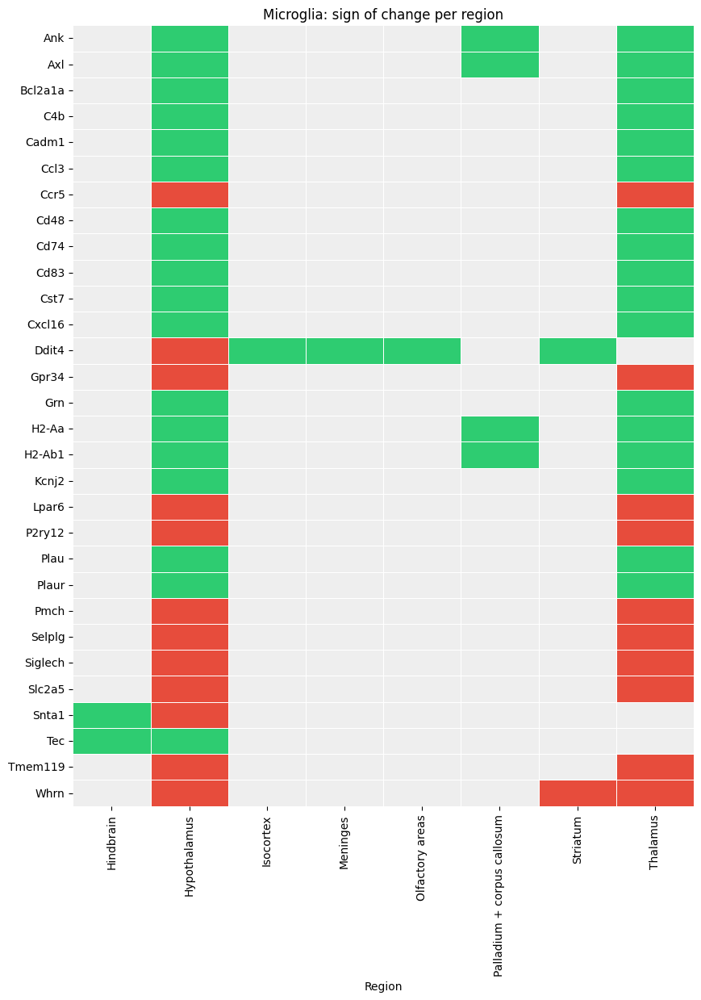

In [147]:
ct = "Microglia"
# After you run summarize_de_by_region(...)
summary, _ = summarize_de_by_region(
    results_by_region,
    cell_class=ct,
    regions=top_regions,
    caption=ct + ': top genes by number of regions detected', 
    ages=["21","60"],
    padj_thr=1.0, lfc_thr=0.0, top_n=500, top_k_display=30
)

# 1) Bars (regions + mean LFC)
plot_de_summary_bars(summary, top_k=30,
                     title=ct + ": recurrent DE genes across regions",
                     #save="summary_bars.png"
                    )

# 2) Bubble plot (nice single-panel summary)
plot_de_summary_bubbles(summary, top_k=30,
                        title=ct + ": recurrent genes: effect size vs recurrence",
                        #save="summary_bubbles.png
                        )

# 3) Heatmap of presence/sign by region (needs the long table)
top_genes = extract_top_genes(results_by_region, ct,
                              regions=top_regions, ages=["21","60"],
                              padj_thr=1.0, lfc_thr=0.0, top_n=500)
plot_region_presence_heatmap(top_genes, top_k=30,
                             title=ct + ": sign of change per region",
                             #save="region_presence_heatmap.png"
                            )

,n_regions,mean_LFC,mean_neglog10FDR
Mt1,3,0.82,0.6
Osmr,3,2.29,0.4
C4b,3,2.03,0.7
Cst7,2,5.11,0.5
Trem2,2,1.76,0.8
Sox8,2,-0.56,0.4
Snap25,2,1.89,0.4
Cd14,2,1.54,0.1
Prelp,2,-0.65,0.0
Cd74,2,3.21,1.1


/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/1928400061.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


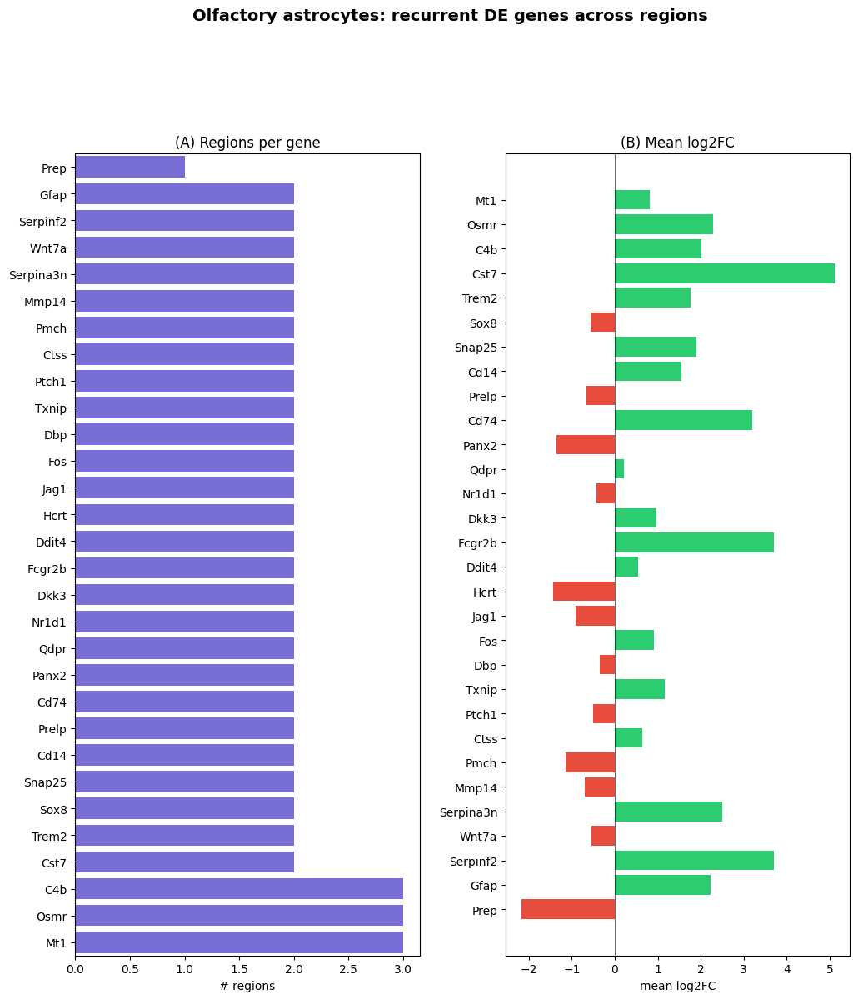

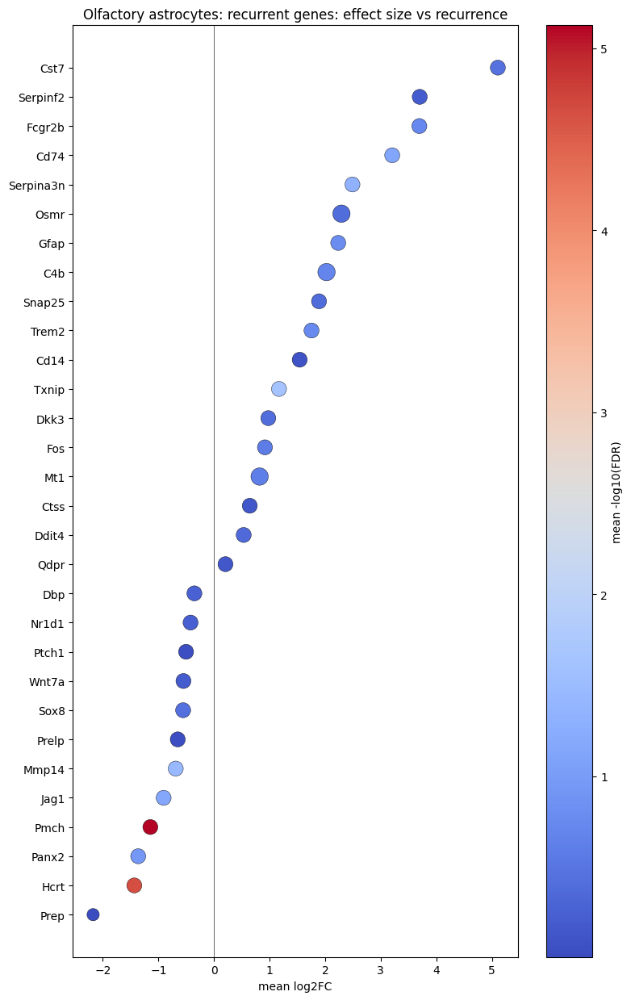

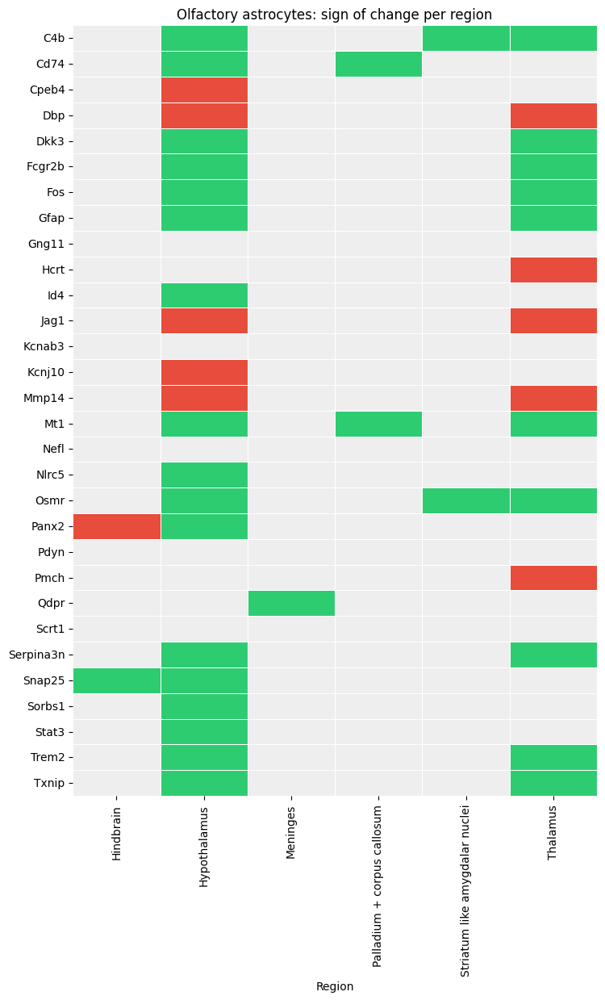

In [146]:
ct = "Olfactory astrocytes"
# After you run summarize_de_by_region(...)
summary, _ = summarize_de_by_region(
    results_by_region,
    cell_class=ct,
    regions=top_regions,
    caption=ct + ': top genes by number of regions detected', 
    ages=["21","60"],
    padj_thr=1.0, lfc_thr=0.0, top_n=500, top_k_display=30
)

# 1) Bars (regions + mean LFC)
plot_de_summary_bars(summary, top_k=30,
                     title=ct + ": recurrent DE genes across regions",
                     #save="summary_bars.png"
                    )

# 2) Bubble plot (nice single-panel summary)
plot_de_summary_bubbles(summary, top_k=30,
                        title=ct + ": recurrent genes: effect size vs recurrence",
                        #save="summary_bubbles.png
                        )

# 3) Heatmap of presence/sign by region (needs the long table)
top_genes = extract_top_genes(results_by_region, ct,
                              regions=top_regions, ages=["21","60"],
                              padj_thr=1.0, lfc_thr=0.0, top_n=500)
plot_region_presence_heatmap(top_genes, top_k=30,
                             title=ct + ": sign of change per region",
                             #save="region_presence_heatmap.png"
                            )

,n_regions,mean_LFC,mean_neglog10FDR
Atf5,6,1.63,1.1
Mt2,6,0.71,3.1
Cdkn1a,5,3.42,0.7
Serpina3n,5,2.50,0.7
Sox8,5,-0.67,0.5
Trib3,5,5.68,0.7
Sesn2,5,1.26,0.6
Ddit3,4,0.83,0.6
Gabra2,4,1.14,0.5
Cebpg,4,0.98,0.3


/var/folders/pm/2253tbm54v36j0l7lhshq73r0000gn/T/ipykernel_9565/1928400061.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


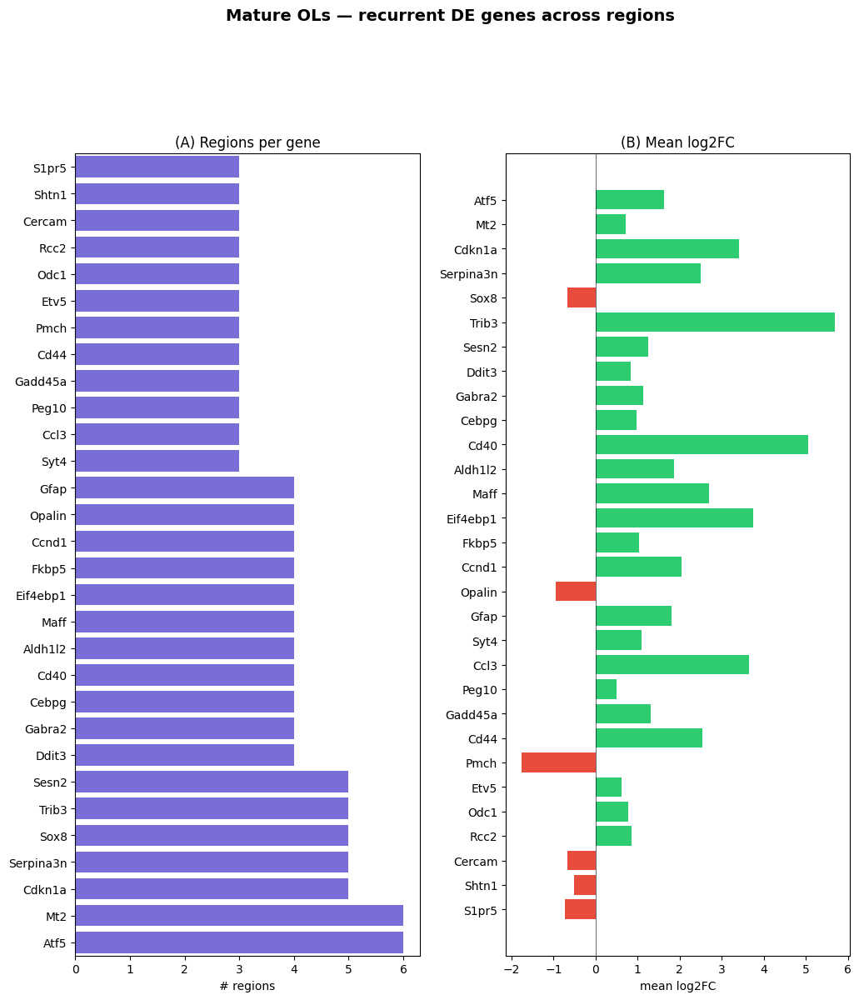

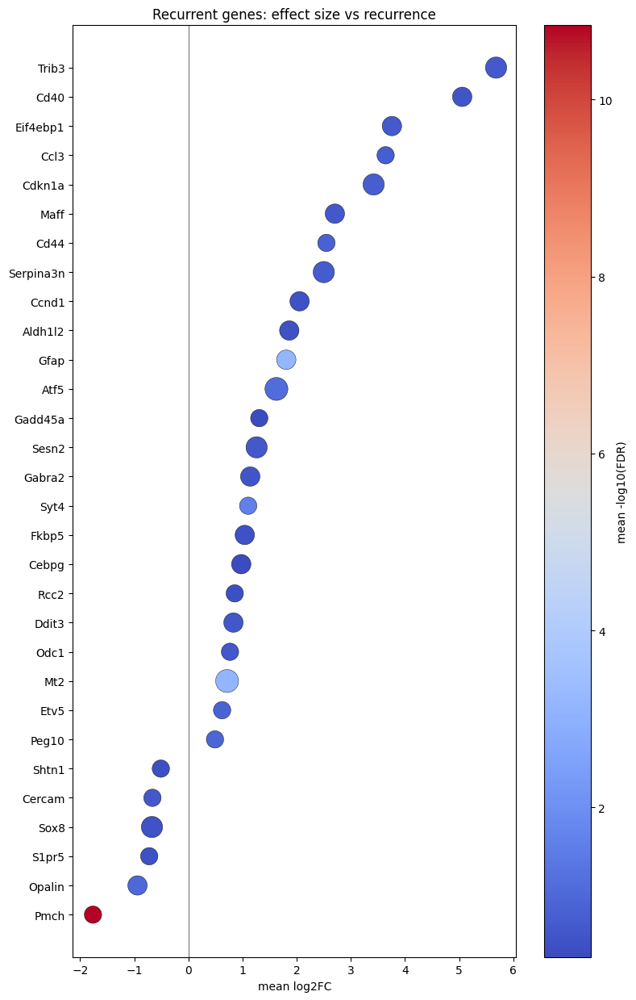

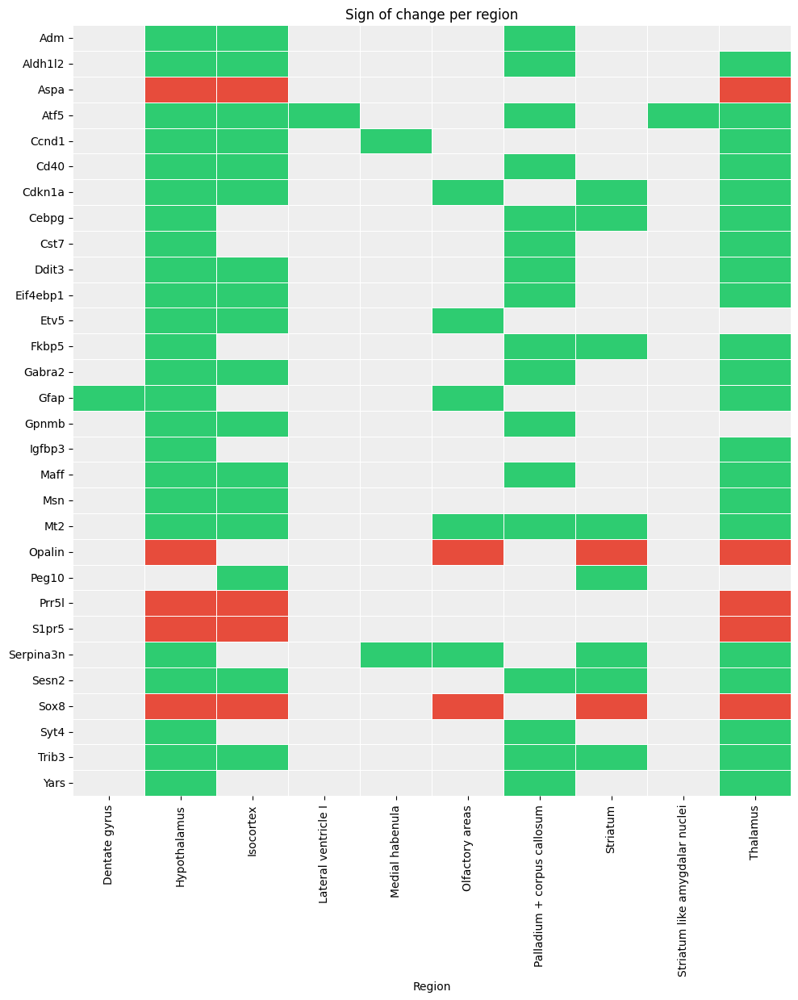

In [141]:
# After you run summarize_de_by_region(...)
summary, _ = summarize_de_by_region(
    results_by_region,
    cell_class="Mature oligodendrocytes",
    regions=top_regions,
    ages=["21","60"],
    padj_thr=1.0, lfc_thr=0.0, top_n=500, top_k_display=30
)

# 1) Bars (regions + mean LFC)
plot_de_summary_bars(summary, top_k=30,
                     title="Mature OLs — recurrent DE genes across regions",
                     save="summary_bars.png")

# 2) Bubble plot (nice single-panel summary)
plot_de_summary_bubbles(summary, top_k=30,
                        title="Recurrent genes: effect size vs recurrence",
                        save="summary_bubbles.png")

# 3) Heatmap of presence/sign by region (needs the long table)
top_genes = extract_top_genes(results_by_region, "Mature oligodendrocytes",
                              regions=top_regions, ages=["21","60"],
                              padj_thr=1.0, lfc_thr=0.0, top_n=500)
plot_region_presence_heatmap(top_genes, top_k=30,
                             title="Sign of change per region",
                             save="region_presence_heatmap.png")

In [91]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def region_gene_matrix(results_by_region, cell_class, genes, ages=None, padj_thr=0.05):
    """
    Build region×gene matrix of log2FC for a given cell_class.
    Rows = "region @ age", Cols = genes.
    Non-significant entries (padj >= padj_thr) are set to NaN.
    """
    rows = []
    res_cl = results_by_region[cell_class]

    for reg, block in res_cl.items():
        se = block.get("simple_effects", {})
        if not se:
            continue

        # Map available age keys to strings so we can match robustly
        age_key_map = {str(k): k for k in se.keys()}
        ages_iter = [str(a) for a in (ages if ages is not None else se.keys())]

        for age_str in ages_iter:
            key = age_key_map.get(age_str)
            if key is None:
                continue
            res = se.get(key)
            if res is None or res.empty:
                continue
            # keep only requested genes that exist
            present = res.index.intersection(genes)
            if len(present) == 0:
                continue

            # standard DESeq2 columns: log2FoldChange, padj
            sub = res.loc[present, ["log2FoldChange", "padj"]].copy()
            # mask non-significant to NaN
            sub.loc[sub["padj"] >= padj_thr, "log2FoldChange"] = np.nan

            row = sub["log2FoldChange"]
            row.name = f"{reg} @ {age_str}"
            rows.append(row)

    if not rows:
        return pd.DataFrame(columns=genes)

    mat = pd.DataFrame(rows).reindex(columns=genes)
    return mat

def heatmap(mat, title):
    if mat.empty:
        print("No data to plot for:", title)
        return
    arr = mat.values.astype(float)
    vmax = np.nanmax(np.abs(arr))
    vmax = 1.0 if not np.isfinite(vmax) or vmax == 0 else vmax
    plt.figure(figsize=(0.5*mat.shape[1]+4, 0.4*mat.shape[0]+3), dpi=150)
    im = plt.imshow(arr, aspect="auto", vmin=-vmax, vmax=+vmax)
    plt.colorbar(im, label="log2FC (mtDSB vs control)")
    plt.yticks(range(mat.shape[0]), mat.index)
    plt.xticks(range(mat.shape[1]), mat.columns, rotation=60, ha="right")
    plt.title(title)
    plt.tight_layout()
    plt.show()

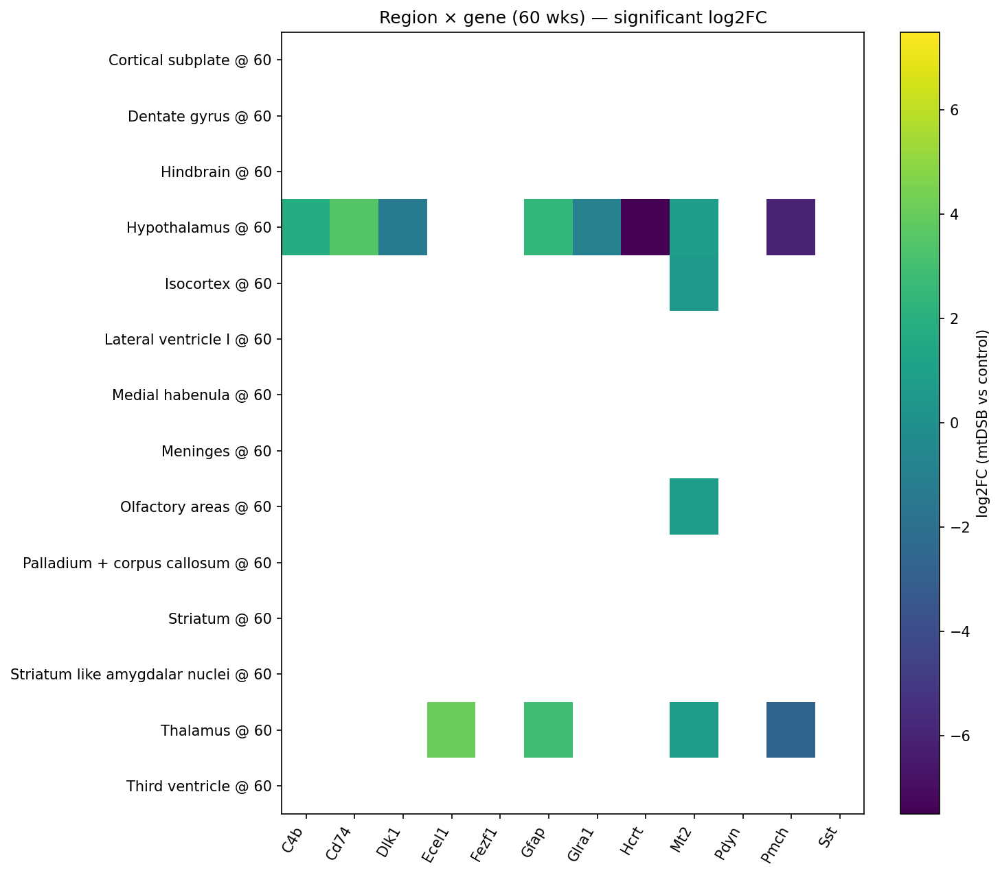

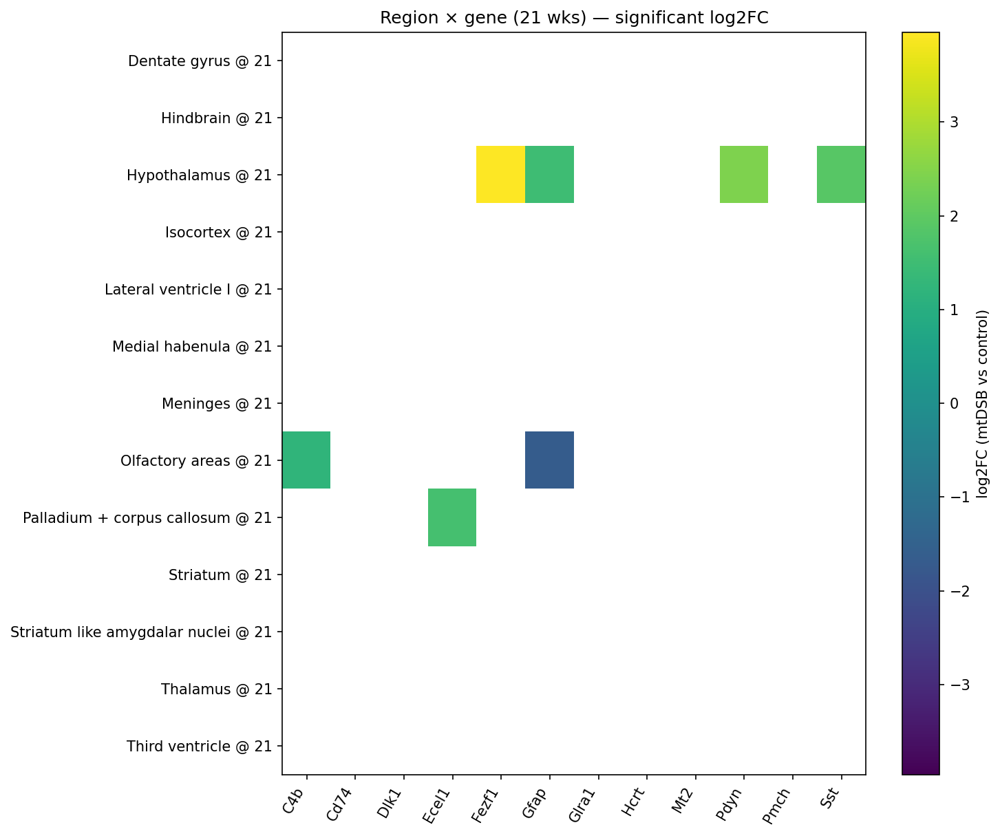

In [92]:
mat60 = region_gene_matrix(results_by_region, "Mature oligodendrocytes", gene_panel, ages=["60"], padj_thr=0.05)
mat21 = region_gene_matrix(results_by_region, "Mature oligodendrocytes", gene_panel, ages=["21"], padj_thr=0.05)

heatmap(mat60, "Region × gene (60 wks) — significant log2FC")
heatmap(mat21, "Region × gene (21 wks) — significant log2FC")

In [93]:
import os
import pandas as pd

def save_all_region_results(results_by_region, outdir="../../results_regionwise"):
    """
    Save all DE results from `results_by_region` into organized subfolders.
    Structure:
        outdir/
          └── <cell_class>/
                ├── <region>/
                │     ├── simple_effect_age_<age>.csv
                │     └── ...
                └── summary_region_impact.csv
    """
    os.makedirs(outdir, exist_ok=True)

    for cell_class, region_dict in results_by_region.items():
        cell_dir = os.path.join(outdir, cell_class.replace(" ", "_"))
        os.makedirs(cell_dir, exist_ok=True)
        print(f"\n📂 Saving {cell_class} ...")

        region_summary_rows = []

        for region, reg_data in region_dict.items():
            reg_dir = os.path.join(cell_dir, region.replace(" ", "_"))
            os.makedirs(reg_dir, exist_ok=True)

            # --- Simple effects per age (mtDSB vs control) ---
            simple_effects = reg_data.get("simple_effects", {})
            for age, df in simple_effects.items():
                if df is not None and not df.empty:
                    fname = f"simple_effect_age_{age}.csv"
                    df.to_csv(os.path.join(reg_dir, fname))
            
            # --- Region-level impact summary ---
            imp = reg_data.get("impact", {})
            for age, metrics in imp.items():
                if metrics:
                    region_summary_rows.append({
                        "region": region,
                        "age": age,
                        "n_sig": metrics.get("n_sig", np.nan),
                        "sum_neglog10q": metrics.get("sum_neglog10q", np.nan),
                    })

        # --- Save region summary table per cell_class ---
        if region_summary_rows:
            summary_df = pd.DataFrame(region_summary_rows)
            summary_df.to_csv(os.path.join(cell_dir, "summary_region_impact.csv"), index=False)

        print(f"✅ Saved regionwise results for {cell_class} to {cell_dir}")

In [94]:
save_all_region_results(results_by_region, outdir="../results/region")


📂 Saving Mature oligodendrocytes ...
✅ Saved regionwise results for Mature oligodendrocytes to ../results/region/Mature_oligodendrocytes

📂 Saving Oligodendrocytes precursor cells ...
✅ Saved regionwise results for Oligodendrocytes precursor cells to ../results/region/Oligodendrocytes_precursor_cells


In [122]:
adata.obs

View of AnnData object with n_obs × n_vars = 184678 × 5101
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'run', 'n_genes_by_counts', 'n_counts', 'n_genes', 'leiden_0.5', 'leiden_1', 'leiden_2', 'cell_class', 'sample_id', 'age', 'sex', 'genotype', 'condition', 'cell_type'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'cell_class_colors', 'cell_type_colors', 'leiden', 'leiden_0.5_colors', 'leiden_1_colors', 'leiden_2_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'sample_id_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'